This notebooks contains all python code to reproduce microbiome results from paper beestrong 2026. R-code can be found here: XXX. Heritability, here: YYY

1. Metadata cleaning
2. Read trimming and host read removal
3. Rarefication experiments
4. Taxonomic classification with Kraken2 and Bracken
5. Genomic Varroa load
6. Abundance tables from Bracken results
7. Symbiosphere characterization (descriptive part)


In [1]:
import pandas as pd
import numpy as np
import subprocess
from tqdm import tqdm as tqdm
from itertools import product, combinations, chain
import glob
import os
from collections import Counter, defaultdict
import requests
from scipy import stats

from bee_metagenomics_lib import (
    write_bs_ids_file, read_bs_ids_file, get_jobs_to_restart, write_array_str, clean_failed_jobs,
    parse_flagstat,
    count_lines_gz,
    get_unmapped_read_nr_flagstat, get_total_read_nr_flagstat, 
    get_kraken2_read_nr, 
    get_desc_taxa,
    parse_breport,
    get_classified_read_nr,
    get_bracken_classified_read_nr
)

from ete3 import NCBITaxa
ncbi = NCBITaxa(dbfile="/cluster/raid/home/f80878961/data/NCBI_taxonomy/ncbi_taxonomy_202502/taxa.sqlite", update=False)

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

# Settings

In [2]:
# # to load historical ncbi taxonomy database (february 2025)
# # https://ftp.ncbi.nlm.nih.gov/pub/taxonomy/taxdump_archive/
# db_path   = "/cluster/raid/home/f80878961/data/NCBI_taxonomy/ncbi_taxonomy_202502/taxa.sqlite"
# dump_path = "/cluster/raid/home/f80878961/data/NCBI_taxonomy/ncbi_taxonomy_202502/taxdump.tar.gz"
# ncbi = NCBITaxa(dbfile=db_path)
# ncbi.update_taxonomy_database(taxdump_file=dump_path)  # creates taxa.sqlite from the ZIP --> need tar.gz ... so unzip rezip

In [3]:
shared_data_path = '/cluster/raid/home/f80878961/data/'
script_path = "/cluster/raid/home/f80878961/scripts/tmp_scripts/"

working_path = '/cluster/raid/home/f80878961/beestrong/'
tlf_path = '{}tlf/'.format(working_path)
metadata_path = '{}00_metadata/'.format(working_path)
pp_path = '{}01_preprocessing/'.format(working_path)
tax_prof_path = '{}02_taxonomic_profiling/'.format(working_path)

metadata_fn = '{}2026_BeeStrong_metadata.csv'.format(metadata_path)
sampled_bs_ids_file = '{}sampled_bs_ids.txt'.format(metadata_path)
all_bs_ids_file = '{}bs_ids.txt'.format(metadata_path)

sra_path = '{}sra/'.format(pp_path) 
fastq_path = '{}fastq/'.format(pp_path) 
bowtie2_path = '{}bowtie2/'.format(pp_path)
idx_name = 'bee3ref_new'
idx_path = '{}{}_bt2idx/'.format(shared_data_path, idx_name)
sample_SRA_file = '{}sample_SRA.csv'.format(tlf_path)

kraken2_path = '{}kraken2/'.format(tax_prof_path)
bracken_path = '{}bracken/'.format(tax_prof_path)
all_kraken2_path = '{}all_kraken2/'.format(tax_prof_path)
all_bracken_path = '{}all_bracken/'.format(tax_prof_path)
kdb_path = '{}krakdb/'.format(shared_data_path)

pheno_df = pd.read_csv(metadata_fn)
all_bs_ids = pheno_df['Colony'].to_list()
# write_bs_ids_file(bs_ids_file, pd.read_csv(metadata_fn)['Colony'].to_list())
pheno_df

,Colony,date,Genetic group,percent_Ligustica_Carnica,percent_Mellifera,percent_Caucasica,bee_weigth,nbr_pho_varroa,nbr_pho_varroa_100bee,v_pho,...,Day of Year,Latitude,Longitude,v_meta,log_v_meta,log_v_pho,log_v_mito,Varroa group,Recapping group,DMR group
0,BS16_0001,01/08/2016,hybrid,0.158920,0.712885,0.128195,38.5,55.0,19.0,20.000000,...,214,44.0,5.167,0.000372,-7.895768,2.995732,-1.175053,High,High,Low
1,BS16_0002,01/08/2016,hybrid,0.001545,0.776361,0.222094,36.1,10.0,4.0,3.878116,...,214,44.0,5.167,0.000026,-10.543333,1.355350,-4.171704,Medium,Medium,Low
2,BS16_0003,01/08/2016,hybrid,0.752977,0.206098,0.040926,39.0,12.0,4.0,4.307692,...,214,44.0,5.167,0.000019,-10.854801,1.460402,-4.166909,Low,Medium,Medium
3,BS16_0004,29/09/2016,Mellifera,0.066520,0.829661,0.103819,40.7,12.0,4.0,4.127764,...,273,44.0,5.167,0.000048,-9.937342,1.417736,-3.265586,Medium,High,High
4,BS16_0005,28/07/2016,hybrid,0.578850,0.409558,0.011593,45.0,14.0,4.0,4.355556,...,210,44.0,5.167,0.000062,-9.686216,1.471452,-2.902179,Medium,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1437,BS18_0675,18/10/2018,Ligustica_Carnica,0.999239,0.000041,0.000720,45.0,8.0,2.0,2.488889,...,291,44.0,5.167,0.000061,-9.706052,0.911836,NaN,Medium,Medium,Medium
1438,BS18_0681,17/10/2018,hybrid,0.582663,0.000738,0.416599,47.0,74.0,21.0,22.042553,...,290,43.5,5.167,0.000382,-7.868939,3.092975,-1.063650,High,High,High
1439,BS18_0682,17/10/2018,hybrid,0.414228,0.395046,0.190726,47.0,35.0,10.0,10.425532,...,290,43.5,5.167,0.000143,-8.851630,2.344258,-2.046166,High,High,Low
1440,BS18_0684,17/10/2018,Ligustica_Carnica,0.988999,0.000257,0.010744,64.0,29.0,6.0,6.343750,...,290,43.5,5.167,0.000111,-9.110080,1.847470,-2.482229,High,High,Medium


In [4]:
# define key taxonomic groups
taxa = set(('root', 'Viruses','Bacteria', 'Archaea', 'Eukaryota', 'Embryophyta', 'Fungi', 'Metazoa', 'Anthophila', 'Varroidae'))
taxon2name = {'root': 'Other Root', 'Eukaryota': 'Other Eukaryota', 'Metazoa': 'Other Metazoa', 'Viruses': 'DNA viruses', 'Anthophila': 'Bee leftovers'}
taxa_names = [taxon2name.get(x, x) for x in taxa]
name2tid = {taxon2name.get(k, k): v[0] for k, v in ncbi.get_name_translator(taxa).items()}
tid2name = {v:k for k, v in name2tid.items()}
tree = ncbi.get_topology(list(name2tid.values()))
print(tree)

## figure settings
sns.set_style('whitegrid')
sns.set_context('paper', font_scale=1.2)

# color maps for figures
months = sorted(set(pheno_df['Month'].dropna()))
years = sorted(set(pheno_df['Year'].dropna()))
genetic_groups = sorted(set(pheno_df['Genetic group'].dropna()))

cmap_gengroup = dict(zip(genetic_groups, [x.upper() for x in list(sns.color_palette("colorblind", n_colors=len(genetic_groups)).as_hex())]))

cmap_region = {
    'sweden':'#ece133',
    'netherlands':'#de8f05',
    'luxembourg': '#d55e00',
    'grand_est': '#ca9161',
    'bourgogne_franche_comte': '#795b42',
    'suisse': '#da291c',
    'auvergne_rhone_alpes': '#56b4e9',
    'provence_alpes_cote_azur': '#0173b2',
    'corse': '#3b3b3b',
    'bretagne': '#7b4e72',
    'pays_de_la_loire': '#cc78bc',
    'centre_val_de_loire': '#fbafe4',
    'nouvelle_aquitaine': '#58bea1',
    'occitanie': '#0e7256'
}

taxon_cmap = {
    'Bee leftovers': '#75c8b0',
    'Varroidae': '#ece133',
    'Other Metazoa': '#ca9161',
    'Embryophyta':'#12634c',
    'Fungi': '#cc78bc',
    'Other Eukaryota': '#029e73',
    'Bacteria': '#de8f05',
    'Archaea': '#d55e00',
    'DNA viruses': '#0173b2',
    'Other Root': '#949494'
}

region_order = ['corse', 'occitanie', 'nouvelle_aquitaine', 'provence_alpes_cote_azur', 'auvergne_rhone_alpes', 'pays_de_la_loire', 'centre_val_de_loire', 'suisse',
                  'bourgogne_franche_comte', 'grand_est', 'bretagne', 'luxembourg', 'netherlands', 'sweden']
var2labels = {
    'Region' : {
        'bretagne' : 'Bretagne', 
        'pays_de_la_loire' : 'Pays de la Loire', 
        'centre_val_de_loire' : 'Centre-Val de Loire', 
        'sweden' : 'Sweden', 
        'netherlands' : 'Netherlands', 
        'luxembourg' : 'Luxembourg', 
        'grand_est' : 'Grand Est', 
        'bourgogne_franche_comte' : 'Bourgogne-Franche-Comté',
        'corse':  'Corse', 
        'auvergne_rhone_alpes':'Auvergne-Rhône-Alpes', 
        'provence_alpes_cote_azur' : "Provence-Alpes Côte d'Azur", 
        'suisse' : 'Switzerland', 
        'nouvelle_aquitaine':'Nouvelle-Aquitaine', 
        'occitanie' : 'Occitanie'},
    'Month': ['{} n={}'.format(x, pheno_df['Month'].value_counts()[x])  for x in months],
    'Year': ['{} n={}'.format(x, pheno_df['Year'].value_counts()[x])  for x in years],
    'Genetic group': ['{} n={}'.format(x.replace('_', ' ').capitalize(), pheno_df['Genetic group'].value_counts()[x])  for x in genetic_groups]}


                  /-109261
            /- /-|
         /-|      \-3042114
        |  |
      /-|   \-4751
     |  |
     |   \-3193
   /-|
  |  |--2
--|  |
  |   \-2157
  |
   \-10239


# Shared Lib

In [5]:
def get_level2beexact_taxa():

    url = "https://raw.githubusercontent.com/bdaisley/BEExact/master/full_database/BEEx_v2023.01.30___FL-refs_taxonomy.txt"
    file_content = requests.get(url, verify=False).text

    level2beexact_taxa = defaultdict(set)
    for level in ['d', 'p', 'c', 'o', 'f', 'g', 's']:
        level2beexact_taxa[level] = set()
    
    for line in file_content.split('\n'):
        if not line: continue
        for s in line.rstrip(';').split('\t')[1].split(';'):
            level, taxon = s.split('__')
            assert level in level2beexact_taxa, print('missing {}'.format(level))
            level2beexact_taxa[level].add(taxon.replace('_', ' '))

    return level2beexact_taxa
    
def get_cat_df(bs_ids, databases, cs_thresholds, bowtie2_path, idx_name, kraken2_path,
               bracken_path, krakdb, readpool, mhg, cs, sf, r, level, taxa,
               taxon2name, name2tid, 
              ):

    settings =  product(databases, cs_thresholds)
    
    columns = ['Colony', 'DB', 'CS', 'Category', 'Read Number', 'Relative Abundance', 'Log Relative Abundance']
    rows = []
    
    for bs_id, (krakdb, cs) in product(bs_ids, settings):
    
        total_read_nr = get_total_read_nr_flagstat(bowtie2_path, bs_id, idx_name)
        unmapped_read_nr = get_unmapped_read_nr_flagstat(bowtie2_path, bs_id, idx_name)
    
        # get number of reads classified by Kraken2 + Bracken
        try:
            taxa2seqnr = parse_breport(bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, level, taxa)
        except FileNotFoundError:
            continue
    
        k2_c_read_nr = taxa2seqnr['root']
        rows.append((bs_id, krakdb, cs, 'Classified', k2_c_read_nr, k2_c_read_nr / unmapped_read_nr, np.log(k2_c_read_nr / unmapped_read_nr)))
    
        # get total number of classified reads, including mapped reads (+ pseudo count): used as denominator for relative abundances
        total_c_read_nr = get_classified_read_nr(bowtie2_path, kraken2_path, bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, level, idx_name) + 1
    
        for taxon in taxa:
            name = taxon2name.get(taxon, taxon)
            node = tree&name2tid[name]
            read_nr = taxa2seqnr.get(taxon, 0) - sum([taxa2seqnr.get(x, 0) for x in get_desc_taxa(node, taxa.difference({node.sci_name}))])
    
            # add pseudo count and calculate relative abundance
            read_nr += 1
            rel_abund = read_nr  / total_c_read_nr
            rows.append((bs_id, krakdb, cs, name, read_nr, rel_abund, np.log(rel_abund)))
    
    cat_df = pd.DataFrame(data=rows, columns=columns)
    
    # quick sanity check : sum of read numbers of taxa == classified read number
    for bs_id, (krakdb, cs) in product(bs_ids, settings):
        np.sum(cat_df[(cat_df['Category'] != 'Classified') & (cat_df['Colony'] == bs_id)]['Read Number']) == \
        cat_df[(cat_df['Category'] == 'Classified') & (cat_df['Colony'] == bs_id)] + len(taxa) # because pseudo counts
        
    return cat_df
    
def get_mapping_df(bs_ids, bowtie2_path, idx_name):
    columns = ['Colony', 'Total Read Nr', 'Mapped Read Nr', 'Mapped Read Fraction', 'Unmapped Read Nr', 'Umapped Read Fraction']
    rows = []
    for bs_id in tqdm(bs_ids):
        total_read_nr = get_total_read_nr_flagstat(bowtie2_path, bs_id, idx_name)
        unmapped_read_nr = get_unmapped_read_nr_flagstat(bowtie2_path, bs_id, idx_name)
        mapped_read_nr = total_read_nr - unmapped_read_nr
        rows.append((bs_id, total_read_nr, mapped_read_nr, mapped_read_nr / total_read_nr, unmapped_read_nr, unmapped_read_nr / total_read_nr))
    return  pd.DataFrame(data=rows, columns=columns)
    
def get_bracken_df(
    bowtie2_path, kraken2_path, bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, level, idx_name, taxon_filter):
    '''
    parse bracken file
    '''
    ## parse bracken output
    bracken_fn = '{}{}_{}_{}_mhg{}_cs{}_sf{}_rep{}_{}.bracken'.format(bracken_path, bs_id, krakdb, readpool, mhg, cs, str(sf).replace('.', ''), r, level)
    if not os.path.exists(bracken_fn): 
        print('missing {}'.format(bracken_fn))
        return pd.DataFrame()
    bracken_df = pd.read_csv(bracken_fn, sep='\t')
    
    ## get the number of classified reads (denominator for relative abundance calculations)
    c_read_nr = int(get_classified_read_nr(bowtie2_path, kraken2_path, bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, level, idx_name))

    ## for honey bees, add reads mapping to reference genomes to the one classified to the honey bee taxon (important to compute ratio, e.g., for Varroa load phenotype)
    if level == 'S':
        honeybee_taxon = 'Apis mellifera'
    elif level == 'G':
        honeybee_taxon = 'Apis'
    elif level == 'F':
        honeybee_taxon = 'Apidae'
    else:
        print('wrong honeybee taxonomic level')

    # the number of honey bee reads equals the total number of classified reads minus the one not mapping to the honey bee taxon
    honeybee_read_nr = c_read_nr - bracken_df[bracken_df['name'] != honeybee_taxon]['new_est_reads'].sum()
    if np.sum(bracken_df['name'] == honeybee_taxon) > 0:
        bracken_df.loc[bracken_df['name'] == honeybee_taxon, 'new_est_reads'] = honeybee_read_nr
    else:
        bracken_df.loc[-1] = [honeybee_taxon, np.nan, level, 0, 0, honeybee_read_nr, 0] # case where no remaining honey bee reads
   
    ## recompute relative abundance
    bracken_df['fraction_total_reads'] = bracken_df['new_est_reads'].to_numpy() / c_read_nr
    bracken_df['Log Relative Abundance'] = np.log((bracken_df['new_est_reads'].to_numpy()) / (c_read_nr))
    if not round(np.sum(bracken_df['fraction_total_reads']), 4) == 1: 
        print(bs_id, cs, sf, level)
    
    ## calculate Additive Log Ratio (with honey bee as reference)
    bracken_df['ratio_honeybee'] = bracken_df['new_est_reads'].to_numpy() / honeybee_read_nr
    bracken_df['log_ratio_honeybee'] = np.log((bracken_df['new_est_reads'].to_numpy()) / (honeybee_read_nr))
            
    if taxon_filter:
        return bracken_df[bracken_df['taxonomy_id'].isin(taxon_filter)]
    else:
        return bracken_df

def get_brack_df(bs_ids, cs, level, bowtie2_path, kraken2_path, bracken_path, group_taxid2name):

    krakdb, readpool, mhg, cs, sf, r, lvl = ('corent', 'nonbee', 2, cs, 1, 1, level)
    
    df_list = []
    for bs_id in tqdm(bs_ids):
        df = get_bracken_df(bowtie2_path, kraken2_path, bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, lvl, idx_name, {})
        df = df[['name', 'taxonomy_id', 'new_est_reads', 'fraction_total_reads', 'Log Relative Abundance', 'ratio_honeybee', 'log_ratio_honeybee']]
        df.insert(0, 'Colony', ['{}'.format(bs_id) for i in range(len(df))])
        df_list.append(df)

    brack_df = pd.concat(df_list).rename(columns={'name': 'Taxon', 
                                                  'taxonomy_id': 'TaxID', 
                                                  'fraction_total_reads':'Relative abundance', 
                                                  'new_est_reads': 'Read number', 
                                                  'ratio_honeybee': 'Ratio Honeybee', 
                                                  'log_ratio_honeybee': 'Log Ratio Honeybee'}).reset_index().drop(columns=['index'])

    # enhance brack df with key taxonomic groups (from previous section)
    tid2parent = {}
    for tid in tqdm(set(brack_df['TaxID'])):
        for p in ncbi.get_lineage(tid):
            if p in group_taxid2name:
                tid2parent[tid] = group_taxid2name[p]
    brack_df.insert(1, 'Group', [tid2parent[x] for x in brack_df['TaxID']])

    return tid2parent, brack_df

def get_richness_df(brack_df, key_taxa, lod, bs_ids):

    bdf = brack_df[(brack_df['Group'].isin(key_taxa)) & (brack_df['Relative abundance'] >= lod)]
    richness_df = bdf.groupby(by=['Colony', 'Group']).count().unstack(fill_value=0).stack(future_stack=True)['Taxon'].reset_index().rename(columns={'Taxon':'Richness'})
    
    assert richness_df.shape[0] == len(set(bdf['Group'])) * len(bs_ids)

    return richness_df

def get_prev_df(brack_df, taxid2parent_group, abund_metric, lod, bs_ids, level2beexact_name2tid=None):
    '''
    abund_metric: Relative abundance, Log Ratio Honeybee
    '''
    brack_df_lod = brack_df[(brack_df[abund_metric] >= lod)]
    
    # calculate mean and median abundance of each species
    median_abund_df = brack_df_lod.groupby('Taxon').agg({abund_metric : ['median']})[abund_metric]
    mean_abund_df = brack_df_lod.groupby('Taxon').agg({abund_metric : ['mean']})[abund_metric]
    sp2median_abund = dict(zip(median_abund_df.index, median_abund_df['median']))
    sp2mean_abund = dict(zip(mean_abund_df.index, mean_abund_df['mean']))
    
    x = brack_df_lod[['Taxon', 'TaxID']].drop_duplicates()
    sp_name2taxid = dict(zip(x['Taxon'], x['TaxID']))
    species, counts = np.unique(brack_df_lod['Taxon'], return_counts=True)
    species_freqs = counts / len(bs_ids)
    if level2beexact_name2tid:
        in_beexact = [x in level2beexact_name2tid[lvl] for x in species]
    else:
        in_beexact = np.nan

    return pd.DataFrame({
        'Taxon' : list(species),
        #'Family': [get_parent_taxon_at_level(sp_name2taxid[sp], 'family') for sp in species],
        'Group': [taxid2parent_group[sp_name2taxid[sp]] for sp in species], 
        'TaxID' : [sp_name2taxid[sp] for sp in species],
        'Prevalence' : list(species_freqs),
        'Median {}'.format(abund_metric): [sp2median_abund[sp] for sp in species],
        'Mean {}'.format(abund_metric): [sp2mean_abund[sp] for sp in species],
        'Bee-associated' : in_beexact
    })

# Metadata cleaning

In [36]:
from datetime import datetime

# original metadata from Sonia
raw_metadata_fn = '{}beestrong_metadata_raw.csv'.format(metadata_path)
apiary_data_fn = '{}Data_loc_rucher_pour_Suisses.csv'.format(metadata_path)

skip_bs_ids = {'BS17_0674', 'BS17_0721'} # no sequence data

## phenotype dataset
new_pheno_df = pd.read_table(raw_metadata_fn)

new_pheno_df = new_pheno_df[~new_pheno_df['num_bs'].isin(skip_bs_ids)].reset_index(drop=True).rename(columns={'num_bs':'Colony'})
loc_df = pd.read_table(apiary_data_fn, sep='\t')
new_pheno_df = new_pheno_df.merge(loc_df.rename(columns={'num_ruche_BS':'Colony', 'rucher_recode': 'Apiary', 'region': 'Region'}), on='Colony', how='left')

# filter colonies from NZ, unknown and with missing apiaries
new_pheno_df = new_pheno_df[(~new_pheno_df['Region'].isin({'new_zealand', 'unknown'})) & (~new_pheno_df['Apiary'].isna())]

# and split date into year and month
new_pheno_df['Year'] = new_pheno_df['date'].map(lambda x: int(str(x).split('/')[2]) if not pd.isna(x) else None)
new_pheno_df['Month'] = new_pheno_df['date'].map(lambda x: int(str(x).split('/')[1]) if not pd.isna(x) else None)
new_pheno_df['Day of Year'] = new_pheno_df['date'].map(lambda x: datetime(*[int(y) for y in x.split('/')][::-1]).timetuple().tm_yday if not pd.isna(x) else None)

# convert apiary to float, will be easier for coloring
new_pheno_df['Apiary'] = new_pheno_df['Apiary'].astype(float)

# add geographic coordinates
departement2lat_lon = {
    'Alpes_de_Haute_Provence': (44.0, 6.167),
    'Ardeche': (44.667, 4.417),
    'Ariege': (43.0, 1.5),
    'Aude': (43.083, 2.417),
    'Bas_Rhin': (48.667, 7.583),
    'Bern': (46.948, 7.447), # Switzerland
    'Bouches_du_Rhone': (43.5, 5.167),
    'Charente_Maritime': (45.75, -0.75),
    'Cher': (47.0, 2.583),
    'Cotes_Darmor': (48.333, 1.167),
    'Dordogne': (45.0, 0.667),
    'Drome': (44.75, 5.167),
    'Finistere': (48.25, 4.0),
    'Gers': (43.717, 0.6),
    'Gironde': (44.833, -0.583),
    'Haut_Rhin': (47.75, 7.25),
    'Haute_Corse': (42.467, 9.2),
    'Haute_Garonne': (43.433, 1.133),
    'Haute_Vienne': (45.867, 1.25),
    'Ille_et_Vilaine': (48.167, 0.333),
    'Isere': (45.333, 5.5),
    'Jura': (47.367, 7.15), # Switzerland
    'Lot_et_Garonne': (44.333, 0.5),
    'Maine_et_Loire': (47.45, -0.6),
    'North_brabant': (51.667, 5), # Netherland
    'Otago': (-45.881, 170.496), # New Zealand
    'Puy_de_Dome': (45.7, 3.217),
    'Pyrenees_Atlantique': (43.25, -0.833),
    'Sarthe': (47.0, 0.317),
    'Savoie': (45.583, 6.167),
    'Tarn': (43.817, 2.2),
    'Tarn_et_Garonne': (44.0, 1.333),
    'Var': (43.5, 6.333),
    'Vastergotland': (57.728, 12.7), # Sweden
    'Vaucluse': (44.0, 5.167),
    'Vendee': (46.667, 0.583),
    'Vianden': (49.9, 6.2), # Luxembourg
    'unknown': (np.nan, np.nan)
}
new_pheno_df['Latitude'] = new_pheno_df['departement'].map(lambda x: departement2lat_lon[x][0])
new_pheno_df['Longitude'] = new_pheno_df['departement'].map(lambda x: departement2lat_lon[x][1])

# fix inconsistency between CH and FR metadata
new_pheno_df['Colony'] = new_pheno_df['Colony'].replace({
    'BS18_0122': 'BS18_0125', 
    'BS18_0123': 'BS18_0126',
    'BS18_0124': 'BS18_0127', 
    'BS18_0125': 'BS18_0128',
    'BS18_0126': 'BS18_0129', 
    'BS18_0127': 'BS18_0122',
    'BS18_0128': 'BS18_0123', 
    'BS18_0129': 'BS18_0124'
})

In [40]:
# Varroidae abundance for Varroa abundance
level = 'F'
brack_df = get_brack_df(new_pheno_df['Colony'].to_list(), '005', 'F', bowtie2_path, k2_path, br_path, tid2name)

100%|██████████| 664/664 [00:00<00:00, 1055.79it/s]


In [41]:
brack_df[brack_df['Taxon']=='Varroidae']

,Colony,Group,Taxon,TaxID,Read number,Relative abundance,Log Relative Abundance,Ratio Honeybee,Log Ratio Honeybee
47,BS16_0001,Varroidae,Varroidae,109261,13346,0.000362,-7.924597,0.000372,-7.895768
133,BS16_0002,Varroidae,Varroidae,109261,733,0.000025,-10.608487,0.000026,-10.543333
231,BS16_0003,Varroidae,Varroidae,109261,1415,0.000019,-10.889006,0.000019,-10.854801
312,BS16_0004,Varroidae,Varroidae,109261,1289,0.000047,-9.969881,0.000048,-9.937342
413,BS16_0005,Varroidae,Varroidae,109261,2475,0.000058,-9.754080,0.000062,-9.686216
...,...,...,...,...,...,...,...,...,...
119464,BS18_0675,Varroidae,Varroidae,109261,2422,0.000058,-9.752675,0.000061,-9.706052
119546,BS18_0681,Varroidae,Varroidae,109261,12510,0.000369,-7.904239,0.000382,-7.868939
119618,BS18_0682,Varroidae,Varroidae,109261,5688,0.000139,-8.882739,0.000143,-8.851630
119687,BS18_0684,Varroidae,Varroidae,109261,3241,0.000107,-9.144870,0.000111,-9.110080


In [42]:
# add Varroa relative abundance, varroa-bee ratio, and its logged version
new_pheno_df = new_pheno_df.merge(brack_df[brack_df['Taxon']=='Varroidae'][['Colony', 'Ratio Honeybee', 'Log Ratio Honeybee']].rename(
    columns={'Ratio Honeybee': 'v_meta', 'Log Ratio Honeybee': 'log_v_meta'}), on='Colony', how='left')

# old way of transforming Varroa Honeybee Ratio (adding minimum value before log transform)
# new_pheno_df['New Log Varroa Honeybee Ratio'] = np.log(new_pheno_df['Varroa Honeybee Ratio'].fillna(0) + min(new_pheno_df['Varroa Honeybee Ratio'][new_pheno_df['Varroa Honeybee Ratio'] > 0]))

# for v_meta, v_pho, and v_mito replace 0 by pseudo counts before normalization
v_meta_pc = 0.9 * new_pheno_df['v_meta'].min() 
new_pheno_df['v_meta'] = new_pheno_df['v_meta'].fillna(0) # for v_meta, NA are zeros (not sure for v_mito and v_pho)
new_pheno_df['log_v_meta'] = new_pheno_df['log_v_meta'].fillna(np.log(v_meta_pc))

v_pho_pc = 0.9 * new_pheno_df[new_pheno_df['v_pho'] > 0]['v_pho'].min()
v_pho_to_log = new_pheno_df['v_pho'].to_numpy().copy()
v_pho_to_log[v_pho_to_log == 0] = v_pho_pc
new_pheno_df['log_v_pho'] = np.log(v_pho_to_log)
# new_pheno_df['log_v_pho'] = np.log((new_pheno_df['nbr_pho_varroa'] + 1) / (new_pheno_df['bee_weigth'] / 0.14) * 100)

v_mito_pc = 0.9 * new_pheno_df[new_pheno_df['v_mito'] > 0]['v_mito'].min()
v_mito_to_log = new_pheno_df['v_mito'].to_numpy().copy()
v_mito_to_log[v_mito_to_log == 0] = v_mito_pc
new_pheno_df['log_v_mito'] = np.log(v_mito_to_log)
# new_pheno_df['log_v_mito'] = np.log(new_pheno_df['v_mito'] + min(new_pheno_df['v_mito'][new_pheno_df['v_mito'] > 0]))

In [43]:
new_pheno_df[['Colony', 'v_meta', 'log_v_meta', 'v_mito', 'log_v_mito', 'v_pho', 'log_v_pho']].describe()

,v_meta,log_v_meta,v_mito,log_v_mito,v_pho,log_v_pho
count,1442.000000,1442.000000,1283.000000,1283.000000,1345.000000,1345.000000
mean,0.000067,-10.448142,0.062522,-3.559590,4.664930,0.761212
std,0.000082,1.622506,0.077881,1.511004,5.895307,1.400402
min,0.000000,-15.196117,0.000000,-8.551460,0.000000,-1.987004
25%,0.000014,-11.194398,0.012956,-4.346187,0.840000,-0.174353
50%,0.000040,-10.118341,0.036617,-3.307249,2.568807,0.943442
75%,0.000086,-9.360540,0.083022,-2.488647,5.939394,1.781607
max,0.000734,-7.217040,0.724798,-0.321862,42.400000,3.747148


In [44]:
## split the below traits in 3 groups of equal sizes
new_pheno_df['Varroa group'] = pd.qcut(new_pheno_df['log_v_meta'], q=3, labels=['Low', 'Medium', 'High'])
new_pheno_df['Recapping group'] = pd.qcut(new_pheno_df['logit_recap_inf'], q=3, labels=['Low', 'Medium', 'High'])
new_pheno_df['DMR group'] = pd.qcut(new_pheno_df['raw_mnr'], q=3, labels=['Low', 'Medium', 'High'])

In [45]:
# some renaming
new_pheno_df = new_pheno_df.rename(columns={'group': 'Genetic group', 'raw_mnr': 'DMR', 'logit_recap_inf': 'Recapping', 'departement': 'Department'})
new_pheno_df = new_pheno_df.sort_values('Colony').reset_index(drop=True)

# write
new_pheno_df.to_csv(metadata_fn, index=False)
pd.read_csv(metadata_fn)

,Colony,date,Genetic group,percent_Ligustica_Carnica,percent_Mellifera,percent_Caucasica,bee_weigth,nbr_pho_varroa,nbr_pho_varroa_100bee,v_pho,...,Day of Year,Latitude,Longitude,v_meta,log_v_meta,log_v_pho,log_v_mito,Varroa group,Recapping group,DMR group
0,BS16_0001,01/08/2016,hybrid,0.158920,0.712885,0.128195,38.5,55.0,19.0,20.000000,...,214,44.0,5.167,0.000372,-7.895768,2.995732,-1.175053,High,High,Low
1,BS16_0002,01/08/2016,hybrid,0.001545,0.776361,0.222094,36.1,10.0,4.0,3.878116,...,214,44.0,5.167,0.000026,-10.543333,1.355350,-4.171704,Medium,Medium,Low
2,BS16_0003,01/08/2016,hybrid,0.752977,0.206098,0.040926,39.0,12.0,4.0,4.307692,...,214,44.0,5.167,0.000019,-10.854801,1.460402,-4.166909,Low,Medium,Medium
3,BS16_0004,29/09/2016,Mellifera,0.066520,0.829661,0.103819,40.7,12.0,4.0,4.127764,...,273,44.0,5.167,0.000048,-9.937342,1.417736,-3.265586,Medium,High,High
4,BS16_0005,28/07/2016,hybrid,0.578850,0.409558,0.011593,45.0,14.0,4.0,4.355556,...,210,44.0,5.167,0.000062,-9.686216,1.471452,-2.902179,Medium,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1437,BS18_0675,18/10/2018,Ligustica_Carnica,0.999239,0.000041,0.000720,45.0,8.0,2.0,2.488889,...,291,44.0,5.167,0.000061,-9.706052,0.911836,NaN,Medium,Medium,Medium
1438,BS18_0681,17/10/2018,hybrid,0.582663,0.000738,0.416599,47.0,74.0,21.0,22.042553,...,290,43.5,5.167,0.000382,-7.868939,3.092975,-1.063650,High,High,High
1439,BS18_0682,17/10/2018,hybrid,0.414228,0.395046,0.190726,47.0,35.0,10.0,10.425532,...,290,43.5,5.167,0.000143,-8.851630,2.344258,-2.046166,High,High,Low
1440,BS18_0684,17/10/2018,Ligustica_Carnica,0.988999,0.000257,0.010744,64.0,29.0,6.0,6.343750,...,290,43.5,5.167,0.000111,-9.110080,1.847470,-2.482229,High,High,Medium


In [46]:
new_pheno_df[1085:1095][['Colony', 'Apiary', 'v_pho', 'log_v_meta']]

,Colony,Apiary,v_pho,log_v_meta
1085,BS18_0122,15.0,1.477573,-11.627392
1086,BS18_0123,15.0,1.888702,-10.793021
1087,BS18_0124,15.0,1.974922,-10.682593
1088,BS18_0125,148.0,0.377358,-12.224607
1089,BS18_0126,148.0,0.000000,-11.589539
1090,BS18_0127,148.0,0.000000,-15.196117
1091,BS18_0128,148.0,0.000000,-15.196117
1092,BS18_0129,148.0,0.412979,-11.934270
1093,BS18_0130,15.0,0.458265,-13.062254
1094,BS18_0131,15.0,3.197390,-9.602730


# Read trimming and host read removal


In [4]:
def write_preprocessing_mapping_script(script_fn, array_str):
    runstr="""#!/bin/bash -l
#SBATCH --array=ARRAY_STRING
#SBATCH --nodes=1
#SBATCH --ntasks=8
#SBATCH --mem=60g
#SBATCH --time=12:00:00
#SBATCH --job-name=pp_mapping
#SBATCH --output=%x_%A_%a.out
#SBATCH --error=%x_%A_%a.err

# module purge
modulesld
ebld
module use /software/anaconda3/envs/eb/easybuild/modules/all
ml SRA-Toolkit
ml cutadapt
ml Trimmomatic/0.39
ml FastQC
ml Bowtie2
ml SAMtools

# file listing all BeeStrong ids (bs_id) for parallel computing
bs_ids_file=$1
sra_path=$2
fastq_path=$3
sample_SRA_file=$4
bowtie2_path=$5
idx_path=$6
idx_name=$7

adaptor_file=$EBROOTTRIMMOMATIC/adapters/TruSeq3-PE-2.fa
ls $adaptor_file

# getting bs_id
bs_id=$(sed -n ${SLURM_ARRAY_TASK_ID}'{p;q}' ${bs_ids_file})

echo "1. find all SRA ids corresponding to the bs_id"
sra_ids=()
for sra in $(grep $bs_id $sample_SRA_file | cut -f 2); do
    sra_ids+=($sra)
    
    # download the SRA file on the go
    if [[ -d "$sra_path/$sra" || -f "$sra_path/$sra.sra" ]]; then
        echo "Skipping $sra: already downloaded"
    else
        echo "downloading $sra"
        prefetch -O $sra_path $sra
    fi
done

fastq_1=$fastq_path${bs_id}_1.fastq
fastq_2=$fastq_path${bs_id}_2.fastq
    
if [[ -f "$fastq_path${bs_id}_1.fastq" || -f "$fastq_path${bs_id}_2.fastq" ]]; then
    echo "2. fastq already dumped"
    ls $fastq_1
    ls $fastq_2
else
    echo "2. concatenate fastq from multiple SRA files"
    # initiate fastq files
    touch $fastq_1
    touch $fastq_2
    for sra in "${sra_ids[@]}"; do
        fasterq-dump $sra_path$sra -O $fastq_path
        # maybe a good idea to cancel the job here if sra.fastq not existing
        cat ${fastq_path}${sra}_1.fastq >> $fastq_1
        cat ${fastq_path}${sra}_2.fastq >> $fastq_2
        rm -f ${fastq_path}${sra}_1.fastq
        rm -f ${fastq_path}${sra}_2.fastq
    done
fi

echo "3. trim poly-G tails with cutadapt"
fastq_1_t=$fastq_path${bs_id}_1_cut.fastq
fastq_2_t=$fastq_path${bs_id}_2_cut.fastq

# cutadapt -a "G{10}" -A "G{10}" -m 50 -o $fastq_1_t -p $fastq_2_t $fastq_1 $fastq_2
cutadapt -j 8 -a "file:$adaptor_file" -A "file:$adaptor_file" -a "G{10}" -A "G{10}" -m 50 -o $fastq_1_t -p $fastq_2_t $fastq_1 $fastq_2

mv -f $fastq_1_t $fastq_1
mv -f $fastq_2_t $fastq_2

echo "4. FastQC"
fastqc $fastq_1 $fastq_2

echo "5. compress"
gzip -f $fastq_1 $fastq_2

echo "6. copy to home and clean"
rm  -f $fastq_1 $fastq_2

#### Mapping 

fastq_1=$fastq_path${bs_id}_1.fastq.gz
fastq_2=$fastq_path${bs_id}_2.fastq.gz
ls -lh $fastq_1
ls -lh $fastq_2

echo "7. bowtie2"
unmapped_prefix=${bowtie2_path}${bs_id}_${idx_name}_unmapped
mapped_prefix=${bowtie2_path}${bs_id}_${idx_name}_mapped
bowtie2 -x  ${idx_path}${idx_name} -p 8 -1 $fastq_1 -2 $fastq_2 -S ${mapped_prefix}.sam > ${bowtie2_path}${bs_id}_${idx_name}.out 2>&1

echo "8. SAM to BAM"
samtools view -S -b ${mapped_prefix}.sam > ${mapped_prefix}.bam
rm -f ${mapped_prefix}.sam

# no need for the original fastq and sra --> we only keep the unmapped sequences
rm -f $fastq_1
rm -f $fastq_2
for sra in "${sra_ids[@]}"; do
    rm -rf $sra_path$sra
done

# samtools sort & flagstat (for comparison with bwa-mem2)
echo "9. sorting bam files and write flagstats"
samtools sort ${mapped_prefix}.bam > ${mapped_prefix}.sorted.bam
samtools flagstat ${mapped_prefix}.sorted.bam > ${mapped_prefix}.flagstat

# thibault stringent approach to remove bee reads
# Regenerate fastq files by removing all reads with mapped reads against at least one of the three A. mellifera genomes (for paired-end reads, I am conservative. If a read of the pair is mapped against one of the three genomes, I exclude that pair, i.e. -f 12)
echo "10. extracting unmapped reads"
samtools view -f 12 -b ${mapped_prefix}.sorted.bam > ${unmapped_prefix}.sorted.bam
samtools fastq -1 ${unmapped_prefix}.1.fastq -2 ${unmapped_prefix}.2.fastq -s ${unmapped_prefix}_singletons.fastq ${unmapped_prefix}.sorted.bam

echo "11. delete and compress"
rm -f ${mapped_prefix}.bam
rm -f ${mapped_prefix}.sorted.bam
rm -f ${unmapped_prefix}.sorted.bam
rm -f ${unmapped_prefix}_singletons.fastq
gzip -f ${unmapped_prefix}.1.fastq 
gzip -f ${unmapped_prefix}.2.fastq

echo DONE""".replace("ARRAY_STRING", array_str)
    with open(script_fn, 'w') as outf:
        outf.write(runstr)

In [5]:
bs_ids_file = sampled_bs_ids_file
bs_ids_file = all_bs_ids_file
array_id2bs_id, bs_id2array_id = read_bs_ids_file(bs_ids_file)

In [6]:
step_name = 'pp_mapping'
exp_files = [
    '{}BSID_1_fastqc.html'.format(fastq_path), 
    '{}BSID_2_fastqc.html'.format(fastq_path), 
    '{}BSID_1_fastqc.zip'.format(fastq_path), 
    '{}BSID_2_fastqc.zip'.format(fastq_path), 
    '{}BSID_{}.out'.format(bowtie2_path, idx_name), 
    '{}BSID_{}_mapped.flagstat'.format(bowtie2_path, idx_name), 
    '{}BSID_{}_unmapped.1.fastq.gz'.format(bowtie2_path, idx_name),
    '{}BSID_{}_unmapped.2.fastq.gz'.format(bowtie2_path, idx_name)
]

In [7]:
pp_jobs_to_run, pp_completed_jobs = get_jobs_to_restart(step_name, array_id2bs_id, array_id2bs_id, bowtie2_path, exp_files)
pp_jobs_to_run, pp_completed_jobs

([],
 [1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
  15

In [53]:
sorted(pp_jobs_to_run)

[671, 1029, 1045, 1132, 1371, 1454]

In [51]:
# # careful here
# failed_array_ids = sorted(pp_jobs_to_run)
# clean_failed_jobs(failed_array_ids, array_id2bs_id, exp_files, bowtie2_path, step_name)
# # errors come from failure to download the SRA

In [55]:
# most efficient is actually to run things in home 
pp_jobs_to_run = sorted(pp_jobs_to_run)
array_str = ','.join([str(x) for x in sorted(pp_jobs_to_run)])
# array_str = write_array_str(pp_jobs_to_run) #, min(64, len(pp_jobs_to_run))) # 32 * 8  = 256 (2 machine filled max) --> should do 100 jobs in 12h
pp_mapping_script = '{}{}.run'.format(script_path, step_name)
write_preprocessing_mapping_script(pp_mapping_script, array_str)
print(pp_mapping_script)
array_str

/cluster/raid/home/f80878961/scripts/tmp_scripts/pp_mapping.run


'671,1029,1045,1132,1371,1454'

In [56]:
bs_ids_file, sra_path, fastq_path, sample_SRA_file, bowtie2_path, idx_path, idx_name

('/cluster/raid/home/f80878961/beestrong/00_metadata/bs_ids.txt',
 '/cluster/raid/home/f80878961/beestrong/01_preprocessing/sra/',
 '/cluster/raid/home/f80878961/beestrong/01_preprocessing/fastq/',
 '/cluster/raid/home/f80878961/beestrong/tlf/sample_SRA.csv',
 '/cluster/raid/home/f80878961/beestrong/01_preprocessing/bowtie2/',
 '/cluster/raid/home/f80878961/data/bee3ref_new_bt2idx/',
 'bee3ref_new')

In [57]:
command = ['sbatch', pp_mapping_script, bs_ids_file, sra_path, fastq_path, sample_SRA_file, bowtie2_path, idx_path, idx_name]
result = subprocess.run(command, cwd=bowtie2_path, capture_output=False)

Submitted batch job 1418709


### Mapping rate 

In [10]:
map_df = get_mapping_df(all_bs_ids, bowtie2_path, idx_name).merge(pheno_df[['Colony', 'Genetic group', 'Region']], on='Colony')

100%|██████████| 1442/1442 [00:00<00:00, 3375.34it/s]


In [11]:
map_df

,Colony,Total Read Nr,Mapped Read Nr,Mapped Read Fraction,Unmapped Read Nr,Umapped Read Fraction,Genetic group,Region
0,BS16_0001,37273881.0,35817472.0,0.960927,1456409.0,0.039073,hybrid,provence_alpes_cote_azur
1,BS16_0002,30169829.0,27777073.0,0.920690,2392756.0,0.079310,hybrid,provence_alpes_cote_azur
2,BS16_0003,77394063.0,73202324.0,0.945839,4191739.0,0.054161,hybrid,provence_alpes_cote_azur
3,BS16_0004,27947428.0,26643957.0,0.953360,1303471.0,0.046640,Mellifera,provence_alpes_cote_azur
4,BS16_0005,43792673.0,39802148.0,0.908877,3990525.0,0.091123,hybrid,provence_alpes_cote_azur
...,...,...,...,...,...,...,...,...
1437,BS18_0675,42152959.0,39735197.0,0.942643,2417762.0,0.057357,Ligustica_Carnica,provence_alpes_cote_azur
1438,BS18_0681,34296403.0,32685113.0,0.953019,1611290.0,0.046981,hybrid,provence_alpes_cote_azur
1439,BS18_0682,41402775.0,39711164.0,0.959143,1691611.0,0.040857,hybrid,provence_alpes_cote_azur
1440,BS18_0684,30703406.0,29298973.0,0.954258,1404433.0,0.045742,Ligustica_Carnica,provence_alpes_cote_azur


In [12]:
map_df.describe()

,Total Read Nr,Mapped Read Nr,Mapped Read Fraction,Unmapped Read Nr,Umapped Read Fraction
count,1.442000e+03,1.442000e+03,1442.000000,1.442000e+03,1442.000000
mean,3.582505e+07,3.362469e+07,0.938058,2.200362e+06,0.061942
std,1.042331e+07,9.874488e+06,0.024057,1.044980e+06,0.024057
min,7.240774e+06,6.653061e+06,0.728197,4.462760e+05,0.016546
25%,2.921650e+07,2.743866e+07,0.927390,1.533236e+06,0.046238
50%,3.386204e+07,3.183917e+07,0.942397,1.976386e+06,0.057603
75%,3.982784e+07,3.748072e+07,0.953762,2.637814e+06,0.072610
max,1.037071e+08,9.727309e+07,0.983454,1.165124e+07,0.271803


In [22]:
1.044980e+06

1044980.0

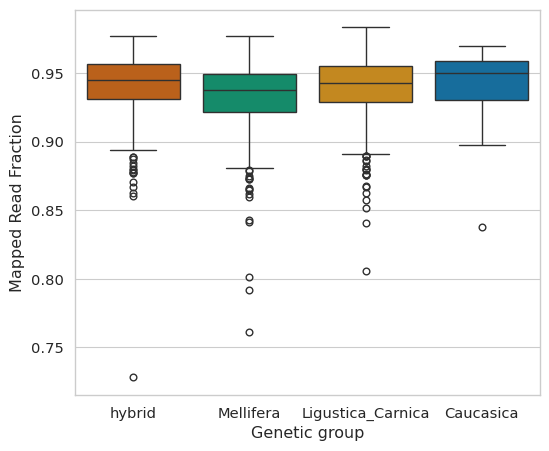

In [19]:
fig, ax = plt.subplots(figsize=(6,5))
sns.boxplot(data=map_df, x='Genetic group', y='Mapped Read Fraction', hue='Genetic group', palette=cmap_gengroup, legend=False, ax=ax)
plt.show()

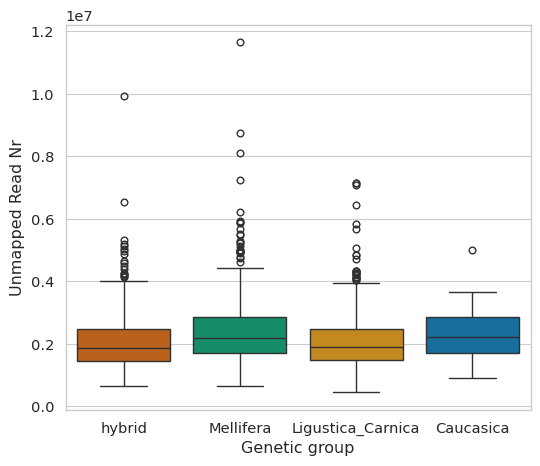

In [20]:
fig, ax = plt.subplots(figsize=(6,5))
sns.boxplot(data=map_df, x='Genetic group', y='Unmapped Read Nr', hue='Genetic group', palette=cmap_gengroup, legend=False, ax=ax)
plt.show()

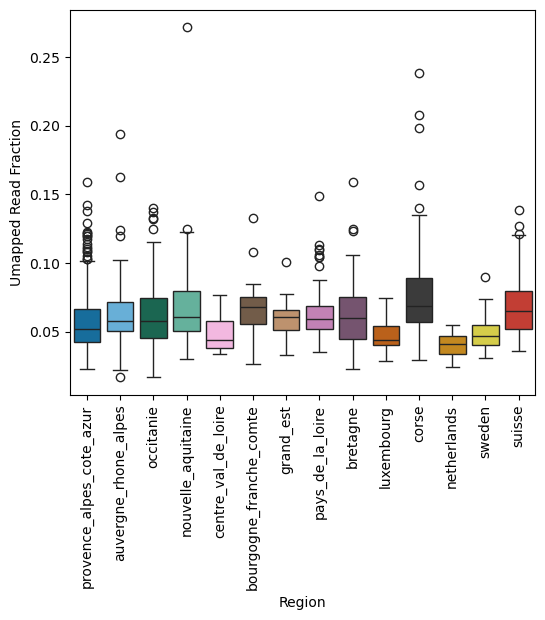

In [28]:
fig, ax = plt.subplots(figsize=(6,5))
sns.boxplot(data=map_df, x='Region', y='Umapped Read Fraction', hue='Region', palette=cmap_region, legend=False, ax=ax)
plt.xticks(rotation=90)
plt.show()

# Taxonomic classification with Kraken2 and Bracken

In [23]:
def write_kraken2_script(kraken2_script_fn, array_str, read_pool, min_hit_grps, confidence):
    conf_str = str(confidence).replace('.', '')
    kraken2_runstr="""#!/bin/bash -l
#SBATCH --array=ARRAY_STR
#SBATCH --nodes=1
#SBATCH --ntasks=1
#SBATCH --mem=350g
#SBATCH --time=01:00:00
#SBATCH --job-name=kraken2
#SBATCH --output=%x_%A_%a.out
#SBATCH --error=%x_%A_%a.err

modulesld
ebld
module use /software/anaconda3/envs/eb/easybuild/modules/all
conda activate planb
which kraken2
which bracken

kdb_path=$1
kdb_name=$2
bowtie2_path=$3
kraken2_path=$4
bracken_path=$5
bs_ids_file=$6

# getting bs_id
bs_id=$(sed -n ${SLURM_ARRAY_TASK_ID}'{p;q}' ${bs_ids_file})

fastq_1=${bowtie2_path}${bs_id}_bee3ref_new_unmapped.1.fastq.gz
fastq_2=${bowtie2_path}${bs_id}_bee3ref_new_unmapped.2.fastq.gz
ls -lh $fastq_1
ls -lh $fastq_2

file_id=${bs_id}_${kdb_name}_READPOOL_mhgMINHITGROUP_csCONFIDENCESTRING_sf1_rep1
echo $file_id


if [ ! -f ${kraken2_path}${file_id}.kraken2 ]; then
    echo '1. kraken2'
    kraken2 --threads 8 --db ${kdb_path}${kdb_name} --paired --report-minimizer-data --minimum-hit-groups MINHITGROUP --confidence CONFIDENCESCORE --gzip-compressed \
    --output ${kraken2_path}${file_id}.kraken2 --report ${kraken2_path}${file_id}.k2report ${fastq_1} ${fastq_2} --unclassified-out ${kraken2_path}${file_id}_uc#.fastq # this force kraken2 to put reads filtered by mhg in kraken2 output
    rm -f ${kraken2_path}${file_id}_uc_1.fastq ${kraken2_path}${file_id}_uc_2.fastq
fi

echo '2. bracken'
bracken -d ${kdb_path}${kdb_name} -i ${kraken2_path}${file_id}.k2report -r 150 -l F -t 10 -o ${bracken_path}${file_id}_F.bracken -w ${bracken_path}${file_id}_F.breport
bracken -d ${kdb_path}${kdb_name} -i ${kraken2_path}${file_id}.k2report -r 150 -l G -t 10 -o ${bracken_path}${file_id}_G.bracken -w ${bracken_path}${file_id}_G.breport
bracken -d ${kdb_path}${kdb_name} -i ${kraken2_path}${file_id}.k2report -r 150 -l S -t 10 -o ${bracken_path}${file_id}_S.bracken -w ${bracken_path}${file_id}_S.breport

echo DONE""".replace('ARRAY_STR', array_str).replace('READPOOL', read_pool).replace('MINHITGROUP', min_hit_grps).replace('CONFIDENCESTRING', conf_str).replace('CONFIDENCESCORE', confidence)
    with open(kraken2_script_fn, 'w') as outf:
        outf.write(kraken2_runstr)

In [24]:
bs_ids_file = all_bs_ids_file
k2_path = all_kraken2_path
br_path = all_bracken_path

kdb_name = 'corent'
read_pool = 'nonbee'
mhg = '2'
cs = '0.05'

array_id2bs_id, bs_id2array_id = read_bs_ids_file(bs_ids_file)
len(array_id2bs_id)

1442

In [25]:
step_name = 'kraken2'
job_id = "*"
k2_exp_files = [
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1.kraken2'.format(k2_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1.k2report'.format(k2_path, kdb_name, read_pool, mhg, str(cs).replace('.', ''))]
brack_exp_files = [
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1_S.bracken'.format(br_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1_S.breport'.format(br_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1_F.bracken'.format(br_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1_F.breport'.format(br_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1_G.bracken'.format(br_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
    '{}BSID_{}_{}_mhg{}_cs{}_sf1_rep1_G.breport'.format(br_path, kdb_name, read_pool, mhg, str(cs).replace('.', '')), 
]

k2_jobs_to_run, k2_completed_jobs = get_jobs_to_restart(step_name, array_id2bs_id, array_id2bs_id, k2_path, k2_exp_files + brack_exp_files, job_id)
k2_jobs_to_run, k2_completed_jobs

([],
 [1,
  2,
  3,
  4,
  5,
  6,
  7,
  8,
  9,
  10,
  11,
  12,
  13,
  14,
  15,
  16,
  17,
  18,
  19,
  20,
  21,
  22,
  23,
  24,
  25,
  26,
  27,
  28,
  29,
  30,
  31,
  32,
  33,
  34,
  35,
  36,
  37,
  38,
  39,
  40,
  41,
  42,
  43,
  44,
  45,
  46,
  47,
  48,
  49,
  50,
  51,
  52,
  53,
  54,
  55,
  56,
  57,
  58,
  59,
  60,
  61,
  62,
  63,
  64,
  65,
  66,
  67,
  68,
  69,
  70,
  71,
  72,
  73,
  74,
  75,
  76,
  77,
  78,
  79,
  80,
  81,
  82,
  83,
  84,
  85,
  86,
  87,
  88,
  89,
  90,
  91,
  92,
  93,
  94,
  95,
  96,
  97,
  98,
  99,
  100,
  101,
  102,
  103,
  104,
  105,
  106,
  107,
  108,
  109,
  110,
  111,
  112,
  113,
  114,
  115,
  116,
  117,
  118,
  119,
  120,
  121,
  122,
  123,
  124,
  125,
  126,
  127,
  128,
  129,
  130,
  131,
  132,
  133,
  134,
  135,
  136,
  137,
  138,
  139,
  140,
  141,
  142,
  143,
  144,
  145,
  146,
  147,
  148,
  149,
  150,
  151,
  152,
  153,
  154,
  155,
  156,
  157,
  15

In [12]:
# most efficient is actually to run things in home 
array_str = write_array_str(k2_jobs_to_run, min(len(k2_jobs_to_run), 8))
kraken2_script = '{}kraken2.run'.format(script_path)
write_kraken2_script(kraken2_script, array_str, read_pool, mhg, cs)
array_str

'102-1442%8'

In [13]:
command = ['sbatch', kraken2_script, kdb_path, kdb_name, bowtie2_path, k2_path, br_path, bs_ids_file]
result = subprocess.run(command, cwd=k2_path, capture_output=False)

Submitted batch job 1420342


In [15]:
# check consistency in read numbers between my different files
krakdb, readpool, mhg, cs = ('corent', 'nonbee', '2', '005')
for i in tqdm(k2_completed_jobs):
    bs_id = array_id2bs_id[i]
    flagstat_res = parse_flagstat('{}{}_{}_mapped.flagstat'.format(bowtie2_path, bs_id, idx_name))
    fastq_1_read_nr = count_lines_gz('{}{}_{}_unmapped.1.fastq.gz'.format(bowtie2_path, bs_id, idx_name)) / 4
    fastq_2_read_nr = count_lines_gz('{}{}_{}_unmapped.2.fastq.gz'.format(bowtie2_path, bs_id, idx_name)) / 4
    assert fastq_1_read_nr == fastq_2_read_nr
    assert fastq_1_read_nr == get_unmapped_read_nr_flagstat(bowtie2_path, bs_id, idx_name)
    assert fastq_1_read_nr == get_kraken2_read_nr(k2_path, bs_id, krakdb, readpool, mhg, cs, 1, 1)

100%|██████████| 101/101 [10:00<00:00,  5.94s/it]


## Database and Confidence Score evaluation

1. How do proportions of classified reads and relative abundance of key taxa correlate between reference database and Kraken2 confidence score thresholds?

In [151]:
array_id2bs_id, bs_id2array_id = read_bs_ids_file(sampled_bs_ids_file)
bs_ids = list(bs_id2array_id)

In [158]:
readpool, mhg, sf, r, level = ('nonbee', 2, 1, 1, 'G')
databases = ['corent'] #, 'class_krakdb']
cs_thresholds = ['005', '025', '050']

# settings = list(product(databases[:1], cs_thresholds)) + [(databases[1], cs_thresholds[0])]

In [159]:
cat_df = get_cat_df(sampled_bs_ids, databases, cs_thresholds, bowtie2_path, idx_name, kraken2_path,
               bracken_path, krakdb, readpool, mhg, cs, sf, r, level, taxa,
               taxon2name, name2tid, 
              )

### Databases

Text(0, 0.5, 'Non-Bee Unclassified')

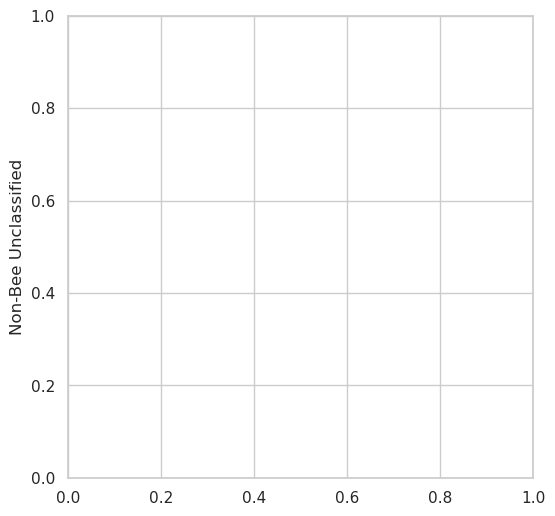

In [155]:
plt.figure(figsize=(6, 6))
sns.boxplot(data=cat_df[(cat_df['Category'] == 'Non-Bee Unclassified') & (cat_df['CS'].isin({'005'}))], x='CS', hue='DB', y='Relative Abundance', legend=True, log_scale=False)
plt.ylabel('Non-Bee Unclassified')

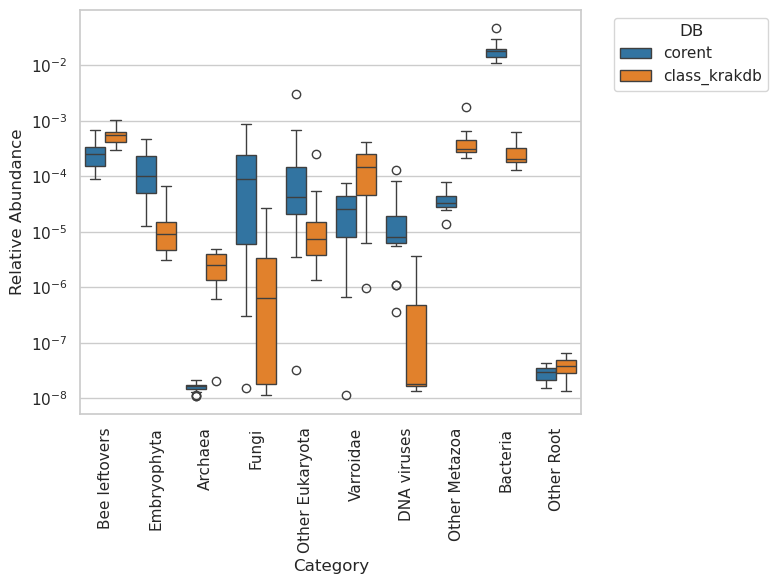

In [29]:
plt.figure(figsize=(8, 6))
ax = sns.boxplot(data=cat_df[(cat_df['Category'].isin(taxa_names)) & (cat_df['CS'].isin({'005'}))], x='Category', hue='DB', y='Relative Abundance', legend=True, log_scale=True)
plt.xticks(rotation=90)

# Manually add the legend to the right side
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles, labels=labels, title='DB', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

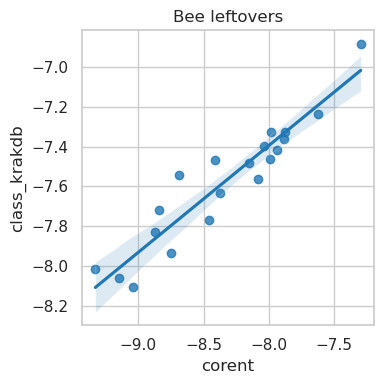

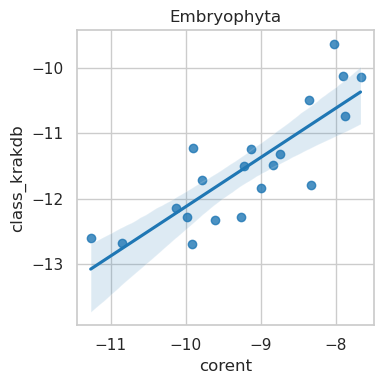

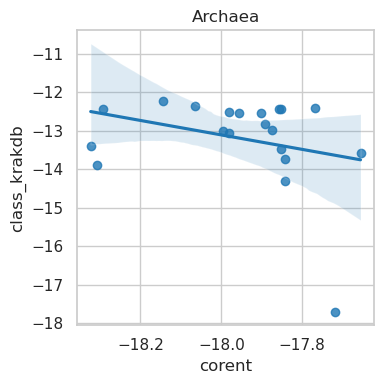

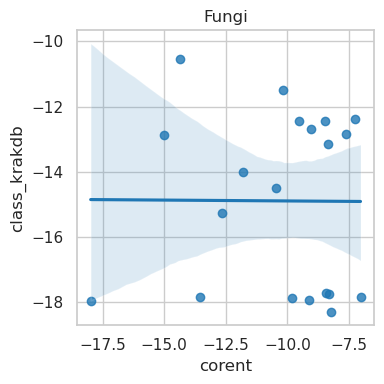

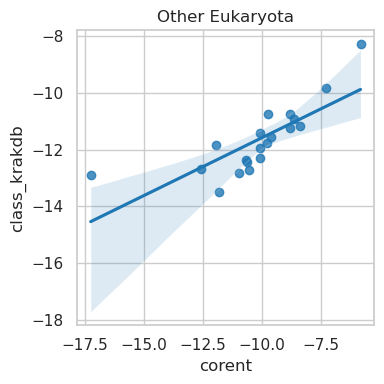

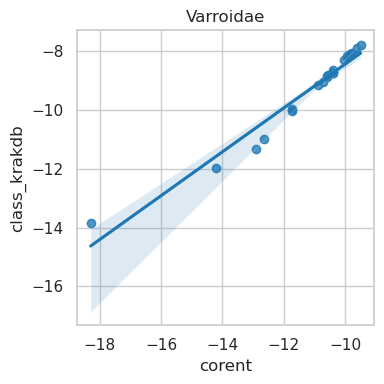

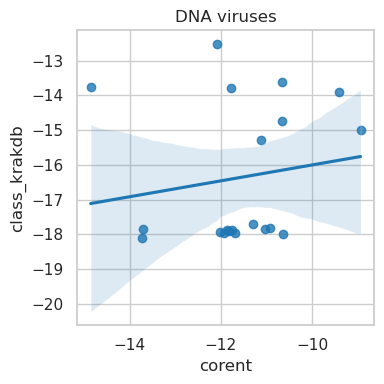

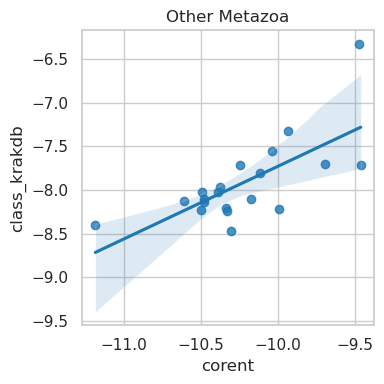

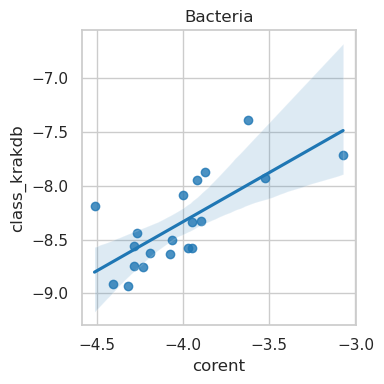

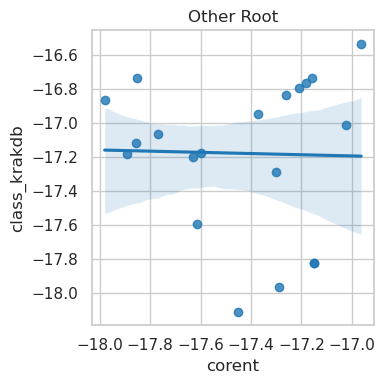

In [31]:
for taxon in taxa_names:
    pivot_df = cat_df[(cat_df['Category'] == taxon)  & (cat_df['CS'].isin({'005'}))].pivot_table(values='Log Relative Abundance', index = 'Colony', columns='DB')
    plt.figure(figsize=(4, 4))
    ax = sns.regplot(pivot_df, x = 'corent', y = 'class_krakdb')
    ax.set_title(taxon)
    plt.tight_layout()
    plt.show()

### Confidence scores

Text(0, 0.5, 'Kraken2 Classified')

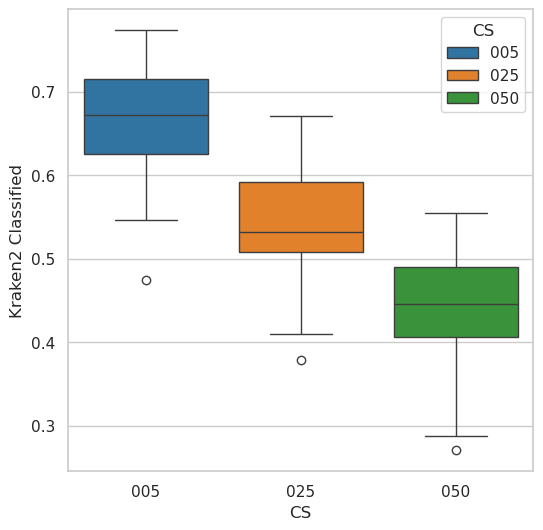

In [160]:
plt.figure(figsize=(6, 6))
sns.boxplot(data=cat_df[(cat_df['Category'] == 'Classified') & (cat_df['DB'].isin({'corent'}))], x='CS', hue='CS', y='Relative Abundance', legend=True, log_scale=False)
plt.ylabel('Kraken2 Classified')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Fungi'),
  Text(1, 0, 'Bacteria'),
  Text(2, 0, 'Bee leftovers'),
  Text(3, 0, 'Varroidae'),
  Text(4, 0, 'Other Eukaryota'),
  Text(5, 0, 'Archaea'),
  Text(6, 0, 'Other Root'),
  Text(7, 0, 'Other Metazoa'),
  Text(8, 0, 'DNA viruses'),
  Text(9, 0, 'Embryophyta')])

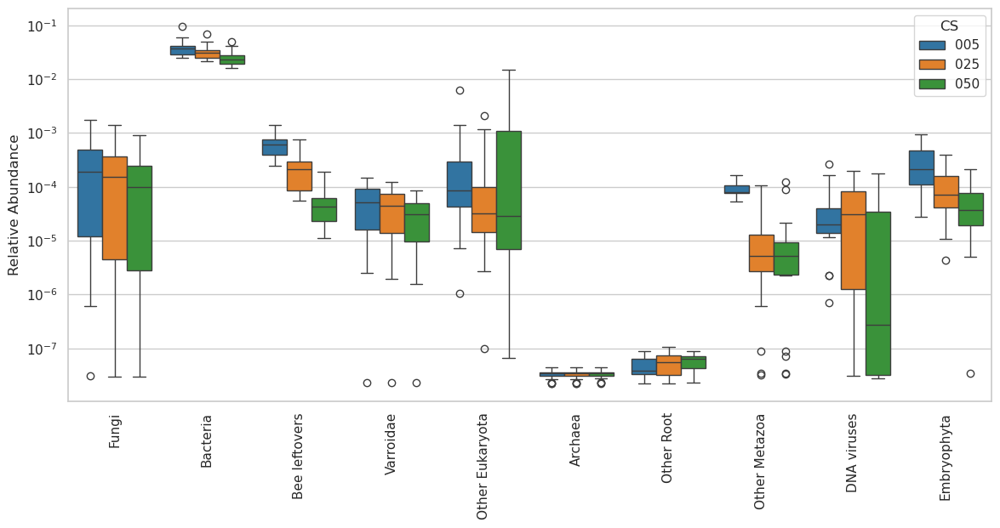

In [22]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=cat_df[cat_df['Category'].isin(taxa_names)], x='Category', hue='CS', y='Relative Abundance', legend=True, log_scale=True)
plt.xlabel(None)
plt.xticks(rotation=90)

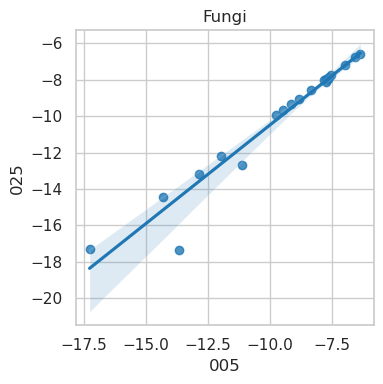

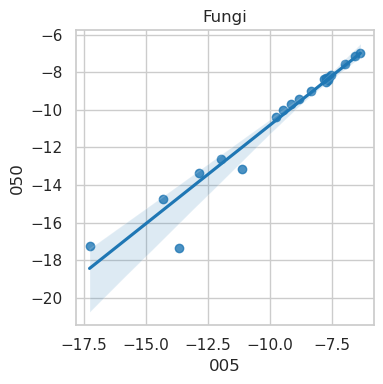

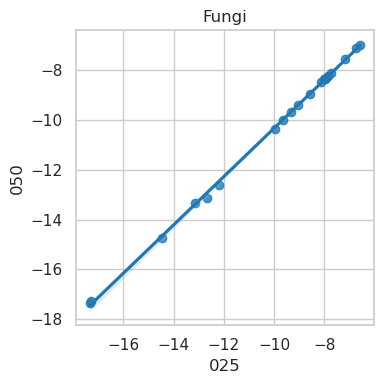

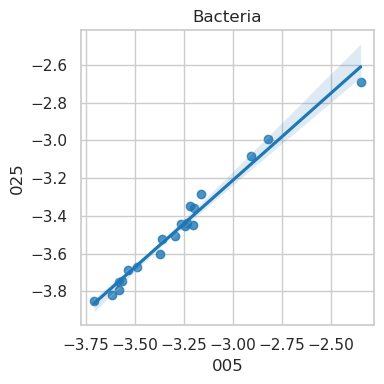

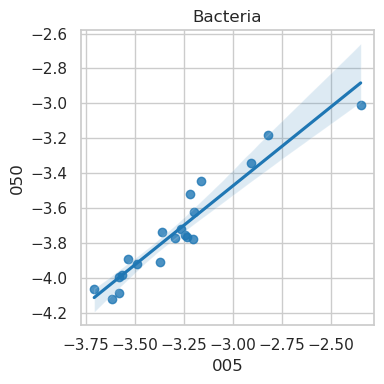

...

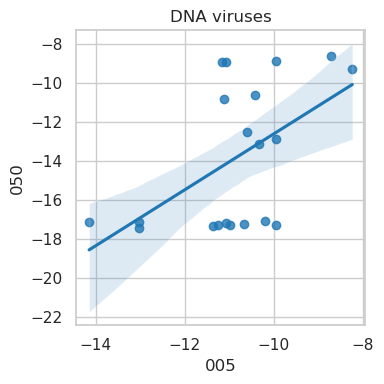

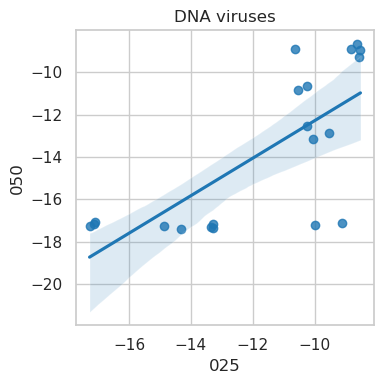

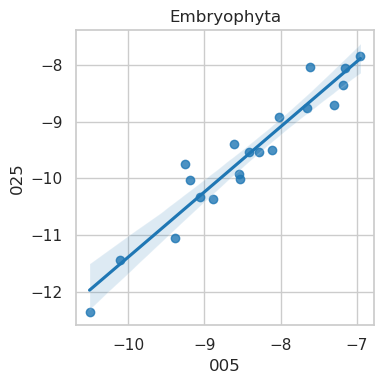

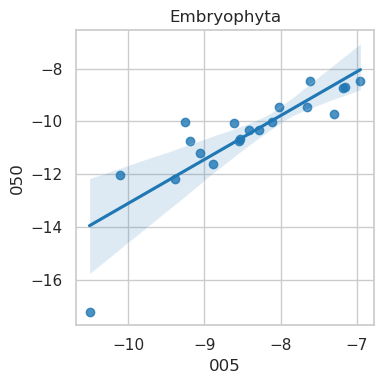

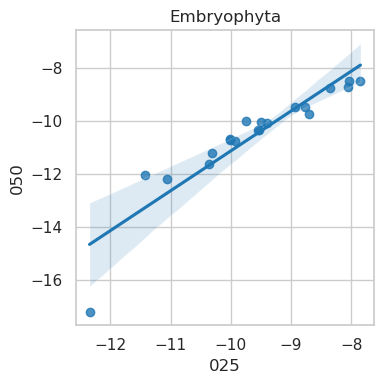

In [23]:
for taxon in taxa_names:
    for cs1, cs2 in list(combinations(cs_thresholds, 2)):
        pivot_df = cat_df[cat_df['Category'] == taxon].pivot_table(values='Log Relative Abundance', index = 'Colony', columns='CS')
        plt.figure(figsize=(4, 4))
        ax = sns.regplot(pivot_df, x = cs1, y = cs2)
        ax.set_title(taxon)
        plt.tight_layout()
        plt.show()

##  Rarefaction and BEExact analyses

What is the optimal choice of confidence score and Limit of Detection (on relative abundance) according to rarefaction and BEExact analyses? 

1. What are the values that maximize the number of identified taxa while removing the library size bias?
2. What are the values that maximize the proportion of BEExact taxa?

steps:
1. subsample the .kraken2 outputs (randomly take 10%, 20%, ... of reads in the .kraken2 file)
2. rebuild .k2report and run bracken

### subsample Kraken2 and run Bracken

In [164]:
def write_rarefication_script(rarefication_script_fn, array_str):
    rarefication_runstr="""#!/bin/bash -l
#SBATCH --array=ARRAY_STR
#SBATCH --nodes=1
#SBATCH --ntasks=1
#SBATCH --mem=20g
#SBATCH --time=02:00:00
#SBATCH --job-name=rarefication
#SBATCH --output=%x_%A_%a.out
#SBATCH --error=%x_%A_%a.err

modulesld
ebld
module use /software/anaconda3/envs/eb/easybuild/modules/all
conda activate planb

kraken2_path=$1
bs_ids_file=$2
krakdb=$3
readpool=$4
mhg=$5
kdb_path=$6
max_read_nr=$7
make_kreport_script=$8
bracken_path=$9

# getting bs_id
bs_id=$(sed -n ${SLURM_ARRAY_TASK_ID}'{p;q}' ${bs_ids_file})

python ~/scripts/plan-b-omics/bin/rarefy_kraken2.py --kraken2_path ${kraken2_path} --bs_id ${bs_id} --krakdb ${krakdb} --readpool ${readpool} --mhg ${mhg} --kdb_path ${kdb_path} --max_read_nr ${max_read_nr} --make_kreport_script ${make_kreport_script} --bracken_path ${bracken_path}""".replace('ARRAY_STR', array_str)
    with open(rarefication_script_fn, 'w') as outf:
        outf.write(rarefication_runstr)

def get_max_read_nr(bs_ids, bowtie2_path, idx_name):
    return int(max([get_unmapped_read_nr_flagstat(bowtie2_path, bs_id, idx_name) for bs_id in bs_ids]))

def get_min_read_nr(bs_ids, bowtie2_path, idx_name):
    return int(min([get_unmapped_read_nr_flagstat(bowtie2_path, bs_id, idx_name) for bs_id in bs_ids]))

In [165]:
array_id2bs_id, bs_id2array_id = read_bs_ids_file(sampled_bs_ids_file)
bs_ids = list(bs_id2array_id)
bs_ids

['BS16_0117',
 'BS17_0009',
 'BS16_0071',
 'BS17_1465',
 'BS17_0051',
 'BS17_0202',
 'BS17_0005',
 'BS17_0147',
 'BS17_0737',
 'BS18_0056',
 'BS18_0073',
 'BS17_0174',
 'BS16_0413',
 'BS18_0140',
 'BS17_0446',
 'BS16_0306',
 'BS17_0485',
 'BS17_0187',
 'BS17_0095',
 'BS16_0392']

In [61]:
rare_jobs_to_run = list(array_id2bs_id)
rare_jobs_to_run

[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]

In [166]:
array_id2bs_id

{1: 'BS16_0117',
 2: 'BS17_0009',
 3: 'BS16_0071',
 4: 'BS17_1465',
 5: 'BS17_0051',
 6: 'BS17_0202',
 7: 'BS17_0005',
 8: 'BS17_0147',
 9: 'BS17_0737',
 10: 'BS18_0056',
 11: 'BS18_0073',
 12: 'BS17_0174',
 13: 'BS16_0413',
 14: 'BS18_0140',
 15: 'BS17_0446',
 16: 'BS16_0306',
 17: 'BS17_0485',
 18: 'BS17_0187',
 19: 'BS17_0095',
 20: 'BS16_0392'}

In [168]:
rare_jobs_to_run = [13, 14]

In [170]:
array_str = write_array_str(rare_jobs_to_run, min(64, len(rare_jobs_to_run)))
rarefication_script = '{}rarefication.run'.format(script_path)
array_str = '13,14'
write_rarefication_script(rarefication_script, array_str)
print(rarefication_script)
array_str

/cluster/raid/home/f80878961/scripts/tmp_scripts/rarefication.run


'13,14'

In [171]:
krakdb, readpool, mhg = ('corent', 'nonbee', 2)
min_read_nr = get_min_read_nr(bs_ids, bowtie2_path, idx_name)
print(min_read_nr)
make_kreport_script = '/cluster/raid/home/f80878961/scripts/KrakenTools/make_kreport.py'

1074999


In [172]:
rarefication_script, kraken2_path, sampled_bs_ids_file, krakdb, readpool, str(mhg), kdb_path, str(int(min_read_nr)), make_kreport_script, bracken_path

('/cluster/raid/home/f80878961/scripts/tmp_scripts/rarefication.run',
 '/cluster/raid/home/f80878961/beestrong/02_taxonomic_profiling/kraken2/',
 '/cluster/raid/home/f80878961/beestrong/00_metadata/sampled_bs_ids.txt',
 'corent',
 'nonbee',
 '2',
 '/cluster/raid/home/f80878961/data/krakdb/',
 '1074999',
 '/cluster/raid/home/f80878961/scripts/KrakenTools/make_kreport.py',
 '/cluster/raid/home/f80878961/beestrong/02_taxonomic_profiling/bracken/')

In [173]:
command = ['sbatch', rarefication_script, kraken2_path, sampled_bs_ids_file, krakdb, readpool, str(mhg), kdb_path, str(int(min_read_nr)), make_kreport_script, bracken_path]
result = subprocess.run(command, cwd=bracken_path, capture_output=False)

Submitted batch job 1417101


### Plot rarefication curves

In [192]:
array_id2bs_id, bs_id2array_id = read_bs_ids_file(sampled_bs_ids_file)
bs_ids = list(bs_id2array_id)
krakdb, readpool, mhg = ('corent', 'nonbee', 2)
subsampling_fractions = [round(x, 2) for x in np.arange(0.1, 1, 0.1)]
replicate_nr = 1
replicates = range(1, replicate_nr + 1)
cs_thresholds = ['005', '025', '050']
levels = ['S', 'G', 'F']
lods = [1e-06, 5e-06, 1e-05, 5e-05, 1e-04]
lods = [0, 1e-06, 2e-06, 3e-06, 4e-06, 5e-06] #, 6e-06]
lods = [0, 5e-06, 1e-05]

cmap = dict(zip(lods, sns.color_palette('colorblind', len(lods))))

In [193]:
columns= ['Colony', 'CS', 'Sampling Fraction', 'Replicate Nr', 'Level', 'LoD', 'Richness', 'Delta Richness']
rows = []

for bs_id in tqdm(bs_ids):
    print(bs_id)
    for cs, lvl, sf, r in product(cs_thresholds, levels, subsampling_fractions, replicates):
        
        brack_df = get_bracken_df(bowtie2_path, kraken2_path, bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, lvl, idx_name, {})
        if brack_df.empty:
            continue
        
        for lod in lods:
            richness = len(brack_df[brack_df['fraction_total_reads'] >= lod])
            if sf > subsampling_fractions[0]:
                delta_richness = richness - len(previous_brack_df[previous_brack_df['fraction_total_reads'] >= lod])
            else:
                delta_richness = np.nan 
                
            rows.append((
                bs_id, 
                cs,
                sf,
                r,
                lvl,
                lod, 
                richness,
                delta_richness
            ))

        previous_brack_df = brack_df

rare_df = pd.DataFrame(data=rows, columns=columns)
rare_df

  0%|          | 0/20 [00:00<?, ?it/s]

BS16_0117


  5%|▌         | 1/20 [00:00<00:10,  1.89it/s]

BS17_0009


 10%|█         | 2/20 [00:01<00:09,  1.89it/s]

BS16_0071


 15%|█▌        | 3/20 [00:01<00:08,  1.89it/s]

BS17_1465


 20%|██        | 4/20 [00:02<00:08,  1.91it/s]

BS17_0051


 25%|██▌       | 5/20 [00:02<00:07,  1.91it/s]

BS17_0202


 30%|███       | 6/20 [00:03<00:07,  1.91it/s]

BS17_0005


 35%|███▌      | 7/20 [00:03<00:06,  1.90it/s]

BS17_0147


 40%|████      | 8/20 [00:04<00:06,  1.90it/s]

BS17_0737


 45%|████▌     | 9/20 [00:04<00:05,  1.91it/s]

BS18_0056


 50%|█████     | 10/20 [00:05<00:05,  1.91it/s]

BS18_0073


 55%|█████▌    | 11/20 [00:05<00:04,  1.92it/s]

BS17_0174


 60%|██████    | 12/20 [00:06<00:04,  1.92it/s]

BS16_0413


 65%|██████▌   | 13/20 [00:06<00:03,  1.92it/s]

BS18_0140


 70%|███████   | 14/20 [00:07<00:03,  1.91it/s]

BS17_0446


 75%|███████▌  | 15/20 [00:07<00:02,  1.90it/s]

BS16_0306


 80%|████████  | 16/20 [00:08<00:02,  1.90it/s]

BS17_0485


 85%|████████▌ | 17/20 [00:08<00:01,  1.91it/s]

BS17_0187


 90%|█████████ | 18/20 [00:09<00:01,  1.91it/s]

BS17_0095


 95%|█████████▌| 19/20 [00:09<00:00,  1.91it/s]

BS16_0392


100%|██████████| 20/20 [00:10<00:00,  1.91it/s]


,Colony,CS,Sampling Fraction,Replicate Nr,Level,LoD,Richness,Delta Richness
0,BS16_0117,005,0.1,1,S,0.000000,72,NaN
1,BS16_0117,005,0.1,1,S,0.000005,72,NaN
2,BS16_0117,005,0.1,1,S,0.000010,66,NaN
3,BS16_0117,005,0.2,1,S,0.000000,96,24.0
4,BS16_0117,005,0.2,1,S,0.000005,85,13.0
...,...,...,...,...,...,...,...,...
4855,BS16_0392,050,0.8,1,F,0.000005,16,0.0
4856,BS16_0392,050,0.8,1,F,0.000010,16,0.0
4857,BS16_0392,050,0.9,1,F,0.000000,19,0.0
4858,BS16_0392,050,0.9,1,F,0.000005,16,0.0


In [178]:
[int(sf * min_read_nr) for sf in subsampling_fractions]

[107499, 214999, 322499, 429999, 537499, 644999, 752499, 859999, 967499]

In [179]:
np.unique(rare_df[(rare_df['CS'] == '005') & (rare_df['Level'] == 'S') & (rare_df['LoD'] == 0)]['Sampling Fraction'], return_counts=True)

(array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
 array([20, 20, 20, 20, 20, 20, 20, 20, 20]))

rarefication curves per colony

In [197]:
40000000 / 1000000

40.0

In [210]:
sns.set_style('whitegrid')
sns.set_context('notebook', font_scale=1)

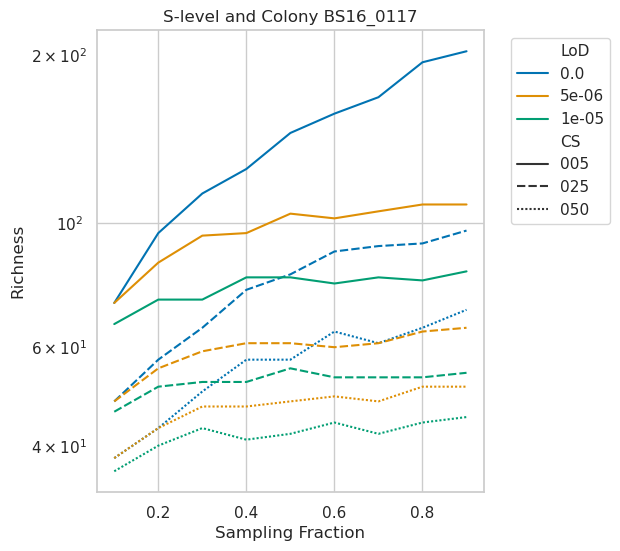

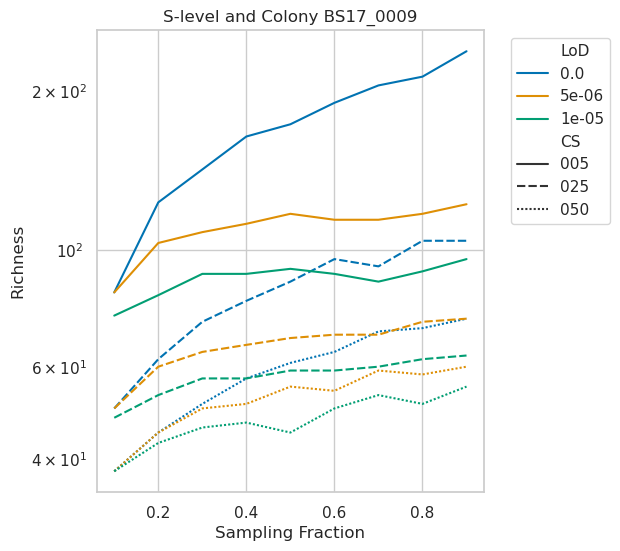

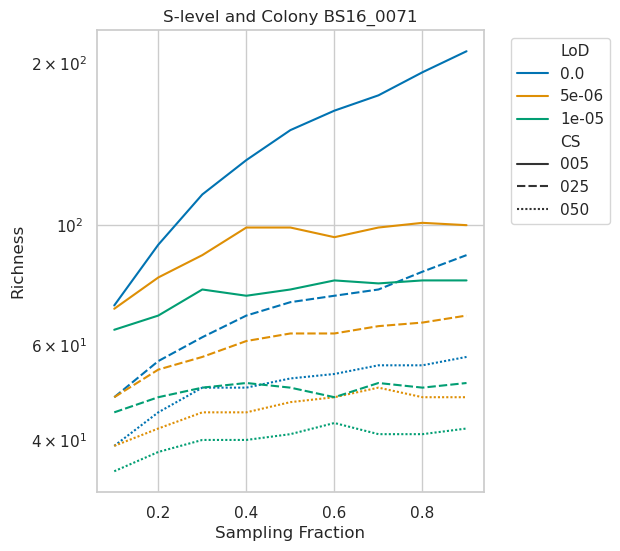

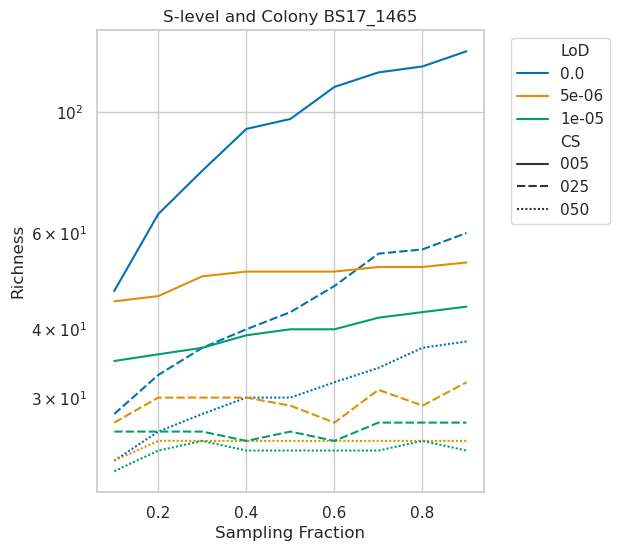

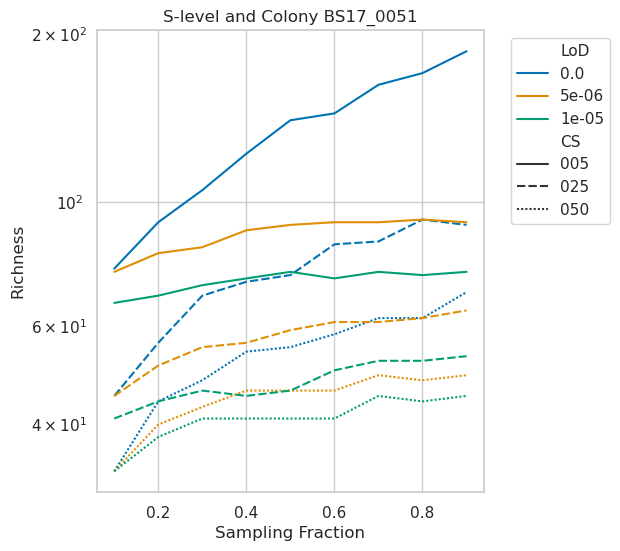

...

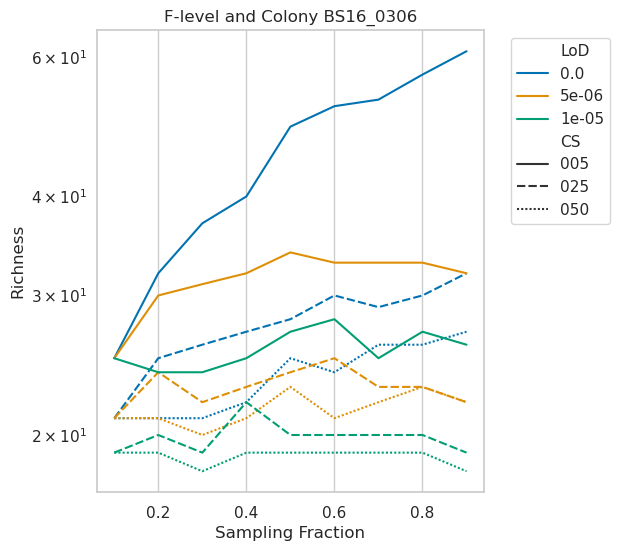

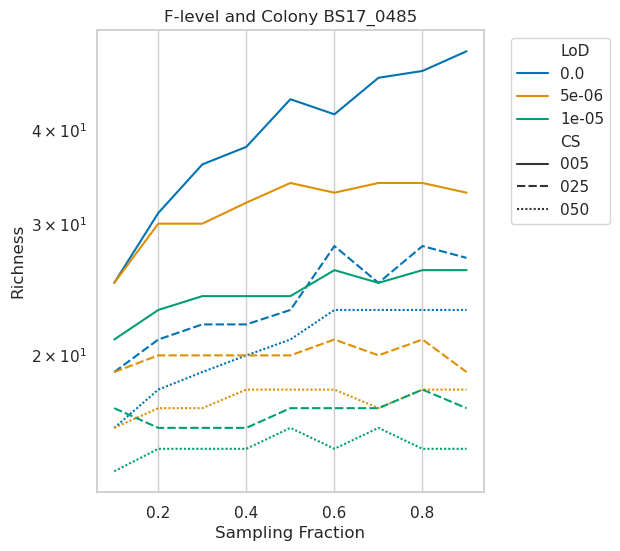

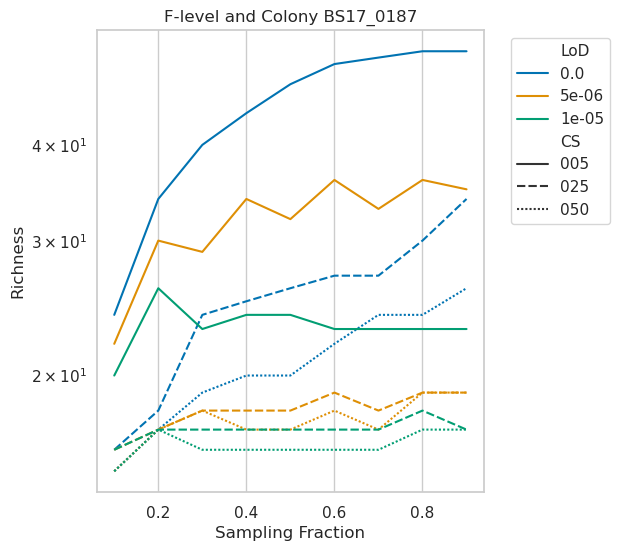

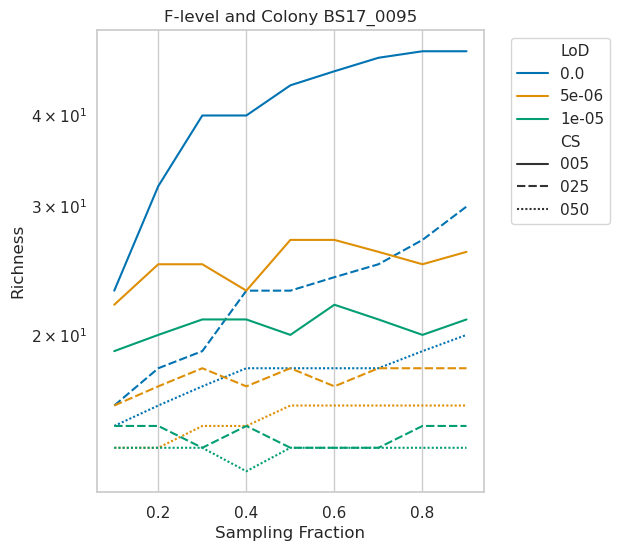

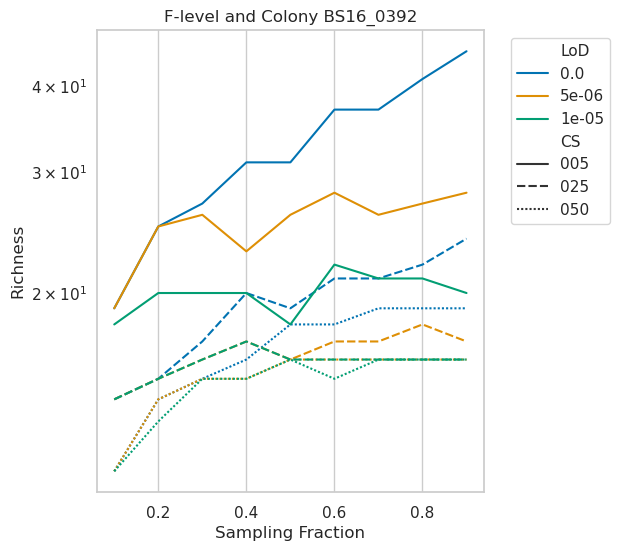

In [225]:
for lvl in levels:
    for bs_id in bs_ids:
        fig, ax = plt.subplots(figsize=(5,6))
        sns.lineplot(data=rare_df[(rare_df['Colony'] == bs_id) & (rare_df['Level'] == lvl)], 
                     x='Sampling Fraction', y='Richness', hue='LoD', style='CS', units='Colony', estimator=None, palette=cmap, ax=ax)
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.yscale('log')
        ax.set_title("{}-level and Colony {}".format(lvl, bs_id))
        plt.show()

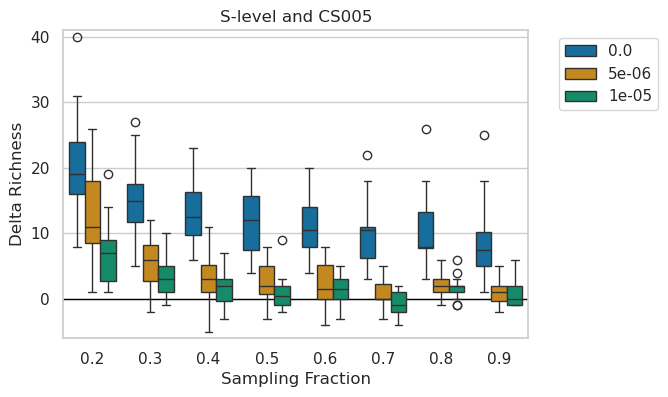

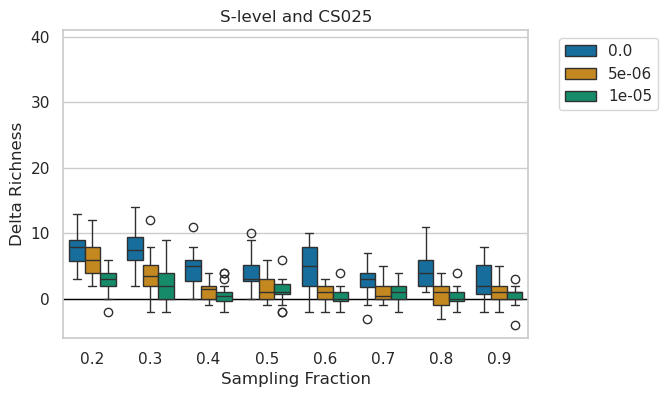

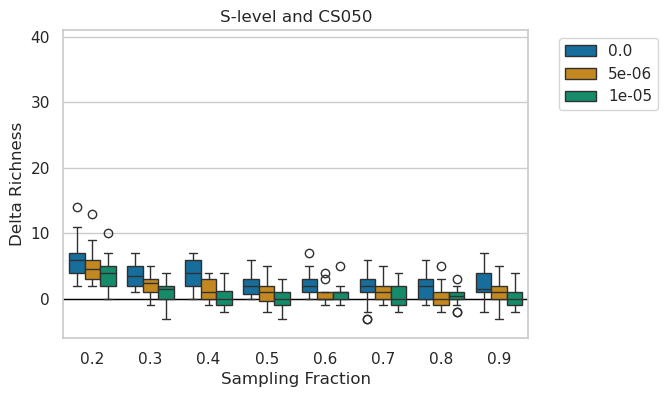

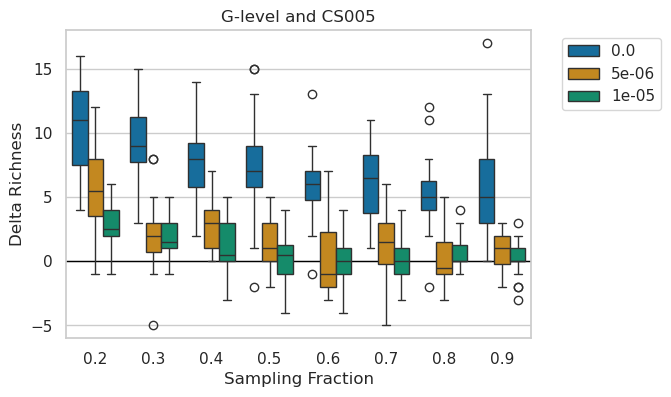

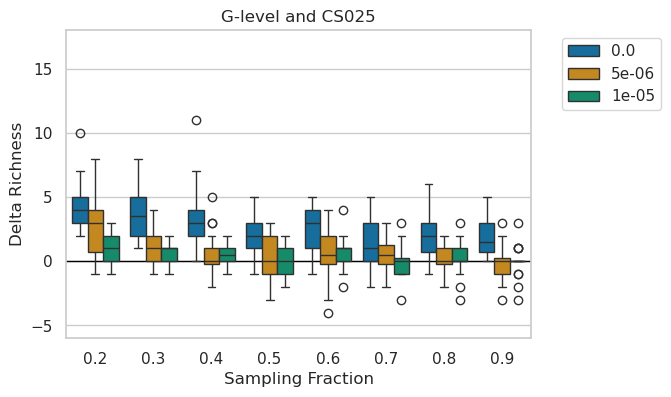

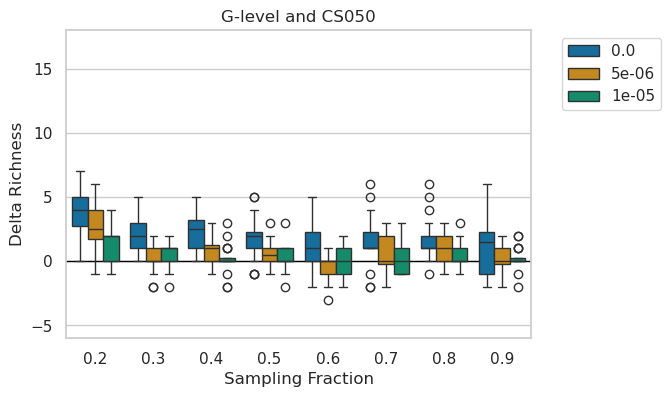

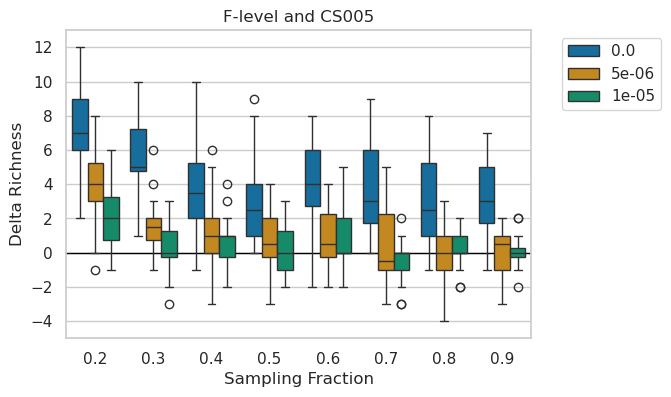

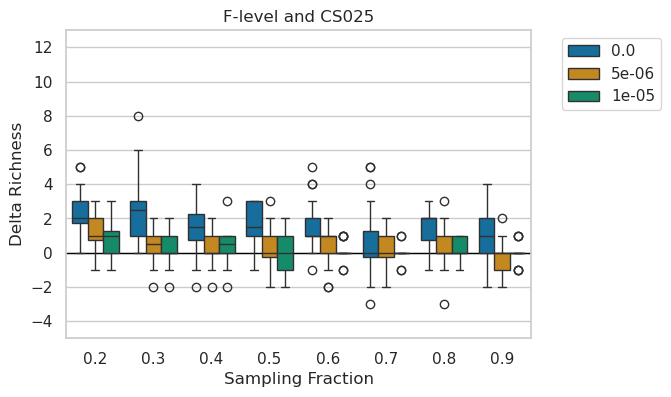

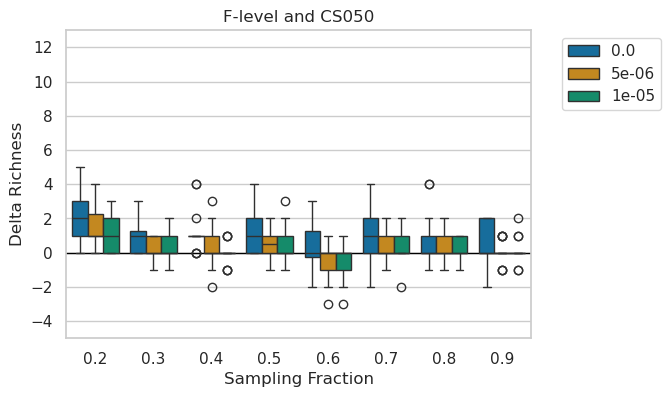

In [218]:
lvl2ylim = {'S': (-6, 41), 'G':(-6, 18), 'F':(-5, 13) }
for lvl in levels:
    for cs in cs_thresholds:
        fig, ax = plt.subplots(figsize=(6,4))
        ax.axhline(0, color='black', linestyle='-', linewidth=1)
        sns.boxplot(data=rare_df[(rare_df['Sampling Fraction'].isin(subsampling_fractions[1:])) & (rare_df['Level'] == lvl) & (rare_df['CS'] == cs)], 
                    x='Sampling Fraction', y='Delta Richness', hue='LoD', palette=cmap, ax=ax)
        ax.set_ylim(lvl2ylim[lvl])
        ax.set_title("{}-level and CS{}".format(lvl, cs))
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

        # plt.yscale('log')
        plt.show()

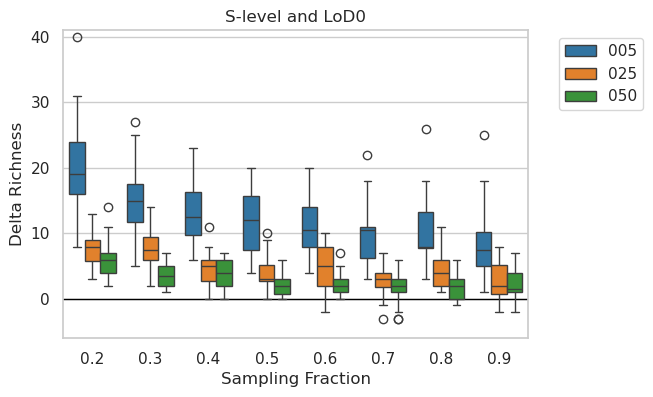

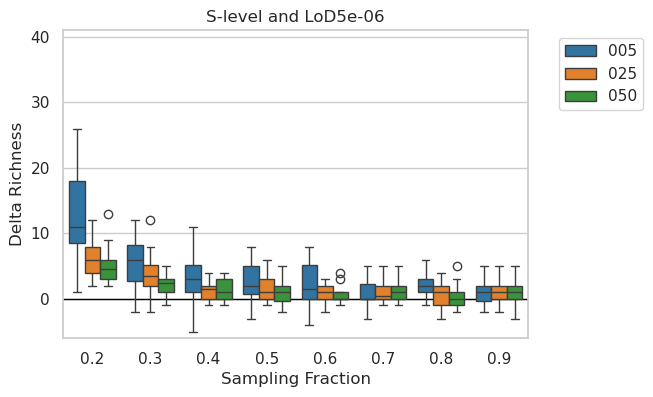

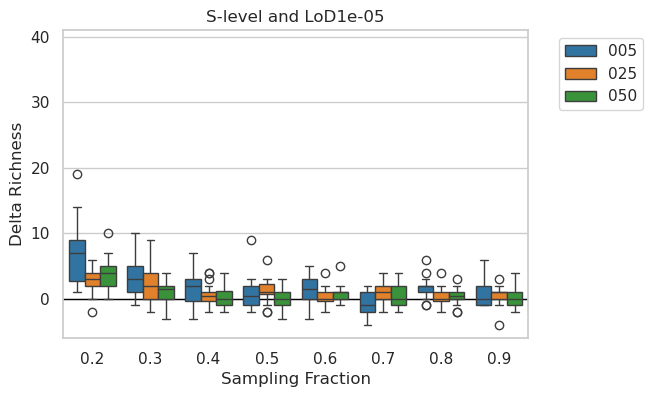

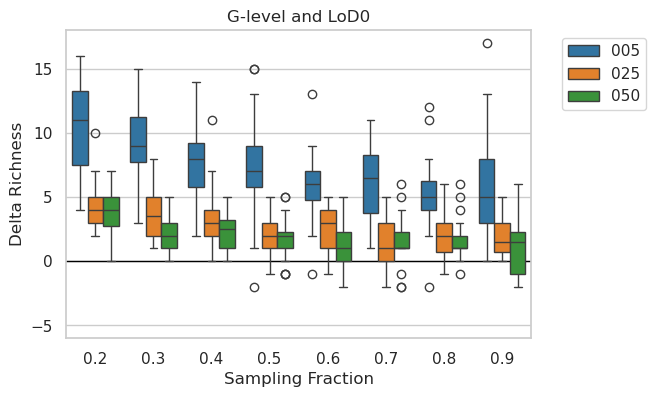

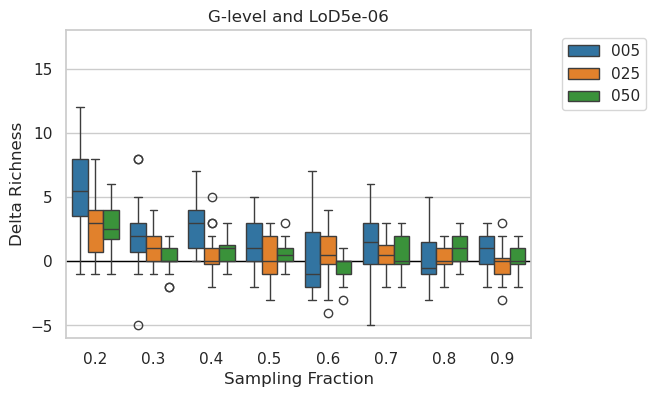

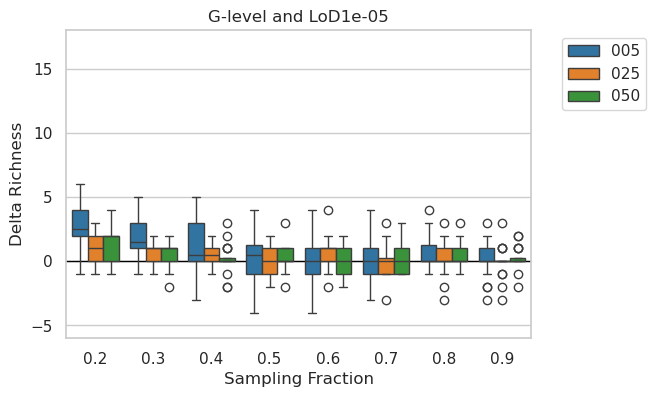

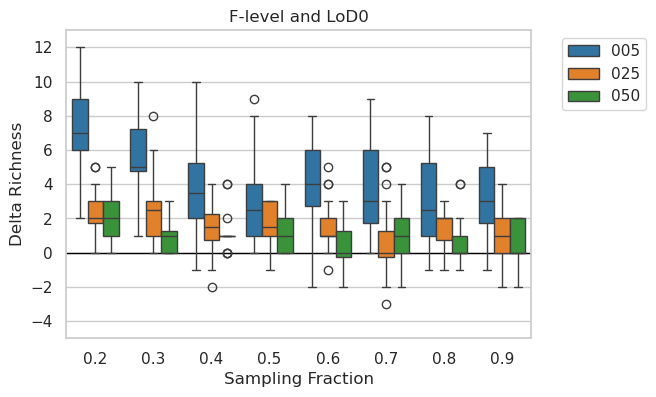

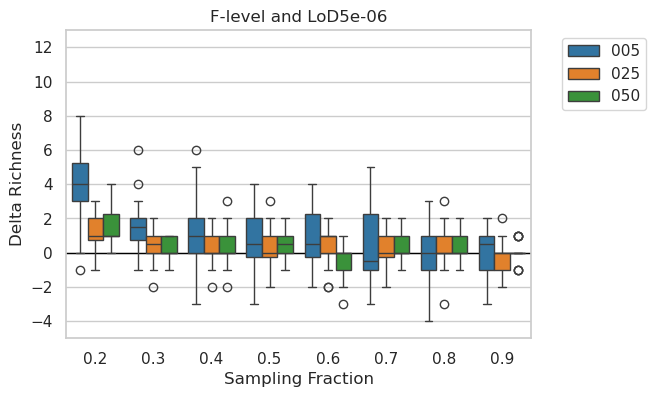

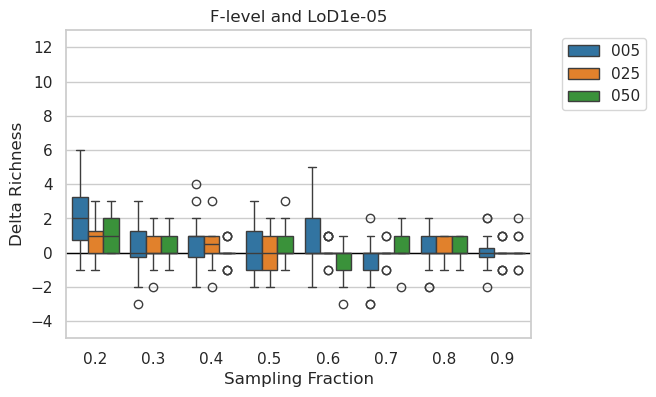

In [220]:
lvl2ylim = {'S': (-6, 41), 'G':(-6, 18), 'F':(-5, 13) }
for lvl in levels:
    for lod in lods:
        fig, ax = plt.subplots(figsize=(6,4))
        ax.axhline(0, color='black', linestyle='-', linewidth=1)
        sns.boxplot(data=rare_df[(rare_df['Sampling Fraction'].isin(subsampling_fractions[1:])) & (rare_df['Level'] == lvl) & (rare_df['LoD'] == lod)], 
                    x='Sampling Fraction', y='Delta Richness', hue='CS', ax=ax)
        ax.set_ylim(lvl2ylim[lvl])
        ax.set_title("{}-level and LoD{}".format(lvl, lod))
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

        # plt.yscale('log')
        plt.show()

S


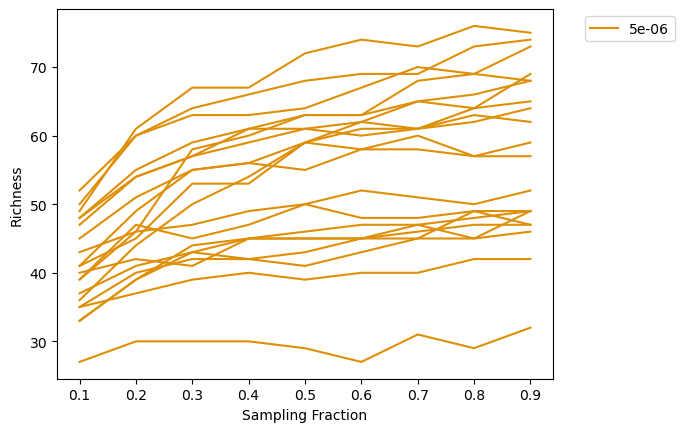

G


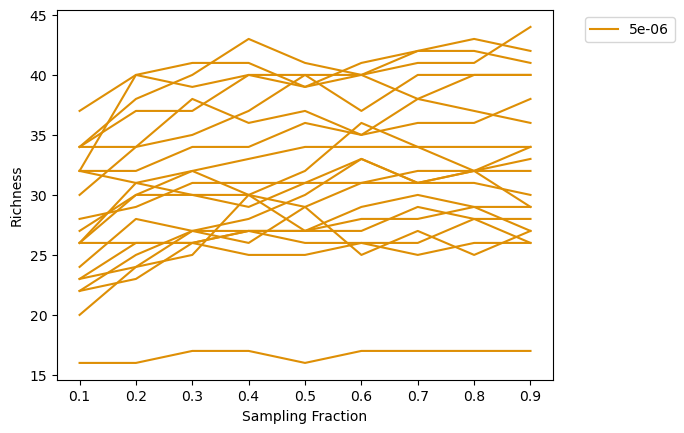

F


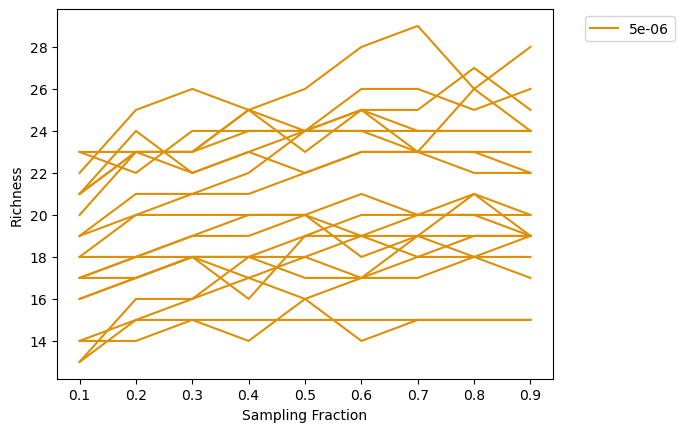

In [205]:
cs = '025'
lod = 5e-06
for lvl in levels:
    print(lvl)
    sns.lineplot(data=rare_df[(rare_df['Level'] == lvl) & (rare_df['CS'] == cs) & (rare_df['LoD'] == lod)], x='Sampling Fraction', y='Richness', hue='LoD', units='Colony', estimator=None, palette=cmap)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    # plt.yscale('log')
    
    plt.show()

### BEExact fractions

In [25]:
level2beexact_taxa = get_level2beexact_taxa()
level2beexact_name2tid = {}
for lvl in ['s', 'g', 'f']:
    level2beexact_name2tid[lvl.upper()] = {name:tids[0] for name, tids in ncbi.get_name_translator(level2beexact_taxa[lvl]).items() if len(tids) == 1} 

/cluster/raid/home/f80878961/.conda/envs/planb/lib/python3.9/site-packages/urllib3/connectionpool.py:1097: InsecureRequestWarning: Unverified HTTPS request is being made to host 'proxy.agsad.admin.ch'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


In [35]:
array_id2bs_id, bs_id2array_id = read_bs_ids_file(sampled_bs_ids_file)
bs_ids = list(bs_id2array_id)
krakdb, readpool, mhg, sf, r = ('corent', 'nonbee', 2, 1, 1)
cs_thresholds = ['005', '025', '050']
levels = ['S', 'G', 'F']
lods = [1e-6, 5e-06, 1e-05, 5e-05, 1e-04]
lods = [0, 1e-6, 2e-06, 3e-06, 4e-06, 5e-06] #, 6e-06]
lods = [0, 5e-06, 1e-05]

cmap = dict(zip(lods, sns.color_palette('colorblind', len(lods))))

In [41]:

columns= ['Colony', 'CS', 'Level', 'LoD', 'Richness', 'BEExact % in Sample (~Precision)', 'Sample % in BEExact (~Sensitivity)', 'F1']
rows = []

for bs_id, cs, lvl in product(bs_ids, cs_thresholds, levels):
        
    brack_df = get_bracken_df(bowtie2_path, kraken2_path, bracken_path, bs_id, krakdb, readpool, mhg, cs, sf, r, lvl, idx_name, {})
    if brack_df.empty:
        continue
    
    for lod in lods:
        lod_brack_df = brack_df[brack_df['fraction_total_reads'] >= lod]
        sample_taxon_nr = len(lod_brack_df)
        beexact_taxon_nr = len(level2beexact_name2tid[lvl])
        overlap_taxon_nr = len(set(lod_brack_df['taxonomy_id']).intersection(level2beexact_name2tid[lvl].values()))
        precision = overlap_taxon_nr / sample_taxon_nr
        sensitivity = overlap_taxon_nr / beexact_taxon_nr
        rows.append((bs_id, cs, lvl, lod, sample_taxon_nr, precision, sensitivity, stats.hmean([precision, sensitivity])))

beexact_df = pd.DataFrame(data=rows, columns=columns)

In [42]:
beexact_df

,Colony,CS,Level,LoD,Richness,BEExact % in Sample (~Precision),Sample % in BEExact (~Sensitivity),F1
0,BS16_0117,005,S,0.000000,332,0.487952,0.008507,0.016723
1,BS16_0117,005,S,0.000005,116,0.474138,0.002888,0.005741
2,BS16_0117,005,S,0.000010,84,0.488095,0.002153,0.004287
3,BS16_0117,005,G,0.000000,178,0.556180,0.026267,0.050165
4,BS16_0117,005,G,0.000005,73,0.520548,0.010082,0.019781
...,...,...,...,...,...,...,...,...
535,BS16_0392,050,G,0.000005,24,0.750000,0.004776,0.009491
536,BS16_0392,050,G,0.000010,20,0.750000,0.003980,0.007918
537,BS16_0392,050,F,0.000000,23,0.695652,0.026936,0.051864
538,BS16_0392,050,F,0.000005,16,0.687500,0.018519,0.036066


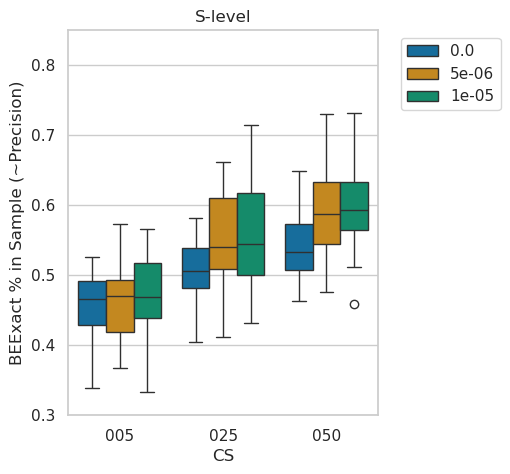

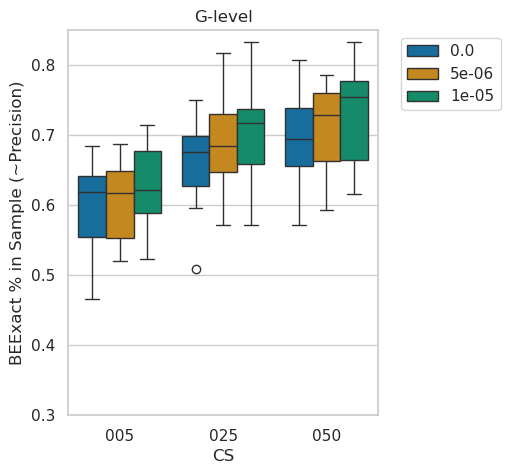

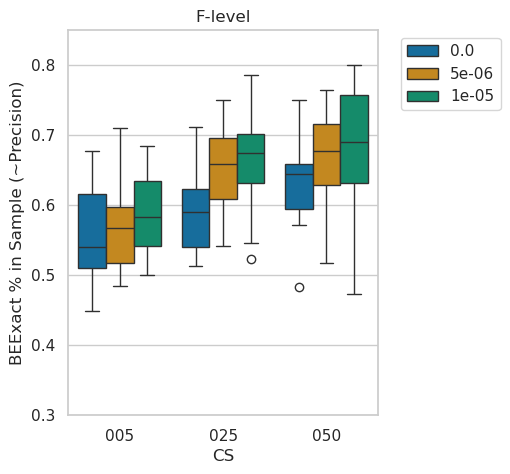

In [43]:
for lvl in levels:
    fig, ax = plt.subplots(figsize=(4,5))
    sns.boxplot(data=beexact_df[beexact_df['Level'] == lvl], x='CS', y='BEExact % in Sample (~Precision)', hue='LoD', palette=cmap, ax=ax)
    ax.set_ylim((0.30, 0.85))
    ax.set_title("{}-level".format(lvl))
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

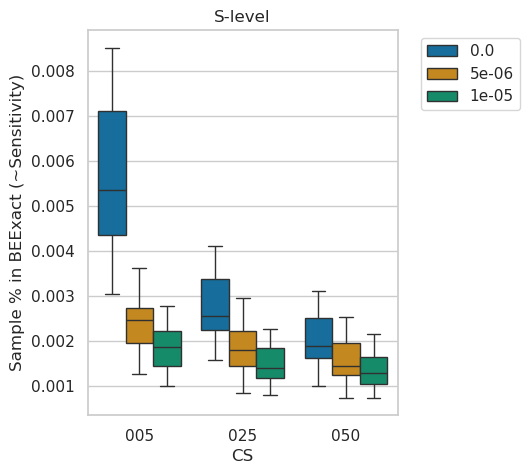

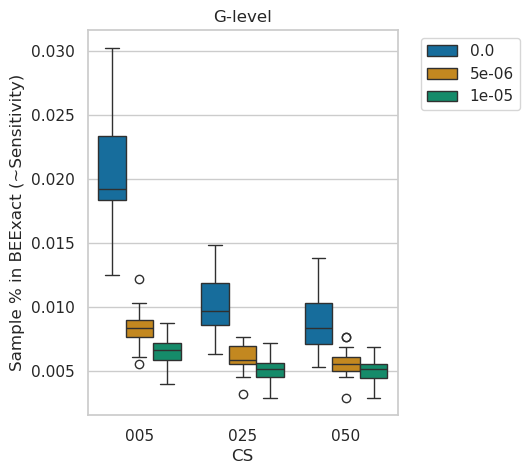

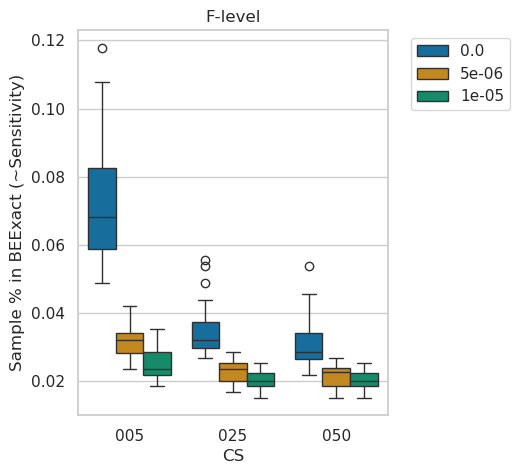

In [44]:
for lvl in levels:
    fig, ax = plt.subplots(figsize=(4,5))
    sns.boxplot(data=beexact_df[beexact_df['Level'] == lvl], x='CS', y='Sample % in BEExact (~Sensitivity)', hue='LoD', palette=cmap, ax=ax)
    # ax.set_ylim((0.30, 0.85))
    ax.set_title("{}-level".format(lvl))
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

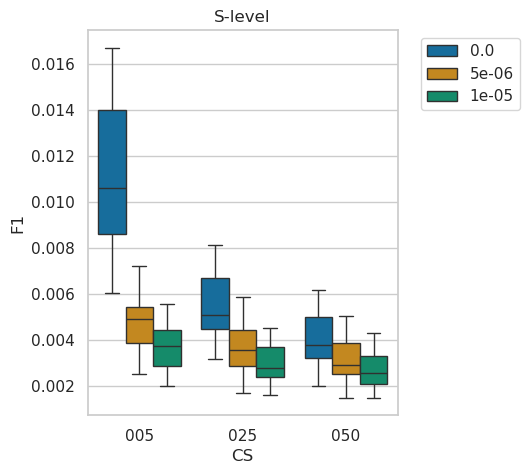

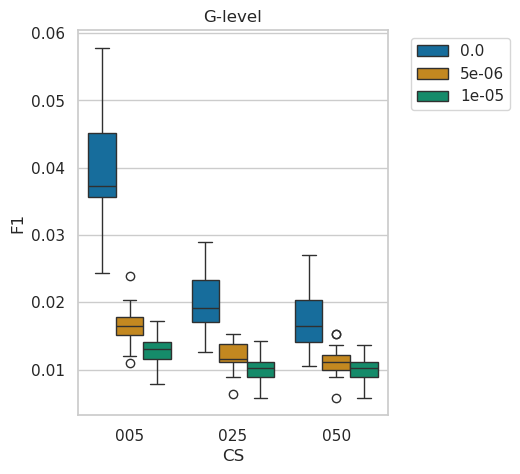

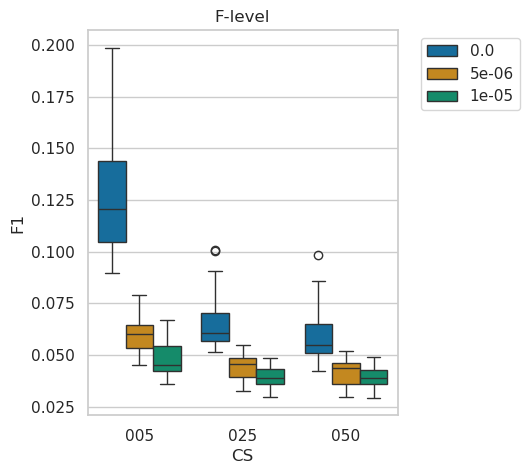

In [45]:
for lvl in levels:
    fig, ax = plt.subplots(figsize=(4,5))
    sns.boxplot(data=beexact_df[beexact_df['Level'] == lvl], x='CS', y='F1', hue='LoD', palette=cmap, ax=ax)
    # ax.set_ylim((0.30, 0.85))
    ax.set_title("{}-level".format(lvl))
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# Descriptive stats of Taxonomic classification

In [10]:
bs_ids = all_bs_ids
databases = ['corent']
krakdb = databases[0]
cs_thresholds = ['005']
cs = cs_thresholds[0]
k2_path = all_kraken2_path
br_path = all_bracken_path

readpool, mhg, sf, r, lvl = ('nonbee', 2, 1, 1, 'S') # should be species level because for viruses, e.g, some intermediate levels are missing
lod = 5e-06

print(taxa)

cat_df = get_cat_df(
    bs_ids, databases, cs_thresholds, bowtie2_path, idx_name, k2_path,
    br_path, krakdb, readpool, mhg, cs, sf, r, lvl, taxa, taxon2name, name2tid, 
)
cat_df

{'Varroidae', 'Embryophyta', 'Anthophila', 'Fungi', 'Eukaryota', 'root', 'Metazoa', 'Bacteria', 'Archaea', 'Viruses'}


,Colony,DB,CS,Category,Read Number,Relative Abundance,Log Relative Abundance
0,BS16_0001,corent,005,Classified,1104120,7.581112e-01,-0.276925
1,BS16_0001,corent,005,Varroidae,13347,3.614958e-04,-7.925260
2,BS16_0001,corent,005,Embryophyta,1000,2.708442e-05,-10.516552
3,BS16_0001,corent,005,Bee leftovers,28996,7.853399e-04,-7.149394
4,BS16_0001,corent,005,Fungi,1813,4.910406e-05,-9.921569
...,...,...,...,...,...,...,...
15857,BS18_0686,corent,005,Other Root,2,5.559539e-08,-16.705166
15858,BS18_0686,corent,005,Other Metazoa,2485,6.907727e-05,-9.580285
15859,BS18_0686,corent,005,Bacteria,987083,2.743863e-02,-3.595803
15860,BS18_0686,corent,005,Archaea,1,2.779769e-08,-17.398313


## Kraken2 Classification Rate

In [100]:
data = cat_df[(cat_df['Category'] == 'Classified')].merge(pheno_df[['Colony', 'Genetic group', 'Region', 'Year', 'Month']], on='Colony')

In [102]:
data.describe()

,Read Number,Relative Abundance,Log Relative Abundance,Year,Month
count,1.442000e+03,1442.000000,1442.000000,1442.000000,1442.000000
mean,1.508402e+06,0.691224,-0.377902,2017.003467,7.791956
std,7.328999e+05,0.079245,0.143246,0.812371,0.954767
min,3.456710e+05,0.094921,-2.354705,2016.000000,6.000000
25%,1.050408e+06,0.664010,-0.409458,2016.000000,7.000000
50%,1.358235e+06,0.705652,-0.348633,2017.000000,8.000000
75%,1.781668e+06,0.740298,-0.300703,2018.000000,8.000000
max,9.691349e+06,0.873979,-0.134699,2018.000000,10.000000


Text(0, 0.5, 'Kraken2 Classified')

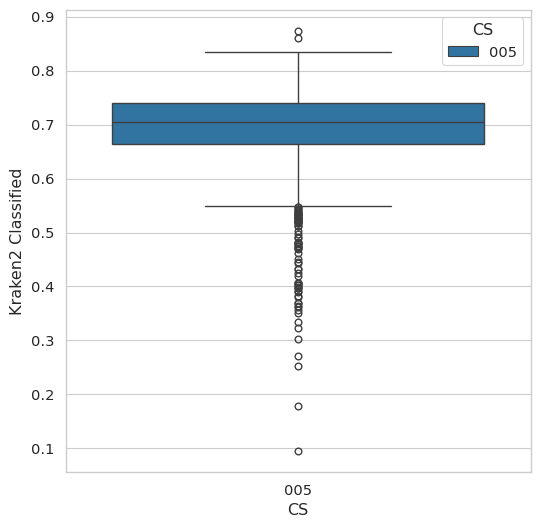

In [42]:
plt.figure(figsize=(6, 6))
sns.boxplot(data=cat_df[(cat_df['Category'] == 'Classified')], x='CS', hue='CS', y='Relative Abundance', legend=True, log_scale=False)
plt.ylabel('Kraken2 Classified')

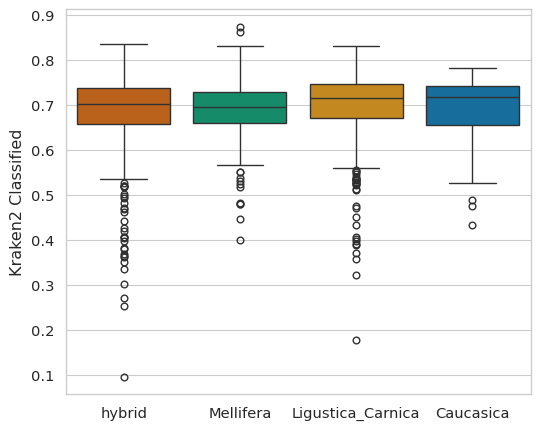

In [43]:
fig, ax = plt.subplots(figsize=(6,5))
sns.boxplot(data=data, x='Genetic group', hue='Genetic group', y='Relative Abundance', palette=cmap_gengroup, legend=False, log_scale=False, ax=ax)
plt.ylabel('Kraken2 Classified')
plt.xlabel(None)
plt.show()

Text(0, 0.5, 'Kraken2 Classified')

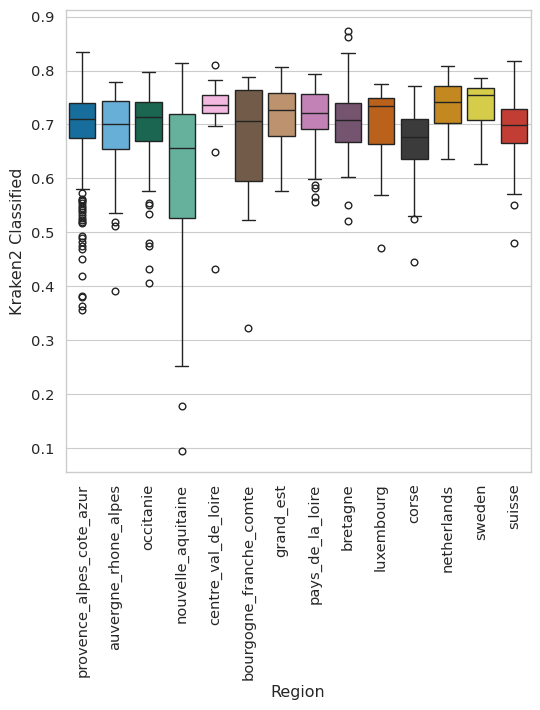

In [44]:
plt.figure(figsize=(6, 6))
sns.boxplot(data=data, x='Region', hue='Region', y='Relative Abundance', palette=cmap_region, legend=False, log_scale=False)
plt.xticks(rotation=90)
plt.ylabel('Kraken2 Classified')

Text(0, 0.5, 'Kraken2 Classified')

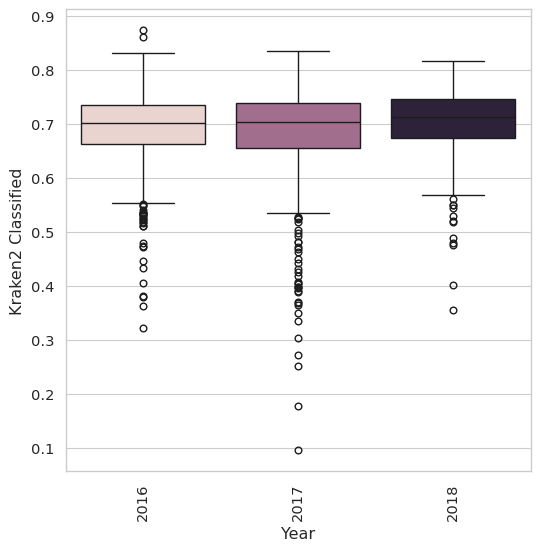

In [45]:
plt.figure(figsize=(6, 6))
sns.boxplot(data=data, x='Year', hue='Year', y='Relative Abundance', legend=False, log_scale=False)
plt.xticks(rotation=90)
plt.ylabel('Kraken2 Classified')

Text(0, 0.5, 'Kraken2 Classified')

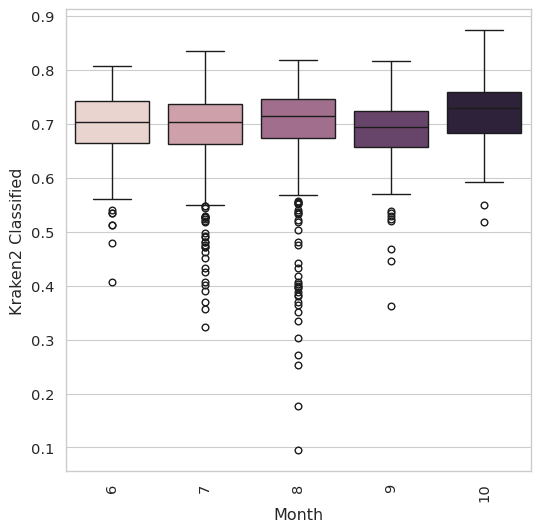

In [46]:
plt.figure(figsize=(6, 6))
sns.boxplot(data=data, x='Month', hue='Month', y='Relative Abundance', legend=False, log_scale=False)
plt.xticks(rotation=90)
plt.ylabel('Kraken2 Classified')

## Richness vs. Library size

In [56]:
df_list = []
cs_thresholds = ['005']# , '025', '050']
levels = ['S', 'G', 'F']
lods = [0, 5e-06, 1e-05]
lods = [5e-06]

for cs, lvl in product(cs_thresholds, levels):
    tid2parent, brack_df = get_brack_df(bs_ids, cs, lvl, bowtie2_path, k2_path, br_path, tid2name)

    for lod in lods: 
        r_df = get_richness_df(brack_df, taxa_names, lod, bs_ids)
        r_df.insert(1, 'Level', [lvl] * len(r_df))
        r_df.insert(1, 'LoD', [lod] * len(r_df))
        r_df.insert(1, 'CS', [cs] * len(r_df))
        df_list.append(r_df)
richness_df = pd.concat(df_list).merge(map_df[['Colony', 'Total Read Nr']], on='Colony')
richness_df

100%|██████████| 1442/1442 [00:09<00:00, 156.82it/s]
/cluster/raid/home/f80878961/.conda/envs/planb/lib/python3.9/site-packages/ete3/ncbi_taxonomy/ncbiquery.py:243: UserWarning: taxid 3121479 was translated into 3061286
  warnings.warn("taxid %s was translated into %s" %(taxid, merged_conversion[taxid]))
/cluster/raid/home/f80878961/.conda/envs/planb/lib/python3.9/site-packages/ete3/ncbi_taxonomy/ncbiquery.py:243: UserWarning: taxid 3122210 was translated into 3061286
  warnings.warn("taxid %s was translated into %s" %(taxid, merged_conversion[taxid]))
/cluster/raid/home/f80878961/.conda/envs/planb/lib/python3.9/site-packages/ete3/ncbi_taxonomy/ncbiquery.py:243: UserWarning: taxid 1532 was translated into 33035
  warnings.warn("taxid %s was translated into %s" %(taxid, merged_conversion[taxid]))
/cluster/raid/home/f80878961/.conda/envs/planb/lib/python3.9/site-packages/ete3/ncbi_taxonomy/ncbiquery.py:243: UserWarning: taxid 84292 was translated into 162393
  warnings.warn("taxid %s was

,Colony,CS,LoD,Level,Group,Richness,Total Read Nr
0,BS16_0001,005,0.000005,S,Archaea,0,37273881.0
1,BS16_0001,005,0.000005,S,Bacteria,49,37273881.0
2,BS16_0001,005,0.000005,S,Bee leftovers,2,37273881.0
3,BS16_0001,005,0.000005,S,DNA viruses,3,37273881.0
4,BS16_0001,005,0.000005,S,Embryophyta,1,37273881.0
...,...,...,...,...,...,...,...
38929,BS18_0686,005,0.000005,F,Embryophyta,2,36269294.0
38930,BS18_0686,005,0.000005,F,Fungi,1,36269294.0
38931,BS18_0686,005,0.000005,F,Other Eukaryota,0,36269294.0
38932,BS18_0686,005,0.000005,F,Other Metazoa,3,36269294.0


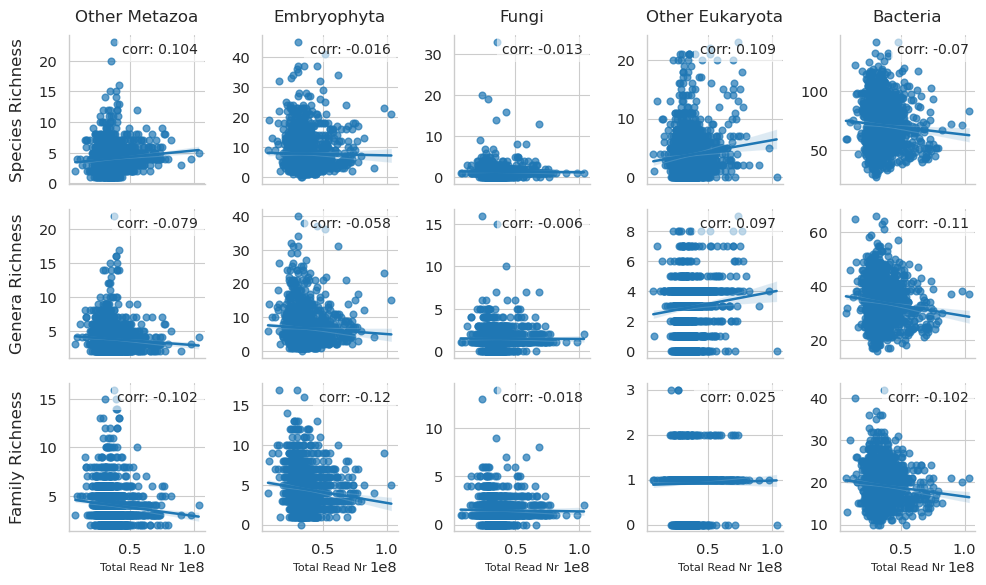

In [89]:
row_order = ['S', 'G', 'F']
row_names = ['Species Richness', 'Genera Richness', 'Family Richness']
col_order = ['Other Metazoa', 'Embryophyta', 'Fungi', 'Other Eukaryota', 'Bacteria']

g = sns.lmplot(
    data=richness_df,
    x='Total Read Nr', y='Richness',
    row='Level', col='Group',
    row_order=row_order,
    col_order=col_order,
    height=3, aspect=1,
    facet_kws=dict(sharey=False),
    scatter_kws=dict(alpha=0.7)
)

# Remove default small titles on every subplot
for ax in g.axes.flatten():
    ax.set_title("")

# Add ONE column title centered above each column
for j, col_name in enumerate(g.col_names):
    ax = g.axes[0, j]     # top row for each column
    ax.set_title(col_name, fontsize=12, pad=10)
    ax = g.axes[len(row_order) - 1, j]
    ax.set_xlabel(ax.get_xlabel(), fontsize=8)

# Add ONE row title (y‑axis label area) on the left of each row
for i, row_name in enumerate(g.row_names):
    ax = g.axes[i, 0]     # first column for each row
    ax.set_ylabel(row_names[i], fontsize=12, labelpad=10)

for i, j in product(range(len(g.row_names)), range(len(g.col_names))):
    ax = g.axes[i, j]
    df = richness_df[(richness_df['Level'] == row_order[i]) & (richness_df['Group'] == col_order[j])]
    txt = 'corr: {}'.format(round(df['Richness'].corr(df['Total Read Nr']), ndigits=3))
    ax.text(
        0.95, 0.95,        # x, y position in axis coordinates (0–1 range)
        txt,
        transform=ax.transAxes,
        ha='right', va='top', fontsize=10,
        bbox=dict(facecolor='white', alpha=0.6, edgecolor='none')
    )

g.fig.set_size_inches(10, 6) 
plt.tight_layout()
plt.show()


Bacteria S


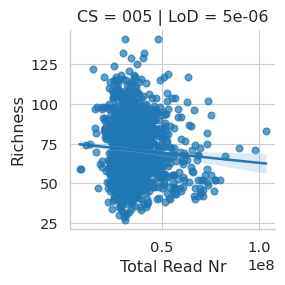

Bacteria G


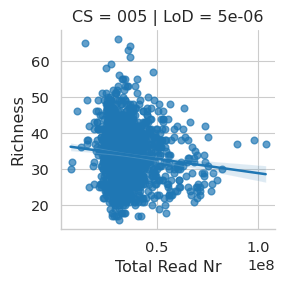

Bacteria F


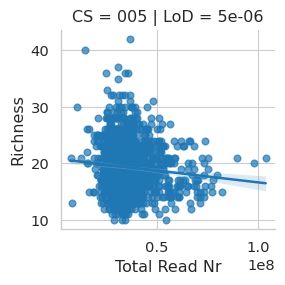

Embryophyta S


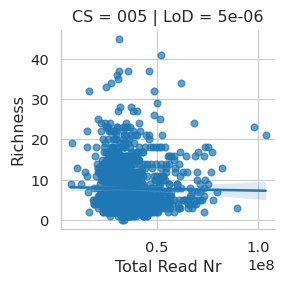

Embryophyta G


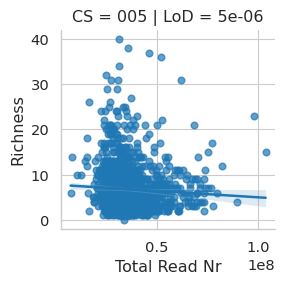

Embryophyta F


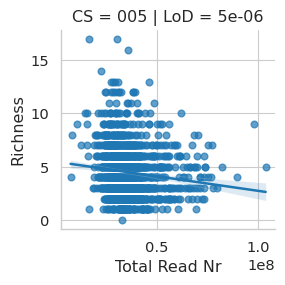

Fungi S


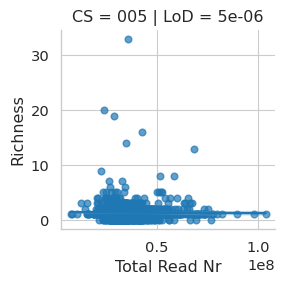

Fungi G


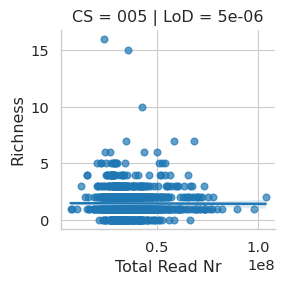

Fungi F


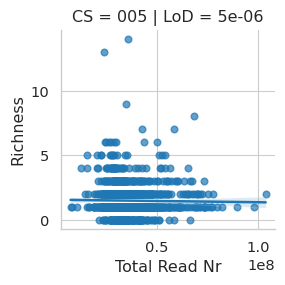

Other Eukaryota S


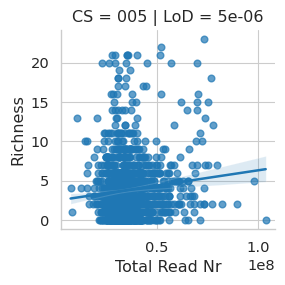

Other Eukaryota G


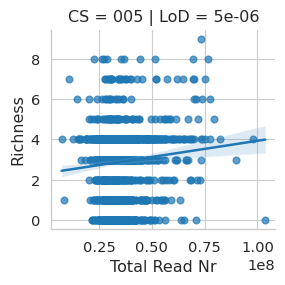

Other Eukaryota F


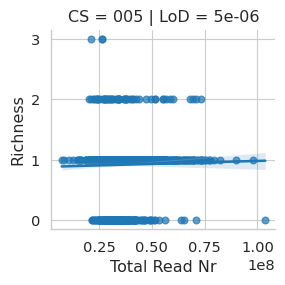

Other Metazoa S


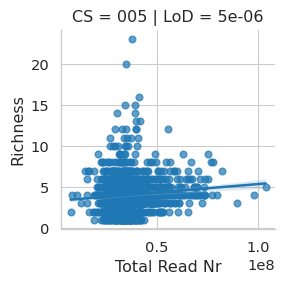

Other Metazoa G


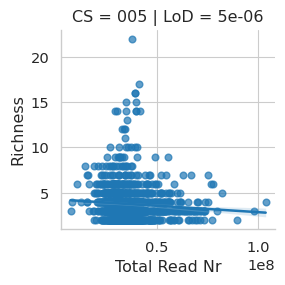

Other Metazoa F


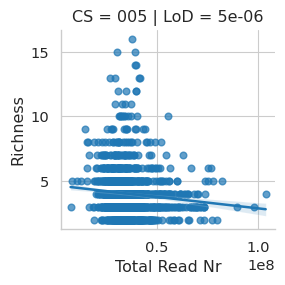

In [57]:
for group, lvl in product(['Bacteria', 'Embryophyta', 'Fungi', 'Other Eukaryota', 'Other Metazoa'], levels):
    
    print(group, lvl)
    data = richness_df[(richness_df['Group'] == group) & (richness_df['Level'] == lvl)]
    g = sns.lmplot(
        data=data,
        x='Total Read Nr', y='Richness',
        col="LoD", row="CS",
        height=3, aspect=1,
        scatter_kws=dict(alpha=0.7)
    )
    plt.show()

## Relative abundances

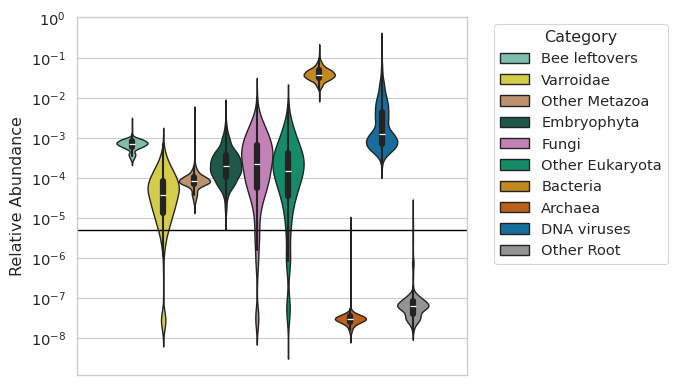

In [22]:
# ax = sns.boxplot(data=fam_class_df[fam_class_df['Category'].isin(categories)], x='Category', y='Relative abundance', palette=cmap, 
#             showmeans=True, meanprops={"marker":"o", "markerfacecolor":"red", "markeredgecolor":"black", "markersize":"5"}, order=categories)
fig, ax = plt.subplots(figsize=(7, 4))
ax.axhline(lod, color='black', linestyle='-', linewidth=1)
sns.violinplot(data=cat_df[cat_df['Category'].isin(taxa_names)], hue='Category', y='Relative Abundance', palette=taxon_cmap, hue_order=taxon_cmap, legend=True, log_scale=True, ax=ax)

# Format y-axis as percentages
# ax.yaxis.set_major_formatter(PercentFormatter(xmax=1, decimals=5))

# Manually add the legend to the right side
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles, labels=labels, title='Category', bbox_to_anchor=(1.05, 1), loc='upper left')

# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

## Richness

In [26]:
lvl = 'F'
tid2parent, brack_df = get_brack_df(bs_ids, cs, lvl, bowtie2_path, k2_path, br_path, tid2name)

richness_df = get_richness_df(brack_df, taxa_names, lod, bs_ids)
richness_df

100%|██████████| 664/664 [00:00<00:00, 1066.10it/s]


,Colony,Group,Richness
0,BS16_0001,Archaea,0
1,BS16_0001,Bacteria,15
2,BS16_0001,Bee leftovers,1
3,BS16_0001,DNA viruses,2
4,BS16_0001,Embryophyta,2
...,...,...,...
12973,BS18_0686,Embryophyta,2
12974,BS18_0686,Fungi,1
12975,BS18_0686,Other Eukaryota,0
12976,BS18_0686,Other Metazoa,3


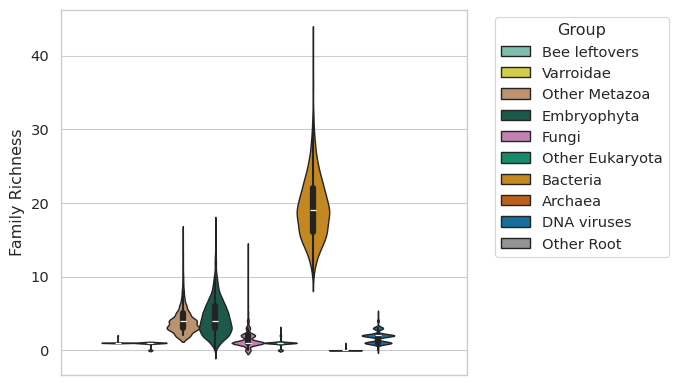

In [27]:
plt.figure(figsize=(7, 4))
# ax = sns.boxplot(data=fam_class_df[fam_class_df['Category'].isin(categories)], x='Category', y='Relative abundance', palette=cmap, 
#             showmeans=True, meanprops={"marker":"o", "markerfacecolor":"red", "markeredgecolor":"black", "markersize":"5"}, order=categories)
ax = sns.violinplot(data=richness_df, hue='Group', y='Richness', palette=taxon_cmap, hue_order=taxon_cmap, legend=True, log_scale=False)

# Manually add the legend to the right side
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles=handles, labels=labels, title='Group', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Family Richness')
# plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [30]:
# calculating the proportion of 
group = 'Bee leftovers'
group = 'Other Metazoa'
group = 'Embryophyta'
group = 'Fungi'
group = 'Other Eukaryota'
group = 'Varroidae'
group = 'DNA viruses'
group = 'Bacteria'

group_df = cat_df[(cat_df['Category'] == 'Classified')][['Colony', 'Read Number']].rename(columns={'Read Number': 'Classified Read Nr'}).merge(
    cat_df[(cat_df['Category'] == group)][['Colony', 'Read Number', 'Relative Abundance']], on='Colony').merge(richness_df[(richness_df['Group'] == group)][['Colony', 'Richness']], on='Colony')
group_df.insert(len(group_df.columns), 'Classified Read Fraction', group_df['Read Number'] / group_df['Classified Read Nr'])
group_df = group_df.merge(richness_df.groupby('Colony').sum('Richness').rename(columns={'Richness':'Total Richness'}), on='Colony')
group_df.insert(len(group_df.columns), 'Richness Fraction', group_df['Richness'] / group_df['Total Richness'])

group_df.describe()

,Classified Read Nr,Read Number,Relative Abundance,Richness,Classified Read Fraction,Total Richness,Richness Fraction
count,1.442000e+03,1.442000e+03,1442.000000,1442.000000,1442.000000,1442.000000,1442.000000
mean,1.655330e+06,1.428431e+06,0.040813,19.304438,0.872954,33.938974,0.569898
std,8.168298e+05,7.063606e+05,0.016231,4.251085,0.109094,6.722755,0.065339
min,3.545100e+05,2.848020e+05,0.009530,10.000000,0.094485,17.000000,0.375000
25%,1.140452e+06,9.931068e+05,0.030380,16.000000,0.844695,29.000000,0.523810
50%,1.485504e+06,1.283364e+06,0.037780,19.000000,0.909945,33.000000,0.571429
75%,1.981819e+06,1.690248e+06,0.047789,22.000000,0.942031,38.000000,0.615385
max,9.721347e+06,9.333088e+06,0.182869,42.000000,0.974327,73.000000,0.761905


## PAVIAN vis

In [9]:
readpool, mhg, sf, r, lvl = ('nonbee', 2, 1, 1, 'S') # better species level here
lod = 5e-06

n_colonies = len(bs_ids)
tid2lvl_tid_name = {}
tid2abundances = defaultdict(list)
tid2prevalence = Counter()

for i, bs_id in tqdm(enumerate(bs_ids[:n_colonies])):
    
    # classified read nr to recalculate relative abundance
    c_read_nr = get_classified_read_nr(bowtie2_path, k2_path, br_path, bs_id, krakdb, readpool, mhg, cs, sf, r, lvl, idx_name)
    
    breport_fn = '{}{}_{}_{}_mhg{}_cs{}_sf{}_rep{}_{}.breport'.format(br_path, bs_id, krakdb, readpool, mhg, cs, str(sf).replace('.', ''), r, lvl)
    breport_df = pd.read_csv(breport_fn, header=None, sep='\t')
    
    for row in breport_df.iterrows():
        lvl, tid, name = (row[1][3], row[1][4], row[1][5])
        
        if tid not in tid2lvl_tid_name:
            tid2abundances[tid] = [0] * n_colonies
            tid2lvl_tid_name[tid] = (lvl, tid, name)
        
        # recalculate
        relabund = row[1][1] / c_read_nr
        tid2abundances[tid][i] =  relabund

        # add to prevalence when above LOD threshold
        if relabund > lod:
            tid2prevalence[tid] += 1

1442it [00:48, 29.46it/s]


In [10]:
pavian_tree = ncbi.get_topology(list(tid2lvl_tid_name))

In [12]:
# mean relabund df 
rows = []
# taxon_filter = ['Bacteria']
# tid_filter = set(chain(*ncbi.get_name_translator(taxon_filter).values()))
for n in pavian_tree.traverse('preorder'): # needed to reproduce breport sorting
    tid = n.taxid
    mean_abund = np.mean(tid2abundances[tid])
    if mean_abund > lod:
        rows.append((mean_abund, mean_abund, mean_abund, *tid2lvl_tid_name[tid]))
pavian_df = pd.DataFrame(rows)
pavian_df = pavian_df[pavian_df[0] != 0]
pavian_df.to_csv('{}mean_relabund.breport'.format(tlf_path), sep='\t', header=False, index=False)
pavian_df

,0,1,2,3,4,5
0,0.047369,0.047369,0.047369,R,1,root
1,0.042895,0.042895,0.042895,R1,131567,cellular organisms
2,0.040813,0.040813,0.040813,D,2,Bacteria
3,0.026713,0.026713,0.026713,K,3379134,Pseudomonadati
4,0.026673,0.026673,0.026673,P,1224,Pseudomonadota
...,...,...,...,...,...,...
472,0.000275,0.000275,0.000275,S,38018,Bacteriophage sp.
473,0.003798,0.003798,0.003798,D1,12429,unclassified viruses
474,0.003797,0.003797,0.003797,D2,2204151,unclassified DNA viruses
475,0.003797,0.003797,0.003797,D3,51368,unclassified dsDNA viruses


In [34]:
# variance df 
rows = []
# taxon_filter = ['Bacteria']
# tid_filter = set(chain(*ncbi.get_name_translator(taxon_filter).values()))
for n in pavian_tree.traverse('preorder'): # needed to reproduce breport sorting
    tid = n.taxid
    mean_abund = np.mean(tid2abundances[tid])
    se_abund = np.std(tid2abundances[tid])
    if mean_abund > lod:
        rows.append((se_abund, se_abund, se_abund, *tid2lvl_tid_name[tid]))
pavian_df = pd.DataFrame(rows)
pavian_df = pavian_df[pavian_df[0] != 0]
pavian_df.to_csv('{}se_relabund.breport'.format(tlf_path), sep='\t', header=False, index=False)
pavian_df

,0,1,2,3,4,5
0,0.019414,0.019414,0.019414,R,1,root
1,0.016667,0.016667,0.016667,R1,131567,cellular organisms
2,0.016225,0.016225,0.016225,D,2,Bacteria
3,0.013327,0.013327,0.013327,K,3379134,Pseudomonadati
4,0.013313,0.013313,0.013313,P,1224,Pseudomonadota
...,...,...,...,...,...,...
472,0.000141,0.000141,0.000141,S,38018,Bacteriophage sp.
473,0.010037,0.010037,0.010037,D1,12429,unclassified viruses
474,0.010037,0.010037,0.010037,D2,2204151,unclassified DNA viruses
475,0.010037,0.010037,0.010037,D3,51368,unclassified dsDNA viruses


In [13]:
# prevalence df 
rows = []
for n in pavian_tree.traverse('preorder'): # needed to reproduce breport sorting
    tid = n.taxid
    prevalence = tid2prevalence[tid] / len(bs_ids)
    rows.append((prevalence, prevalence, prevalence, *tid2lvl_tid_name[tid]))
pavian_df = pd.DataFrame(rows)
pavian_df = pavian_df[pavian_df[0] != 0]
pavian_df.to_csv('{}prevalence.breport'.format(tlf_path), sep='\t', header=False, index=False)
pavian_df

,0,1,2,3,4,5
0,1.000000,1.000000,1.000000,R,1,root
1,1.000000,1.000000,1.000000,R1,131567,cellular organisms
2,1.000000,1.000000,1.000000,D,2,Bacteria
3,1.000000,1.000000,1.000000,K,3379134,Pseudomonadati
4,1.000000,1.000000,1.000000,P,1224,Pseudomonadota
...,...,...,...,...,...,...
8676,0.004161,0.004161,0.004161,R2,12908,unclassified sequences
8677,0.004161,0.004161,0.004161,R3,151659,environmental samples
8678,0.003467,0.003467,0.003467,R4,81490,prokaryotic environmental samples
8679,0.003467,0.003467,0.003467,S,198431,uncultured prokaryote


## Prevalence threshold identification

In [100]:
lvl = 'F'
abund_metric = 'Relative abundance'
tid2parent, brack_df =  get_brack_df(bs_ids, cs, lvl, bowtie2_path, k2_path, br_path, tid2name)
prev_df = get_prev_df(brack_df, tid2parent, abund_metric, lod, bs_ids)

100%|██████████| 664/664 [00:00<00:00, 818.23it/s]


In [101]:
prev_thresholds = np.arange(0, 1, 0.05)

columns = ['Min. Prevalence', 'Variable', 'Value']
rows = []
for pt in prev_thresholds:
    pt_prev_df = prev_df[prev_df['Prevalence'] >= pt]
    taxon_nr = len(pt_prev_df)
    beexact_taxon_nr = len(level2beexact_name2tid[lvl])
    overlap_taxon_nr = len(set(pt_prev_df['TaxID']).intersection(level2beexact_name2tid[lvl].values()))
    precision = overlap_taxon_nr / taxon_nr
    sensitivity = overlap_taxon_nr / beexact_taxon_nr
    rows.append((round(pt, 2), 'Family Nr', taxon_nr))
    rows.append((round(pt, 2), 'Included families % that are bee-associated', precision))
    rows.append((round(pt, 2), 'Bee-associated families % that are included', sensitivity))
    rows.append((round(pt, 2), 'F1', stats.hmean([precision, sensitivity])))
prev_cum_df = pd.DataFrame(data=rows, columns=columns)
prev_cum_df

,Min. Prevalence,Variable,Value
0,0.00,Family Nr,350.000000
1,0.00,Included families % that are bee-associated,0.311429
2,0.00,Bee-associated families % that are included,0.183502
3,0.00,F1,0.230932
4,0.05,Family Nr,81.000000
...,...,...,...
75,0.90,F1,0.032949
76,0.95,Family Nr,12.000000
77,0.95,Included families % that are bee-associated,0.750000
78,0.95,Bee-associated families % that are included,0.015152


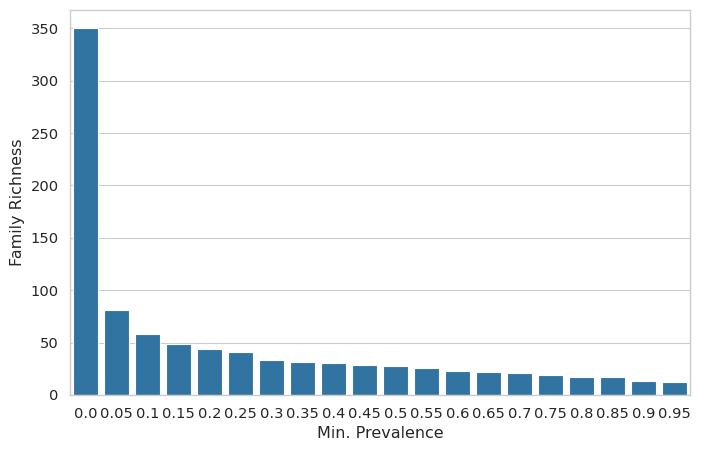

In [104]:
fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(data=prev_cum_df[prev_cum_df['Variable'] == 'Family Nr'], x='Min. Prevalence', y='Value')
#ax.set_ylim((0.30, 0.85))
#ax.set_title("{}-level".format(lvl))
#plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel('Family Richness')
plt.show()

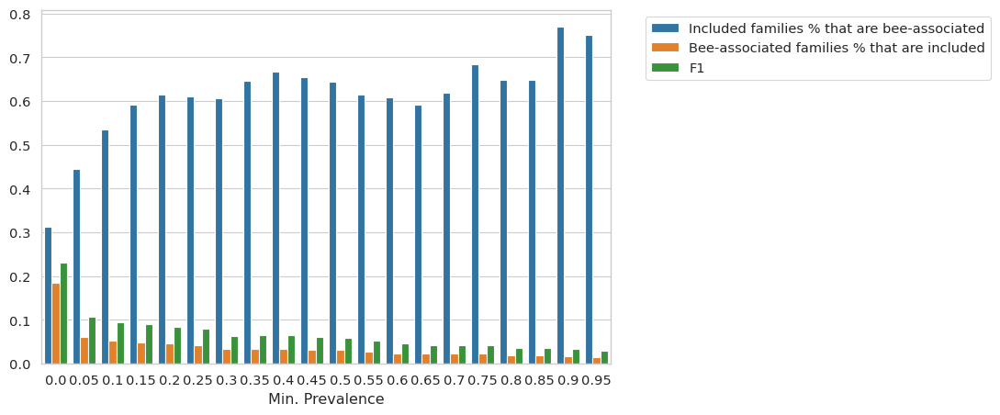

In [105]:
fig, ax = plt.subplots(figsize=(8,5))
sns.barplot(data=prev_cum_df[prev_cum_df['Variable'] != 'Family Nr'], x='Min. Prevalence', y='Value', hue='Variable')
#ax.set_ylim((0.30, 0.85))
#ax.set_title("{}-level".format(lvl))
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.ylabel(None)
plt.show()

# Varroa phenotypes

## Genomic Varroa load phenotyping

(1442, 44)


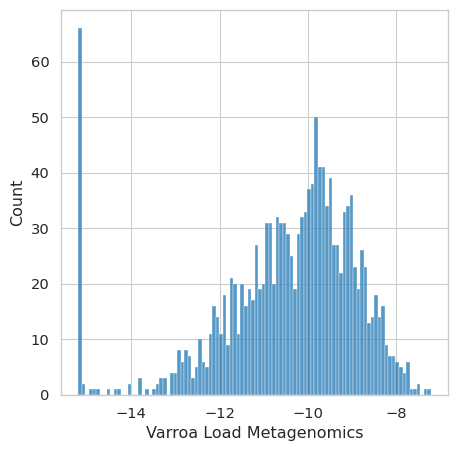

In [60]:
x = 'log_v_meta'
print(pheno_df.dropna(subset=[x]).shape)
fig, ax = plt.subplots(figsize=(5, 5))
sns.histplot(data=pheno_df, x=x, bins=100, ax=ax)
plt.xlabel('Varroa Load Metagenomics')
plt.show()

(1283, 44)


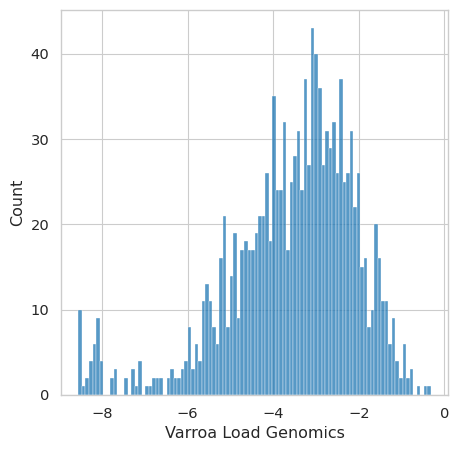

In [58]:
x = 'log_v_mito'
print(pheno_df.dropna(subset=[x]).shape)
fig, ax = plt.subplots(figsize=(5, 5))
sns.histplot(data=pheno_df, x=x, bins=100, ax=ax)
plt.xlabel('Varroa Load Genomics')
plt.show()

(1345, 44)


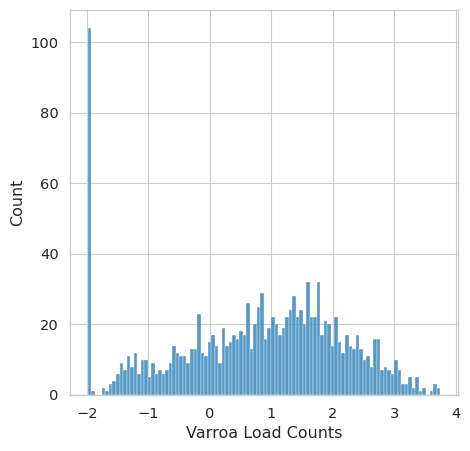

In [59]:
x = 'log_v_pho'
print(pheno_df.dropna(subset=[x]).shape)
fig, ax = plt.subplots(figsize=(5, 5))
sns.histplot(data=pheno_df, x=x, bins=100, ax=ax)
plt.xlabel('Varroa Load Counts')
plt.show()

1283
0.9792952593722386


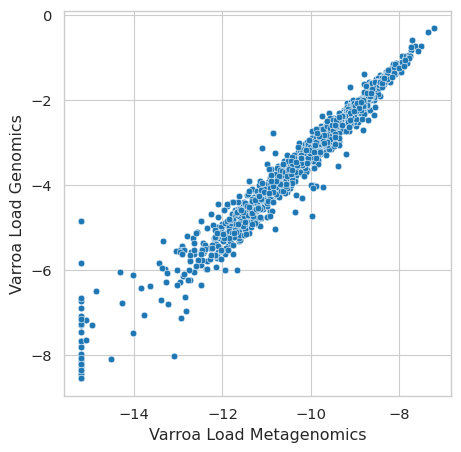

In [61]:
x = 'log_v_meta'
y = 'log_v_mito'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Load Metagenomics')
plt.ylabel('Varroa Load Genomics')
plt.show()

1345
0.7758169966459567


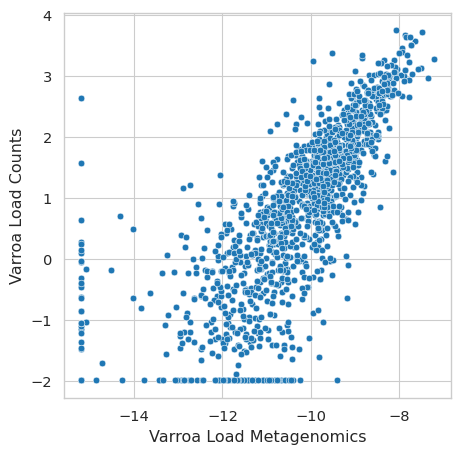

In [62]:
x = 'log_v_meta'
y = 'log_v_pho'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Load Metagenomics')
plt.ylabel('Varroa Load Counts')
plt.show()

1205
0.7840773929122351


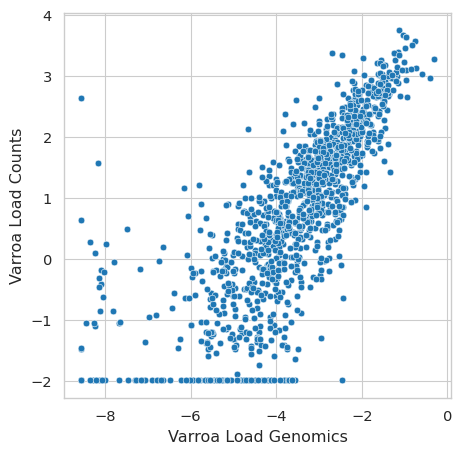

In [63]:
x = 'log_v_mito'
y = 'log_v_pho'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Load Genomics')
plt.ylabel('Varroa Load Counts')
plt.show()

1205
0.7840773929122351


<Axes: xlabel='log_v_mito', ylabel='log_v_pho'>

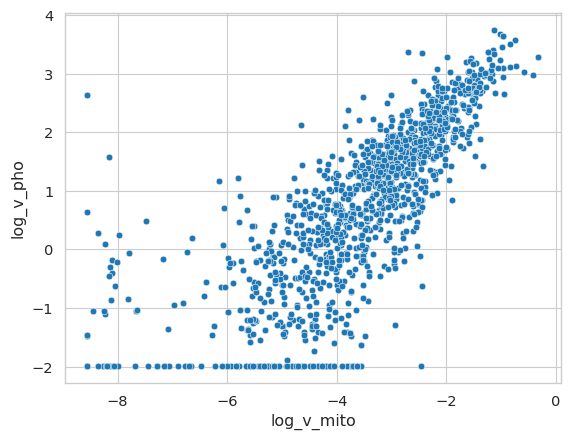

In [55]:
x = 'log_v_mito'
y = 'log_v_pho'
dff = pheno_df.dropna(subset=[x, y])
# dff = dff[dff[x] > -15] --> to remove 0 v_meta values
print(dff.shape[0])
print(dff[x].corr(dff[y]))
sns.scatterplot(data=dff, x=x, y=y)

## Varroa traits vs. covariables

In [12]:
trait2label = {
    'log_v_meta' : 'log_v_meta',
    'log_v_pho' : 'log_v_pho',
    'Recapping' : 'Recapping',
    'DMR' : 'DMR'
}

trait = 'log_v_meta'
# trait = 'raw_mnr'
# trait = 'logit_recap_inf'

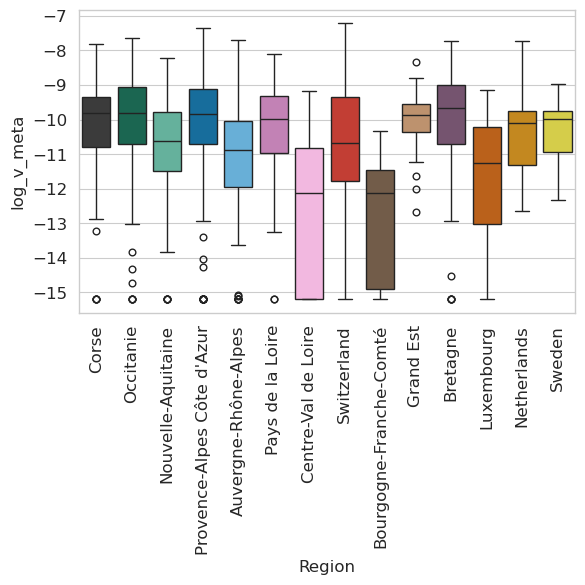

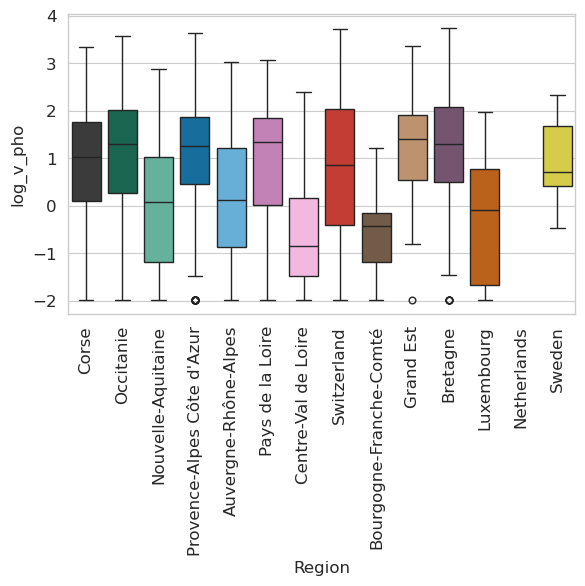

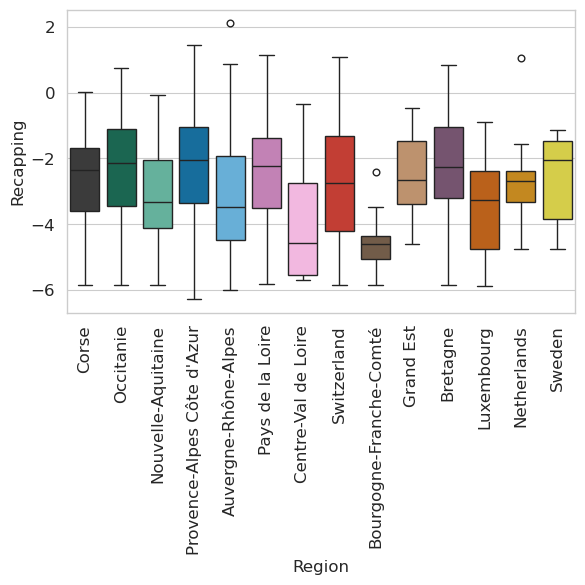

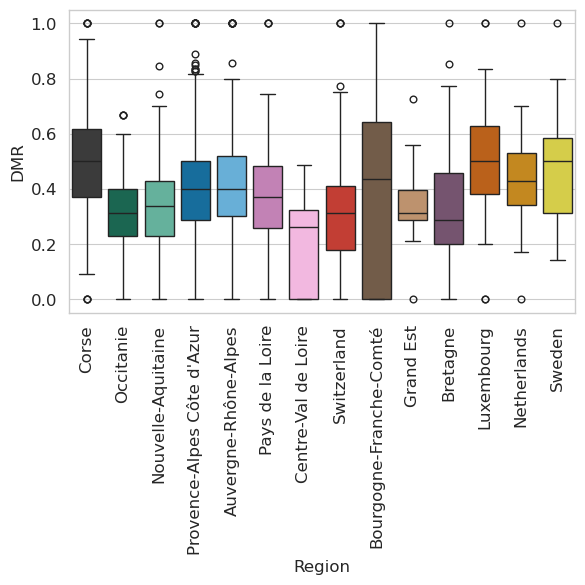

In [26]:
for trait, trait_label in trait2label.items():
    plt.figure(figsize=(6, 6))
    sns.boxplot(pheno_df, x='Region', y=trait, hue='Region', palette=cmap_region, order=region_order)
    plt.xticks(ticks=range(len(var2labels['Region'])), labels=[var2labels['Region'][x] for x in region_order], rotation=90, fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Region', fontsize=12)
    plt.ylabel(trait_label, fontsize=12)
    plt.tight_layout()
    plt.show()

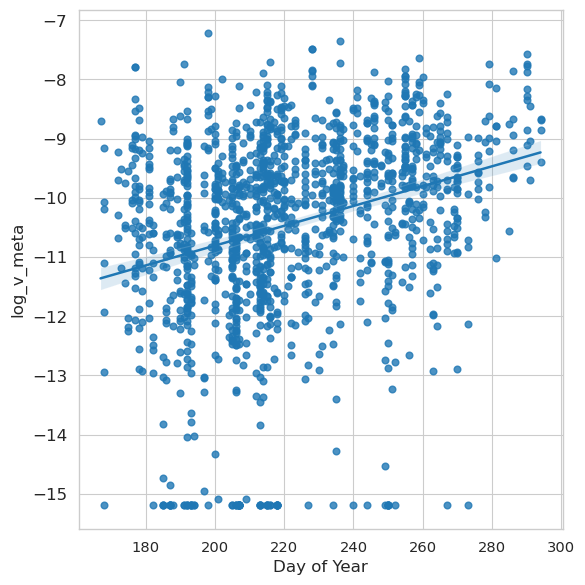

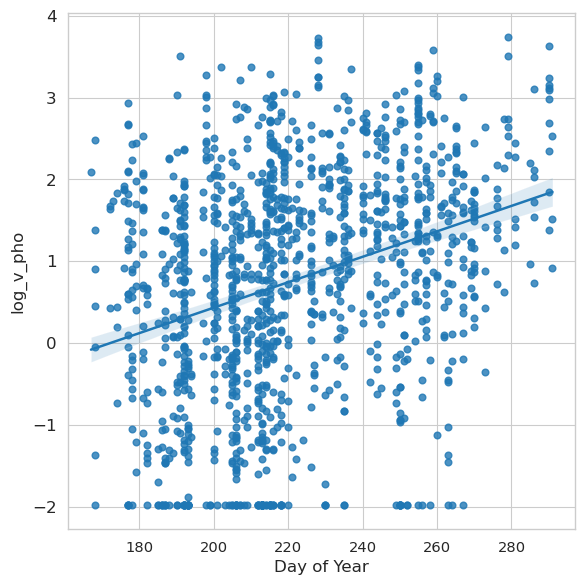

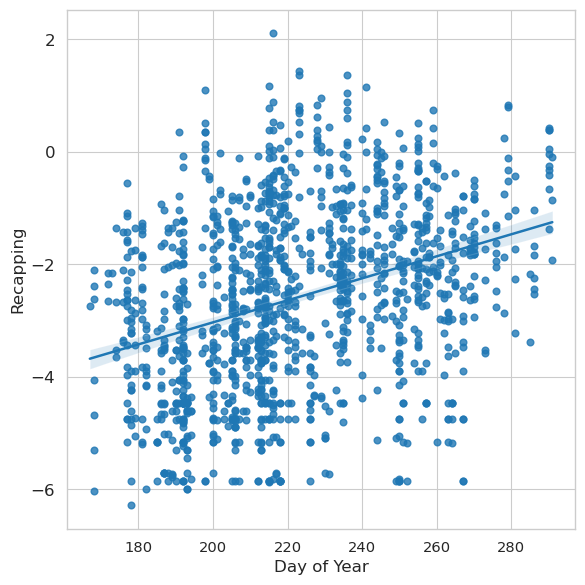

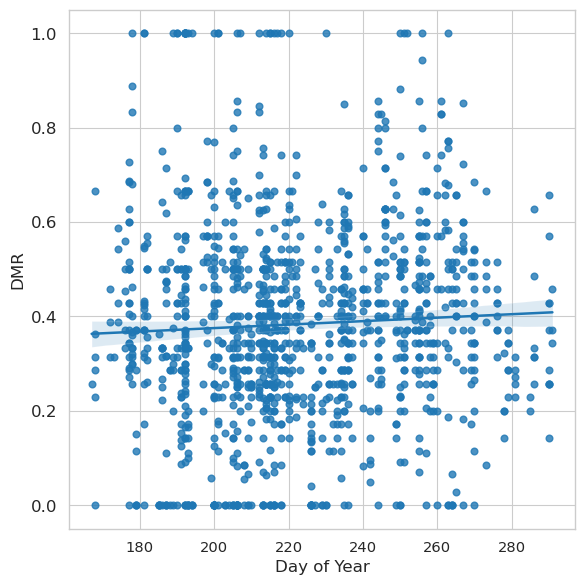

In [27]:
for trait, trait_label in trait2label.items():
    plt.figure(figsize=(6, 6))
    sns.regplot(pheno_df, x='Day of Year', y=trait)
    plt.yticks(fontsize=12)
    plt.xlabel('Day of Year', fontsize=12)
    plt.ylabel(trait_label, fontsize=12)
    plt.tight_layout()
    plt.show()
    

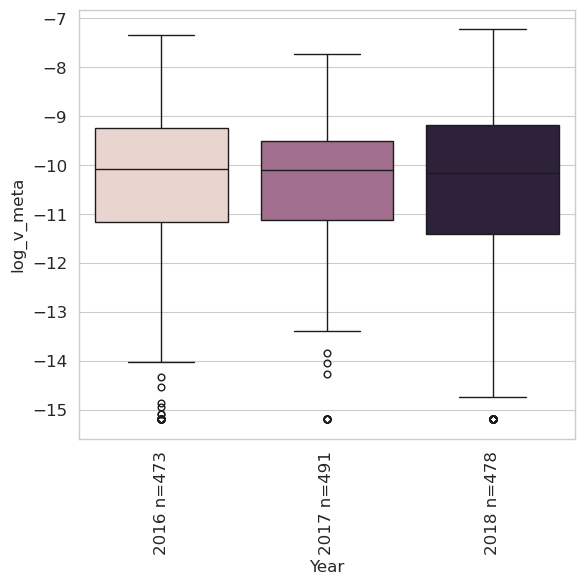

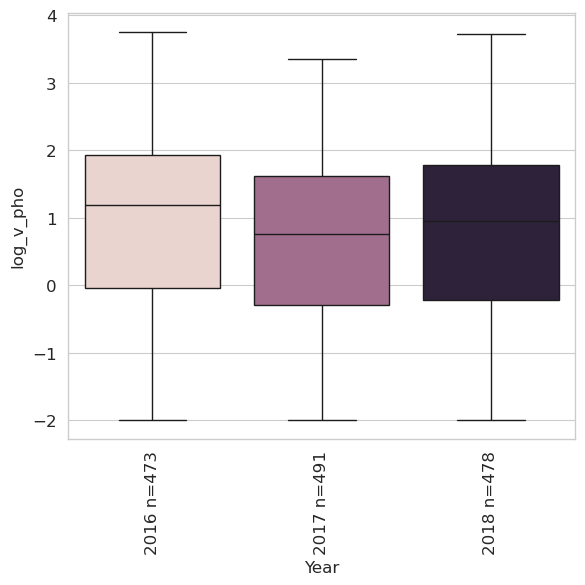

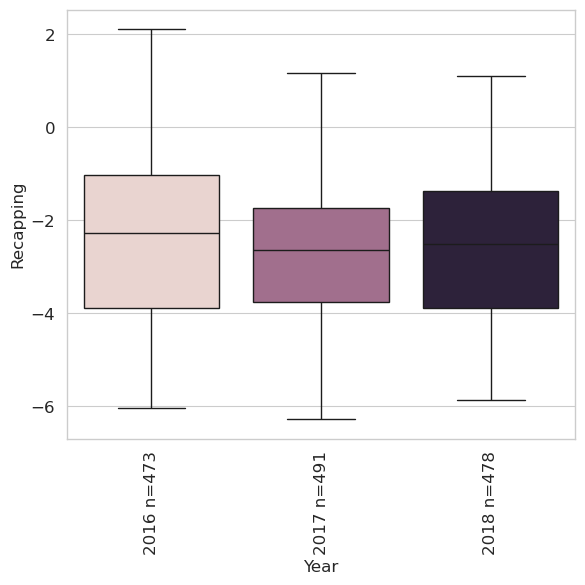

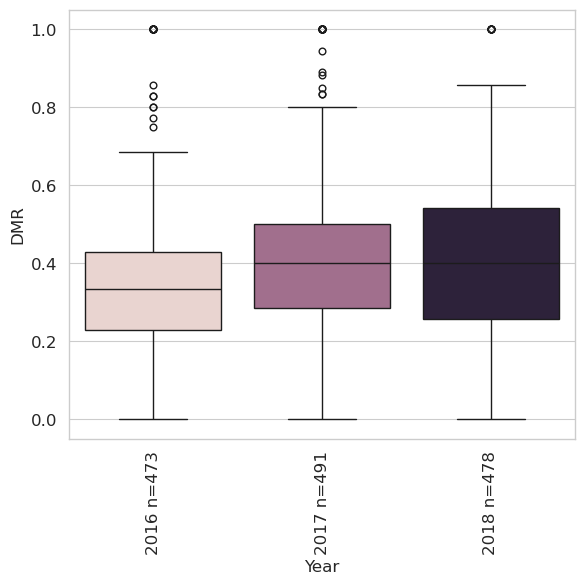

In [19]:
for trait, trait_label in trait2label.items():
    plt.figure(figsize=(6, 6))
    sns.boxplot(pheno_df, x='Year', y=trait, hue='Year')
    plt.xticks(ticks=range(len(var2labels['Year'])), labels=var2labels['Year'], rotation=90, fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('Year', fontsize=12)
    plt.ylabel(trait_label, fontsize=12)
    plt.legend().set_visible(False)
    plt.tight_layout()
    plt.show()

In [22]:
pheno_df

,Colony,date,Genetic group,percent_Ligustica_Carnica,percent_Mellifera,percent_Caucasica,bee_weigth,nbr_pho_varroa,nbr_pho_varroa_100bee,v_pho,...,Day of Year,Latitude,Longitude,v_meta,log_v_meta,log_v_pho,log_v_mito,Varroa group,Recapping group,DMR group
0,BS16_0001,01/08/2016,hybrid,0.158920,0.712885,0.128195,38.5,55.0,19.0,20.000000,...,214,44.0,5.167,0.000372,-7.895768,2.995732,-1.175053,High,High,Low
1,BS16_0002,01/08/2016,hybrid,0.001545,0.776361,0.222094,36.1,10.0,4.0,3.878116,...,214,44.0,5.167,0.000026,-10.543333,1.355350,-4.171704,Medium,Medium,Low
2,BS16_0003,01/08/2016,hybrid,0.752977,0.206098,0.040926,39.0,12.0,4.0,4.307692,...,214,44.0,5.167,0.000019,-10.854801,1.460402,-4.166909,Low,Medium,Medium
3,BS16_0004,29/09/2016,Mellifera,0.066520,0.829661,0.103819,40.7,12.0,4.0,4.127764,...,273,44.0,5.167,0.000048,-9.937342,1.417736,-3.265586,Medium,High,High
4,BS16_0005,28/07/2016,hybrid,0.578850,0.409558,0.011593,45.0,14.0,4.0,4.355556,...,210,44.0,5.167,0.000062,-9.686216,1.471452,-2.902179,Medium,Low,Low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1437,BS18_0675,18/10/2018,Ligustica_Carnica,0.999239,0.000041,0.000720,45.0,8.0,2.0,2.488889,...,291,44.0,5.167,0.000061,-9.706052,0.911836,NaN,Medium,Medium,Medium
1438,BS18_0681,17/10/2018,hybrid,0.582663,0.000738,0.416599,47.0,74.0,21.0,22.042553,...,290,43.5,5.167,0.000382,-7.868939,3.092975,-1.063650,High,High,High
1439,BS18_0682,17/10/2018,hybrid,0.414228,0.395046,0.190726,47.0,35.0,10.0,10.425532,...,290,43.5,5.167,0.000143,-8.851630,2.344258,-2.046166,High,High,Low
1440,BS18_0684,17/10/2018,Ligustica_Carnica,0.988999,0.000257,0.010744,64.0,29.0,6.0,6.343750,...,290,43.5,5.167,0.000111,-9.110080,1.847470,-2.482229,High,High,Medium


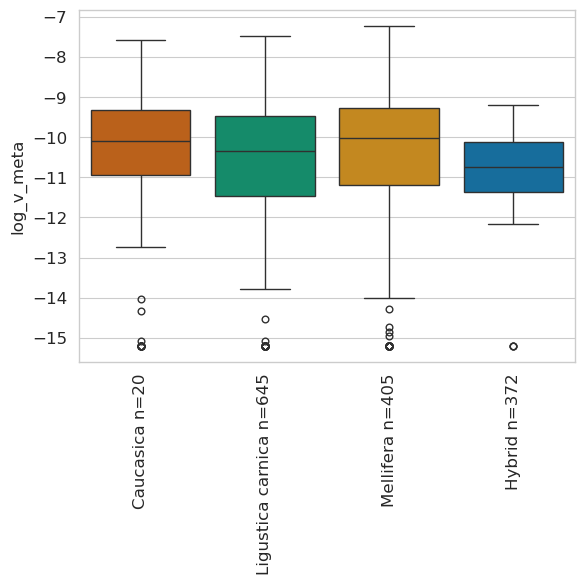

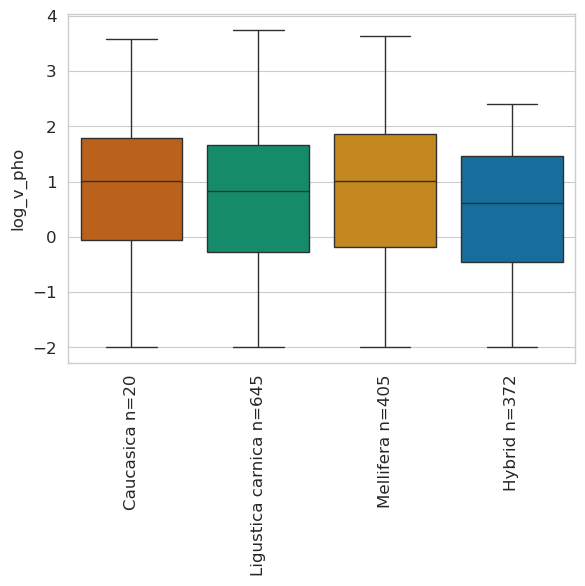

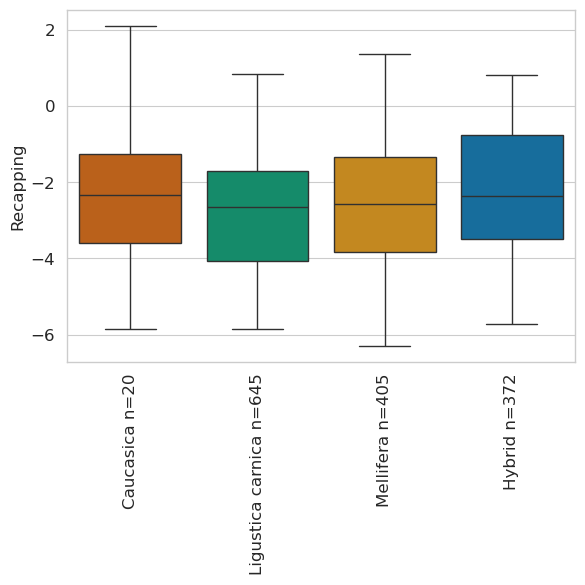

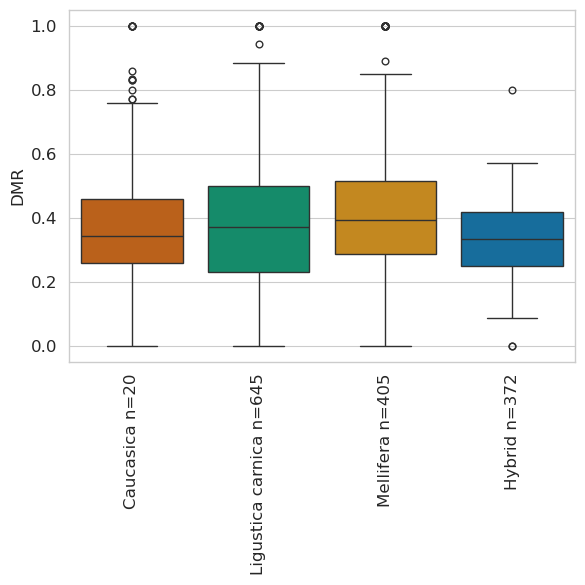

In [25]:
for trait, trait_label in trait2label.items():
    plt.figure(figsize=(6, 6))
    sns.boxplot(pheno_df, x='Genetic group', y=trait, hue='Genetic group', palette=cmap_gengroup)
    plt.xticks(ticks=range(len(var2labels['Genetic group'])), labels=var2labels['Genetic group'], rotation=90, fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel('', fontsize=12)
    plt.ylabel(trait_label, fontsize=12)
    # plt.legend().set_visible(False)
    plt.tight_layout()
    plt.show()
    

## Correlation between phenotypes

(1338, 44)


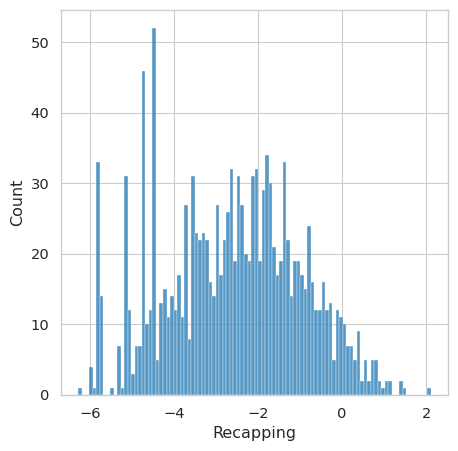

In [53]:
x = 'Recapping'
print(pheno_df.dropna(subset=[x]).shape)
fig, ax = plt.subplots(figsize=(5, 5))
sns.histplot(data=pheno_df, x=x, bins=100, ax=ax)
plt.xlabel(x)
plt.show()

(1280, 44)


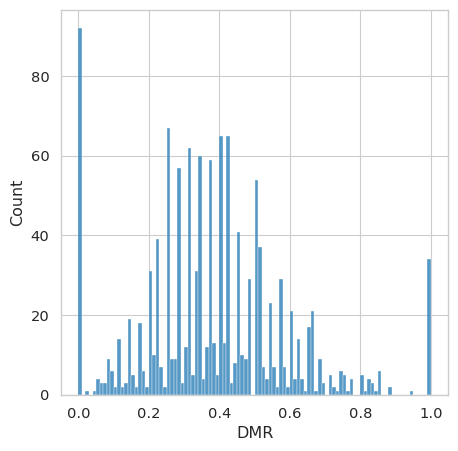

In [54]:
x = 'DMR'
print(pheno_df.dropna(subset=[x]).shape)
fig, ax = plt.subplots(figsize=(5, 5))
sns.histplot(data=pheno_df, x=x, bins=100, ax=ax)
plt.xlabel(x)
plt.show()

1338
0.7473488817580471


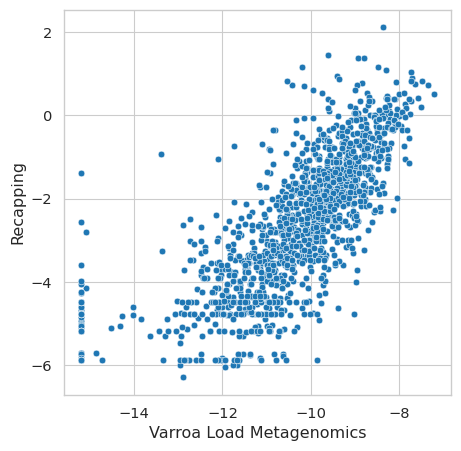

In [56]:
x = 'log_v_meta'
y = 'Recapping'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Load Metagenomics')
plt.ylabel('Recapping')
plt.show()

1301
0.7723329150537611


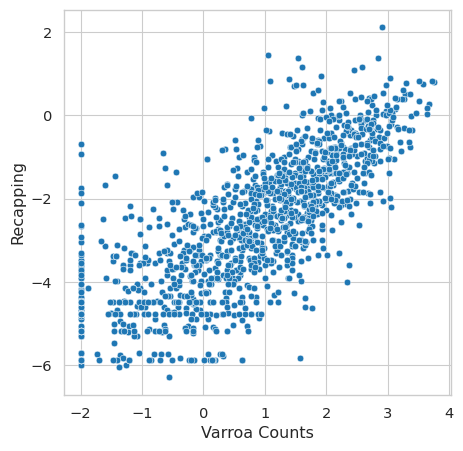

In [57]:
x = 'log_v_pho'
y = 'Recapping'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Counts')
plt.ylabel('Recapping')
plt.show()

1243
0.02798200464337783


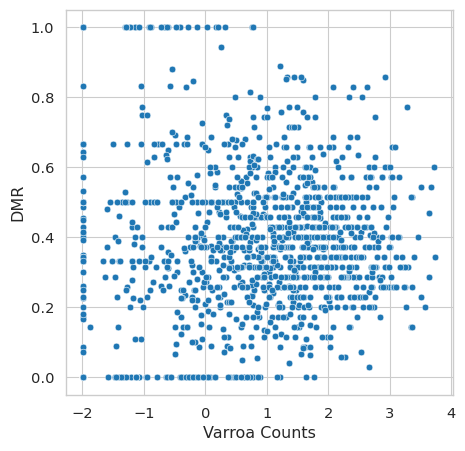

In [58]:
x = 'log_v_pho'
y = 'DMR'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Counts')
plt.ylabel('DMR')
plt.show()

1280
0.0447540065452095


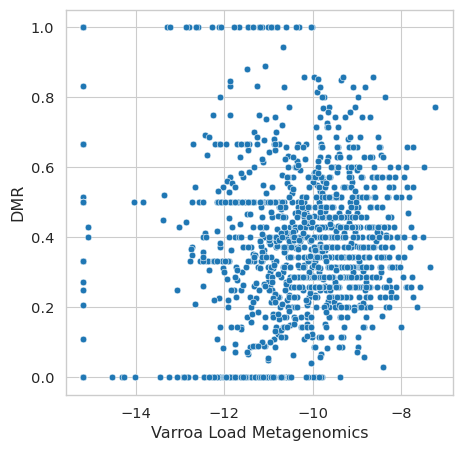

In [60]:
x = 'log_v_meta'
y = 'DMR'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Varroa Load Metagenomics')
plt.ylabel('DMR')
plt.show()

1280
0.039026634409789346


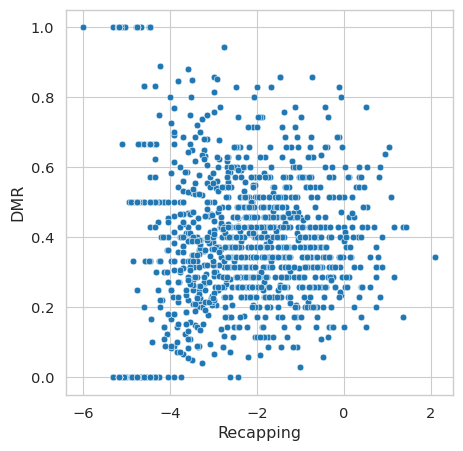

In [61]:
x = 'Recapping'
y = 'DMR'
dff = pheno_df.dropna(subset=[x, y])
print(dff.shape[0])
print(dff[x].corr(dff[y]))
fig, ax = plt.subplots(figsize=(5, 5))
sns.scatterplot(data=dff, x=x, y=y, ax=ax)
plt.xlabel('Recapping')
plt.ylabel('DMR')
plt.show()

In [35]:
raw_metadata_fn = '{}beestrong_metadata_raw.csv'.format(metadata_path)
or_pheno_df = pd.read_table(raw_metadata_fn)
or_pheno_df

,num_bs,date,group,percent_Ligustica_Carnica,percent_Mellifera,percent_Caucasica,bee_weigth,nbr_pho_varroa,nbr_pho_varroa_100bee,v_pho,...,pca1,nbr_open.1,nbr_recap_inf,recap_inf,logit_recap_inf,nbr_inf_1fondress,nbr_inf_norepro,percent_mnr,raw_mnr,eb_mmr
0,BS16_0001,01/08/2016,hybrid,0.158920,0.712885,0.128195,38.5,55.0,19.0,20.000000,...,3.745436,125.0,6.0,0.320000,-0.740775,35.0,9.0,26.0,0.257143,0.282885
1,BS16_0002,01/08/2016,hybrid,0.001545,0.776361,0.222094,36.1,10.0,4.0,3.878116,...,-0.292377,622.0,1.0,0.057878,-2.764107,35.0,9.0,26.0,0.257143,0.282885
2,BS16_0003,01/08/2016,hybrid,0.752977,0.206098,0.040926,39.0,12.0,4.0,4.307692,...,-0.222335,620.0,1.0,0.056452,-2.789801,35.0,14.0,40.0,0.400000,0.399892
3,BS16_0004,29/09/2016,Mellifera,0.066520,0.829661,0.103819,40.7,12.0,4.0,4.127764,...,0.949911,257.0,12.0,0.147860,-1.730066,35.0,17.0,49.0,0.485714,0.470096
4,BS16_0005,28/07/2016,hybrid,0.578850,0.409558,0.011593,45.0,14.0,4.0,4.355556,...,-0.666108,360.0,0.0,0.011111,-4.268298,4.0,1.0,25.0,0.250000,0.348465
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1508,BS18_0675,18/10/2018,Ligustica_Carnica,0.999239,0.000041,0.000720,45.0,8.0,2.0,2.488889,...,0.258438,373.0,15.0,0.126005,-1.918759,35.0,13.0,37.0,0.371429,0.376490
1509,BS18_0681,17/10/2018,hybrid,0.582663,0.000738,0.416599,47.0,74.0,21.0,22.042553,...,3.984007,122.0,42.0,0.491803,-0.032261,35.0,23.0,66.0,0.657143,0.610505
1510,BS18_0682,17/10/2018,hybrid,0.414228,0.395046,0.190726,47.0,35.0,10.0,10.425532,...,2.704905,103.0,17.0,0.436893,-0.248896,35.0,5.0,14.0,0.142857,0.189279
1511,BS18_0684,17/10/2018,Ligustica_Carnica,0.988999,0.000257,0.010744,64.0,29.0,6.0,6.343750,...,1.869805,119.0,8.0,0.336134,-0.668455,35.0,15.0,43.0,0.428571,0.423293


In [37]:
or_pheno_df.columns

Index(['num_bs', 'date', 'group', 'percent_Ligustica_Carnica',
       'percent_Mellifera', 'percent_Caucasica', 'bee_weigth',
       'nbr_pho_varroa', 'nbr_pho_varroa_100bee', 'v_pho', 'v_mito',
       'nbr_open', 'nbr_inf', 'nbr_bee', 'nbr_closed_brood', 'nbr_open_brood',
       'nbr_male_brood', 'brood', 'v_load', 'pca1', 'nbr_open.1',
       'nbr_recap_inf', 'recap_inf', 'logit_recap_inf', 'nbr_inf_1fondress',
       'nbr_inf_norepro', 'percent_mnr', 'raw_mnr', 'eb_mmr'],
      dtype='object')

<Axes: xlabel='pca1', ylabel='logit_recap_inf'>

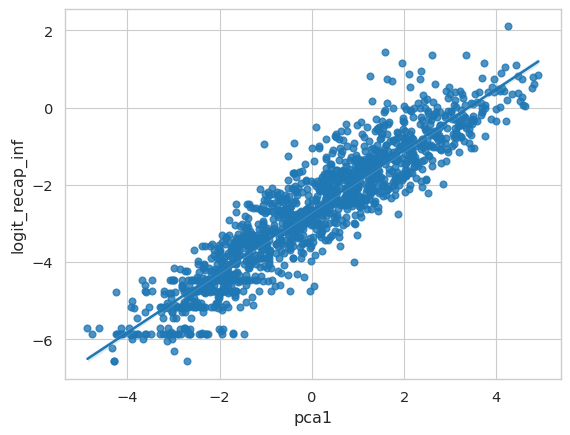

In [50]:
sns.regplot(data=or_pheno_df, x='pca1', y='logit_recap_inf')

<Axes: xlabel='raw_mnr', ylabel='recap_inf'>

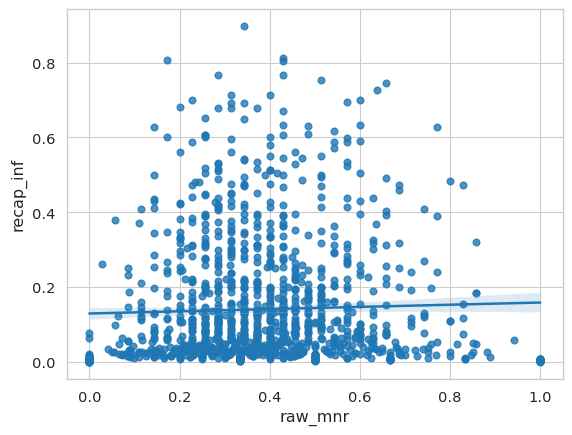

In [43]:
sns.regplot(data=or_pheno_df, x='raw_mnr', y='recap_inf')

<Axes: xlabel='Recapping', ylabel='Count'>

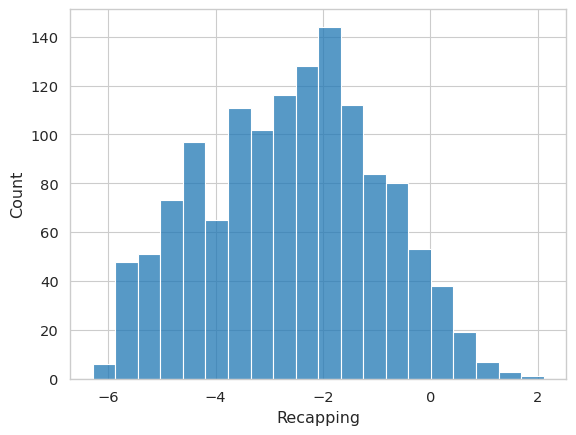

In [46]:
sns.histplot(pheno_df, x='Recapping')

<Axes: xlabel='DMR', ylabel='Count'>

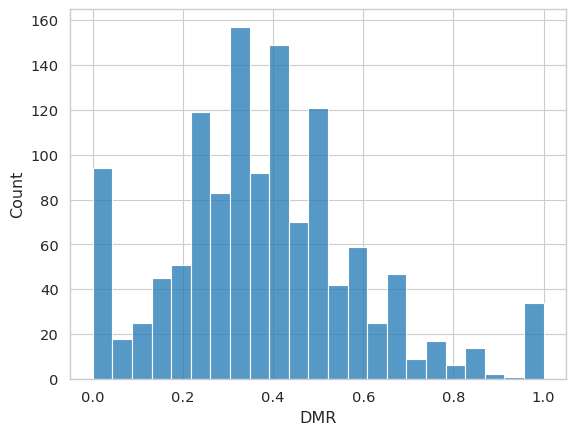

In [47]:
sns.histplot(pheno_df, x='DMR')

# Export abundance tables for R

In [6]:
from scipy.stats import gmean

def add_CLR(brack_df, bs_ids):
    n = len(set(brack_df['Taxon']))
    centered_ratios = []
    for bs_id in tqdm(bs_ids):
        read_counts = brack_df[brack_df['Colony'] == bs_id]['Read number'].to_numpy()
        arr = np.zeros(n)
        arr[: read_counts.shape[0]] = read_counts
        arr += 1
        g = gmean(arr)
        centered_ratios.extend(list(read_counts / g))

    brack_df.insert(9, 'Centered Ratio', centered_ratios)
    brack_df.insert(10, 'Centered Log Ratio', np.log(centered_ratios))

In [7]:
bs_ids = all_bs_ids
cs = '005'
lvl = 'F'
k2_path = all_kraken2_path
br_path = all_bracken_path
min_prev = 0.05

lvl2name = {
    'F': 'Family'
}

In [8]:
tid2parent, brack_df =  get_brack_df(bs_ids, cs, lvl, bowtie2_path, k2_path, br_path, tid2name)
add_CLR(brack_df, bs_ids)

100%|██████████| 1442/1442 [00:11<00:00, 123.62it/s]


## Identify lod

what is the lod corresonding to 5e-06 for ALR and CLR transfo?

/cluster/raid/home/f80878961/.conda/envs/planb/lib/python3.9/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


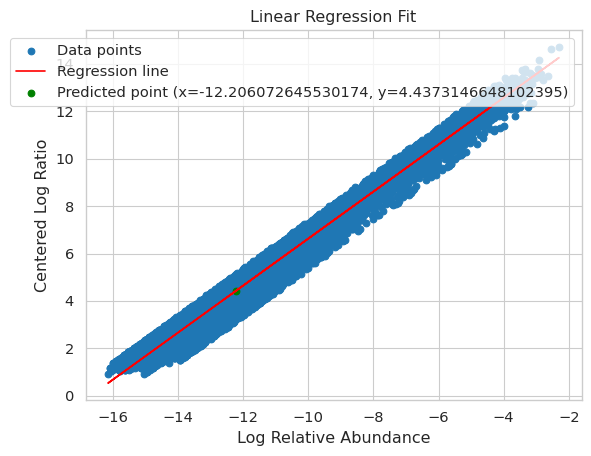

In [ ]:
from sklearn.linear_model import LinearRegression

y = 'Centered Log Ratio'
# y = 'Log Ratio Honeybee'
x =  'Log Relative Abundance'

df = brack_df[brack_df['Taxon'] != 'Apidae']

# Fit linear regression
model = LinearRegression()
model.fit(df[[x]], df[[y]])

# Predict y for a given x
x_value = np.log(lod)
predicted_y = model.predict([[x_value]])[0]

# Plot
plt.scatter(df[[x]], df[[y]], label='Data points')
plt.plot(df[[x]], model.predict(df[[x]]), color='red', label='Regression line')
plt.scatter(x_value, predicted_y, color='green', label=f'Predicted point (x={x_value}, y={predicted_y[0]})')
plt.xlabel(x)
plt.ylabel(y)
plt.title('Linear Regression Fit')
plt.legend()
plt.grid(True)
plt.show()

In [103]:
predicted_y

array([4.43731466])

## LRA

In [ ]:
lod = 5e-06
abund_metric = 'Relative abundance'

In [ ]:
f = brack_df['Group'].isin({'Archaea', 'Bacteria', 'Embryophyta', 'Other Eukaryota', 'Fungi', 'Other Metazoa', 'DNA viruses'})
symbio_df = brack_df[f & (brack_df['Relative abundance'] >= lod)]
prev_df = get_prev_df(brack_df, tid2parent, abund_metric, lod, bs_ids)
core_symbio_df = symbio_df[symbio_df['Taxon'].isin(prev_df[prev_df['Prevalence'] >= min_prev]['Taxon'])]

100%|██████████| 1442/1442 [00:09<00:00, 151.73it/s]


In [108]:
fn = '{}2026_Core_{}_LRA.csv'.format(tlf_path, lvl2name[lvl])
zero = np.log(lod / 2) # as in MaASlin
core_symbio_df.pivot(index='Colony', columns='Taxon', values='Log Relative Abundance').fillna(zero).to_csv(fn, index=True)
pd.read_csv(fn, index_col='Colony')

,Acetobacteraceae,Actinomycetaceae,Aeromonadaceae,Apiaceae,Araliaceae,Asparagaceae,Asteraceae,Autographiviridae,Bacillaceae,Bartonellaceae,...,Streptomycetaceae,Tachinidae,Tephritidae,Timematidae,Trypanosomatidae,Vespidae,Vibrionaceae,Vitaceae,Weeksellaceae,Yersiniaceae
Colony,,,,,,,,,,,,,,,,,,,,,
BS16_0001,-7.109197,-12.899220,-12.899220,-12.89922,-12.899220,-12.899220,-10.946596,-12.89922,-12.899220,-4.953587,...,-12.899220,-12.89922,-12.89922,-9.991677,-9.296164,-12.89922,-12.89922,-12.899220,-10.160940,-12.899220
BS16_0002,-6.729585,-12.899220,-10.711879,-12.89922,-12.899220,-12.899220,-9.133166,-11.46263,-12.899220,-5.223285,...,-12.899220,-12.89922,-12.89922,-9.993339,-8.612591,-12.89922,-12.89922,-12.899220,-9.378392,-12.023850
BS16_0003,-7.809563,-12.899220,-12.899220,-12.89922,-12.899220,-12.899220,-10.435929,-12.89922,-12.899220,-7.432768,...,-11.356046,-12.89922,-12.89922,-9.748414,-8.962568,-12.89922,-12.89922,-12.899220,-11.182595,-10.742660
BS16_0004,-7.149389,-12.899220,-12.899220,-12.89922,-12.899220,-12.899220,-11.028945,-12.89922,-12.899220,-6.463222,...,-12.899220,-12.89922,-12.89922,-9.890137,-7.129212,-12.89922,-12.89922,-11.989840,-9.812301,-12.899220
BS16_0005,-7.169526,-12.070907,-12.899220,-12.89922,-12.899220,-11.075836,-9.603225,-12.89922,-12.899220,-6.116154,...,-11.331706,-12.89922,-12.89922,-9.964178,-7.842699,-12.89922,-12.89922,-9.786937,-11.485857,-10.512763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BS18_0675,-7.275748,-12.089703,-12.899220,-12.89922,-11.236925,-12.899220,-11.811683,-12.89922,-12.899220,-6.191399,...,-12.899220,-12.89922,-12.89922,-10.232470,-12.899220,-12.89922,-12.89922,-12.899220,-11.340466,-9.441832
BS18_0681,-8.525679,-12.899220,-12.899220,-12.89922,-10.004846,-12.899220,-12.899220,-12.89922,-12.015513,-8.321282,...,-12.899220,-12.89922,-12.89922,-9.897202,-11.545509,-12.89922,-12.89922,-12.899220,-11.981937,-10.464324
BS18_0682,-7.983041,-12.899220,-12.899220,-12.89922,-10.743265,-12.899220,-12.899220,-12.89922,-12.899220,-7.708747,...,-12.899220,-12.89922,-12.89922,-10.222322,-12.899220,-12.89922,-12.89922,-12.899220,-12.144358,-11.583432


## ALR

In [114]:
lod = -12.16028574
abund_metric = 'Log Ratio Honeybee'

In [115]:
f = brack_df['Group'].isin({'Archaea', 'Bacteria', 'Embryophyta', 'Other Eukaryota', 'Fungi', 'Other Metazoa', 'DNA viruses'})
symbio_df = brack_df[f & (brack_df[abund_metric] >= lod)]
prev_df = get_prev_df(brack_df, tid2parent, abund_metric, lod, bs_ids)
core_symbio_df = symbio_df[symbio_df['Taxon'].isin(prev_df[prev_df['Prevalence'] >= min_prev]['Taxon'])]

In [116]:
fn = '{}2026_Core_{}_ALR.csv'.format(tlf_path, lvl2name[lvl])
zero = np.log(np.exp(lod) / 2) # as in MaASlin2 paper
core_symbio_df.pivot(index='Colony', columns='Taxon', values=abund_metric).fillna(zero).to_csv(fn, index=True)
pd.read_csv(fn, index_col='Colony')

,Acetobacteraceae,Actinomycetaceae,Aeromonadaceae,Apiaceae,Araliaceae,Asparagaceae,Asteraceae,Autographiviridae,Bacillaceae,Bartonellaceae,...,Streptomycetaceae,Tachinidae,Tephritidae,Timematidae,Trypanosomatidae,Vespidae,Vibrionaceae,Vitaceae,Weeksellaceae,Yersiniaceae
Colony,,,,,,,,,,,,,,,,,,,,,
BS16_0001,-7.080369,-12.853433,-12.853433,-12.853433,-12.853433,-12.853433,-10.917768,-12.853433,-12.853433,-4.924759,...,-12.853433,-12.853433,-12.853433,-9.962849,-9.267336,-12.853433,-12.853433,-12.853433,-10.132112,-12.853433
BS16_0002,-6.664431,-12.853433,-10.646725,-12.853433,-12.853433,-12.853433,-9.068012,-11.397476,-12.853433,-5.158131,...,-12.853433,-12.853433,-12.853433,-9.928185,-8.547436,-12.853433,-12.853433,-12.853433,-9.313238,-11.958695
BS16_0003,-7.775358,-12.853433,-12.853433,-12.853433,-12.853433,-12.853433,-10.401724,-12.853433,-12.853433,-7.398562,...,-11.321841,-12.853433,-12.853433,-9.714208,-8.928362,-12.853433,-12.853433,-12.853433,-11.148390,-10.708454
BS16_0004,-7.116850,-12.853433,-12.853433,-12.853433,-12.853433,-12.853433,-10.996405,-12.853433,-12.853433,-6.430683,...,-12.853433,-12.853433,-12.853433,-9.857597,-7.096672,-12.853433,-12.853433,-11.957300,-9.779761,-12.853433
BS16_0005,-7.101662,-12.003044,-12.853433,-12.853433,-12.853433,-11.007972,-9.535361,-12.853433,-12.853433,-6.048290,...,-11.263842,-12.853433,-12.853433,-9.896314,-7.774835,-12.853433,-12.853433,-9.719073,-11.417993,-10.444899
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BS18_0675,-7.229125,-12.043080,-12.853433,-12.853433,-11.190302,-12.853433,-11.765059,-12.853433,-12.853433,-6.144776,...,-12.853433,-12.853433,-12.853433,-10.185847,-12.853433,-12.853433,-12.853433,-12.853433,-11.293843,-9.395209
BS18_0681,-8.490379,-12.853433,-12.853433,-12.853433,-9.969546,-12.853433,-12.853433,-12.853433,-11.980212,-8.285981,...,-12.853433,-12.853433,-12.853433,-9.861902,-11.510209,-12.853433,-12.853433,-12.853433,-11.946636,-10.429024
BS18_0682,-7.951932,-12.853433,-12.853433,-12.853433,-10.712156,-12.853433,-12.853433,-12.853433,-12.853433,-7.677638,...,-12.853433,-12.853433,-12.853433,-10.191212,-12.853433,-12.853433,-12.853433,-12.853433,-12.113249,-11.552323


## CLR

In [117]:
lod = 4.43731466
abund_metric = 'Centered Log Ratio'

In [118]:
f = brack_df['Group'].isin({'Archaea', 'Bacteria', 'Embryophyta', 'Other Eukaryota', 'Fungi', 'Other Metazoa', 'DNA viruses'})
symbio_df = brack_df[f & (brack_df[abund_metric] >= lod)]
prev_df = get_prev_df(brack_df, tid2parent, abund_metric, lod, bs_ids)
core_symbio_df = symbio_df[symbio_df['Taxon'].isin(prev_df[prev_df['Prevalence'] >= min_prev]['Taxon'])]

In [119]:
fn = '{}2026_Core_{}_CLR.csv'.format(tlf_path, lvl2name[lvl])
zero = np.log(np.exp(lod) / 2) # as in MaASlin2 paper
core_symbio_df.pivot(index='Colony', columns='Taxon', values=abund_metric).fillna(zero).to_csv(fn, index=True)
pd.read_csv(fn, index_col='Colony')

,Acetobacteraceae,Actinomycetaceae,Aeromonadaceae,Apiaceae,Araliaceae,Asparagaceae,Asteraceae,Autographiviridae,Bacillaceae,Bartonellaceae,...,Streptomycetaceae,Tachinidae,Tephritidae,Timematidae,Trypanosomatidae,Vespidae,Vibrionaceae,Vitaceae,Weeksellaceae,Yersiniaceae
Colony,,,,,,,,,,,,,,,,,,,,,
BS16_0001,9.710784,3.744167,3.744167,3.744167,3.744167,3.744167,5.873385,3.744167,3.744167,11.866395,...,3.744167,3.744167,3.744167,6.828305,7.523818,3.744167,3.744167,3.744167,6.659042,3.744167
BS16_0002,9.745265,3.744167,5.762971,3.744167,3.744167,3.744167,7.341685,5.012220,3.744167,11.251565,...,3.744167,3.744167,3.744167,6.481512,7.862260,3.744167,3.744167,3.744167,7.096458,4.451001
BS16_0003,9.496101,5.086029,3.744167,3.744167,3.744167,3.744167,6.869734,3.744167,3.744167,9.872896,...,5.949618,3.744167,3.744167,7.557250,8.343096,3.744167,3.744167,3.744167,6.123069,6.563004
BS16_0004,9.361444,3.744167,3.744167,3.744167,3.744167,3.744167,5.481888,3.744167,3.744167,10.047610,...,3.744167,3.744167,3.744167,6.620696,9.381621,3.744167,3.744167,4.520993,6.698532,3.744167
BS16_0005,9.436885,4.535504,3.744167,3.744167,3.744167,5.530576,7.003187,3.744167,3.744167,10.490258,...,5.274705,3.744167,3.744167,6.642234,8.763713,3.744167,3.744167,6.819474,5.120555,6.093649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
BS18_0675,9.553531,4.739576,3.744167,3.744167,5.592353,3.744167,5.017596,4.531279,3.744167,10.637880,...,3.744167,3.744167,3.744167,6.596809,3.744167,3.744167,3.744167,4.602375,5.488813,7.387447
BS18_0681,8.200763,4.469324,3.744167,3.744167,6.721596,3.744167,3.744167,3.744167,4.710929,8.405160,...,3.744167,3.744167,3.744167,6.829240,5.180933,3.744167,3.744167,3.744167,4.744505,6.262118
BS18_0682,9.000362,3.744167,3.744167,3.744167,6.240138,3.744167,3.744167,3.744167,4.690992,9.274656,...,4.584449,3.744167,3.744167,6.761081,3.744167,3.744167,3.744167,3.744167,4.839045,5.399971


## Taxonomy

In [16]:
def get_parent_taxon_at_level(taxid, level):
    lineage = ncbi.get_lineage(taxid)
    level2taxid = {v:k for k, v in ncbi.get_rank(lineage).items()}
    parent_taxid = level2taxid.get(level, None)
    if parent_taxid:
        return ncbi.get_taxid_translator([parent_taxid])[parent_taxid]
    else: 
        return np.nan
        
def get_tax2tax_names(tax_names, level, symbio_df=None):
    tax_name2id = None
    if not isinstance(symbio_df, pd.core.frame.DataFrame):
        tax_name2ids = ncbi.get_name_translator(tax_names)
        assert len(list(set([len(v) for v in sp2taxids.values()]))) == 1
        tax_name2id = {tax_name: tax_ids[0] for tax_name, tax_ids in tax_name2ids.items()}
    else:
        x = symbio_df[['Taxon', 'TaxID']].drop_duplicates()
        tax_name2id = dict(zip(x['Taxon'], x['TaxID']))
    return {tax_name: get_parent_taxon_at_level(tax_name2id[tax_name], level) for tax_name in tax_names}

In [9]:
lod = 5e-06
abund_metric = 'Relative abundance'

In [10]:
f = brack_df['Group'].isin({'Archaea', 'Bacteria', 'Embryophyta', 'Other Eukaryota', 'Fungi', 'Other Metazoa', 'DNA viruses'})
symbio_df = brack_df[f & (brack_df['Relative abundance'] >= lod)]
prev_df = get_prev_df(brack_df, tid2parent, abund_metric, lod, bs_ids)
core_symbio_df = symbio_df[symbio_df['Taxon'].isin(prev_df[prev_df['Prevalence'] >= min_prev]['Taxon'])]

In [17]:
tax_names = list(set(core_symbio_df['Taxon']))
tax2class_names = get_tax2tax_names(tax_names, 'class', symbio_df)

In [21]:
# export taxonomy table for core species
tax_df = pd.DataFrame({
        'Family': tax_names,
        'Class': [tax2class_names[tax] for tax in tax_names]
}).fillna('undefined')
tax_df.to_csv('{}2026_Core_{}_Taxonomy.csv'.format(tlf_path, lvl2name[lvl]), index=True)
tax_df

,Family,Class
0,Rhizobiaceae,Alphaproteobacteria
1,Erwiniaceae,Gammaproteobacteria
2,Lysobacteraceae,Gammaproteobacteria
3,Enterobacteriaceae,Gammaproteobacteria
4,Malvaceae,Magnoliopsida
...,...,...
74,Microbacteriaceae,Actinomycetes
75,Comamonadaceae,Betaproteobacteria
76,Tachinidae,Insecta
77,Plantaginaceae,Magnoliopsida


# Zoom into significant families

In [69]:
bs_ids = all_bs_ids
cs = '005'
lvl = 'F'
lod = 5e-06
min_prev = 0.05
abund_metric = 'Relative abundance'
k2_path = all_kraken2_path
br_path = all_bracken_path

tid2parent, brack_df =  get_brack_df(bs_ids, cs, lvl, bowtie2_path, k2_path, br_path, tid2name)
f = brack_df['Group'].isin({'Archaea', 'Bacteria', 'Embryophyta', 'Other Eukaryota', 'Fungi', 'Other Metazoa', 'DNA viruses'})
symbio_df = brack_df[f & (brack_df['Relative abundance'] >= lod)]
prev_df = get_prev_df(brack_df, tid2parent, abund_metric, lod, bs_ids)
# core_symbio_df = symbio_df[symbio_df['Taxon'].isin(prev_df[prev_df['Prevalence'] >= min_prev]['Taxon'])]

100%|██████████| 664/664 [00:00<00:00, 749.29it/s]


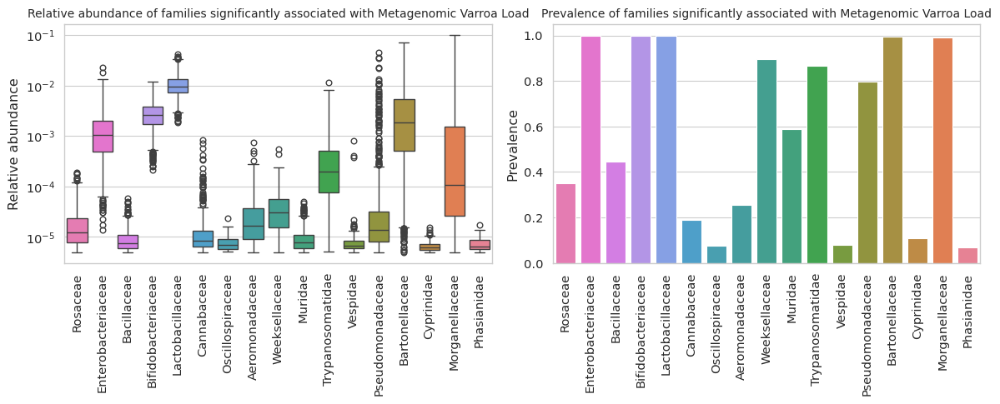

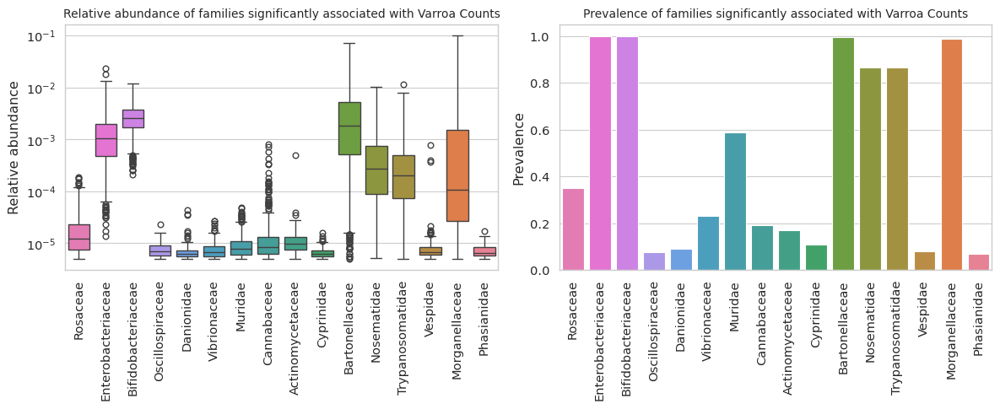

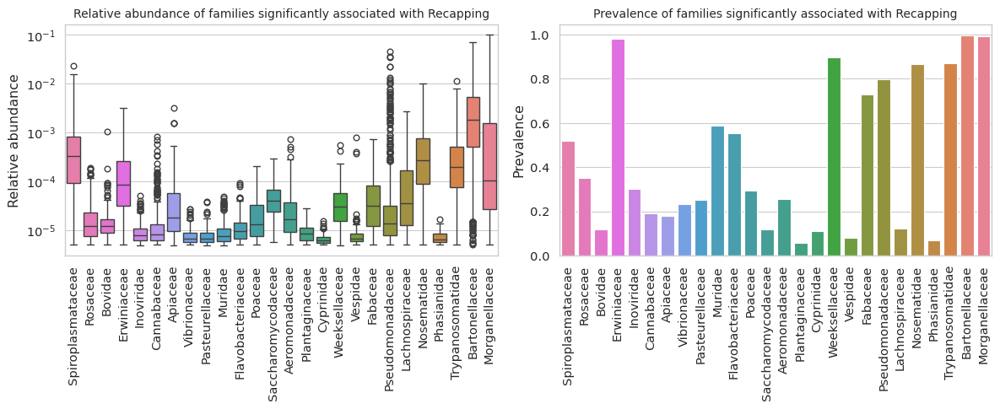

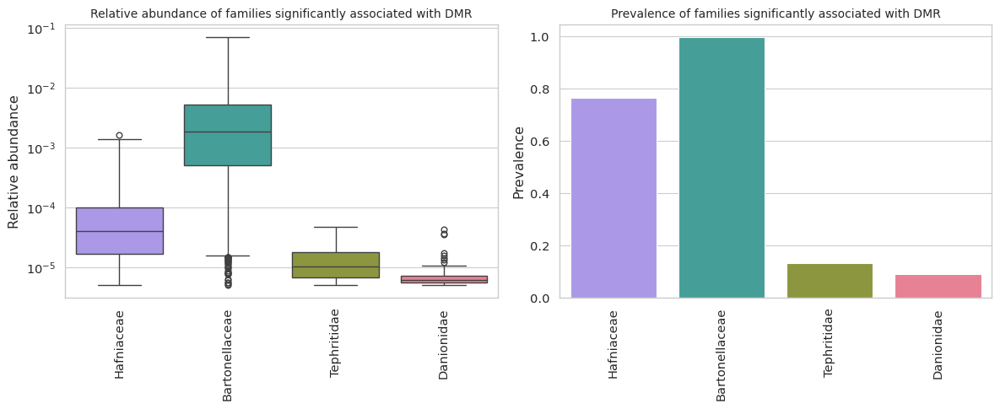

In [96]:
trait2fam_str = {
    'Metagenomic Varroa Load':"Phasianidae,Morganellaceae,Cyprinidae,Bartonellaceae,Pseudomonadaceae,Vespidae,Trypanosomatidae,Muridae,Weeksellaceae,Aeromonadaceae,Oscillospiraceae,Cannabaceae,Lactobacillaceae,Bifidobacteriaceae,Bacillaceae,Enterobacteriaceae,Rosaceae",
    'Varroa Counts': "Phasianidae,Morganellaceae,Vespidae,Trypanosomatidae,Nosematidae,Bartonellaceae,Cyprinidae,Actinomycetaceae,Cannabaceae,Muridae,Vibrionaceae,Danionidae,Oscillospiraceae,Bifidobacteriaceae,Enterobacteriaceae,Rosaceae",
    'Recapping': "Morganellaceae,Bartonellaceae,Trypanosomatidae,Phasianidae,Nosematidae,Lachnospiraceae,Pseudomonadaceae,Fabaceae,Vespidae,Weeksellaceae,Cyprinidae,Plantaginaceae,Aeromonadaceae,Saccharomycodaceae,Poaceae,Flavobacteriaceae,Muridae,Pasteurellaceae,Vibrionaceae,Apiaceae,Cannabaceae,Inoviridae,Erwiniaceae,Bovidae,Rosaceae,Spiroplasmataceae",
    'DMR': "Danionidae,Tephritidae,Bartonellaceae,Hafniaceae"
}

for trait, fam_str in trait2fam_str.items():
    varroa_fams = fam_str.split(',')
    cmap_fams = dict(zip(varroa_fams, sns.color_palette('husl', len(varroa_fams)).as_hex()))
    f_symbio_df = symbio_df[symbio_df['Taxon'].isin(varroa_fams)]
    f_prev_df = prev_df[prev_df['Taxon'].isin(varroa_fams)]

    fig, axes = plt.subplots(1, 2, figsize=(12, 5))
    
    sns.boxplot(data=f_symbio_df, x='Taxon', hue='Taxon', y='Relative abundance', order=varroa_fams[::-1], palette=cmap_fams, log_scale=True, ax=axes[0])
    axes[0].set_xlabel(None, fontsize=12)
    axes[0].tick_params(axis='x', labelrotation=90)
    axes[0].set_title("Relative abundance of families significantly associated with {}".format(trait), fontsize=10)
                      
    sns.barplot(data=f_prev_df, x='Taxon', hue='Taxon', y='Prevalence', palette=cmap_fams, order=varroa_fams[::-1], ax=axes[1])
    axes[1].set_xlabel(None, fontsize=12)
    axes[1].tick_params(axis='x', labelrotation=90)
    axes[1].set_title("Prevalence of families significantly associated with {}".format(trait), fontsize=10)
    
    plt.tight_layout()
    plt.show()

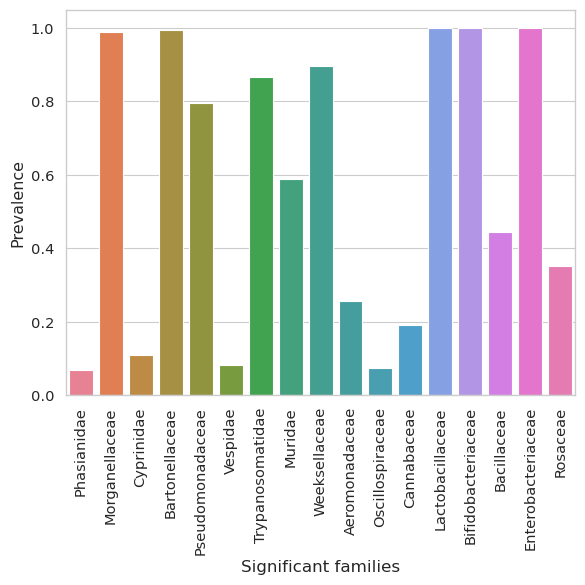

In [83]:
plt.figure(figsize=(6, 6))

ax = sns.barplot(data=f_prev_df, x='Taxon', hue='Taxon', y='Prevalence', palette=cmap_fams, order=varroa_fams)

# # Manually add the legend to the right side
# handles, labels = ax.get_legend_handles_labels()
# plt.legend(handles=handles, labels=labels, title='Family', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xlabel('Significant families', fontsize=12)

plt.xticks(rotation=90)
plt.tight_layout()
plt.show()